<div class="alert alert-block alert-info" style="background-color: white; text-align: center;">
  <h1> BUSINESS CASE 2: Sales Forecast - Siemens </h1>
  <h2> Group E _ PART 2 </h2>
    
  <p>  </p>
    
  <p> Business Cases for Data Science </p>
  <p> Masters in Data Science Spealization in Business Analytics - 2023/2024 </p>
    
  <p>  </p>
    
  <p><strong style="font-weight: bold;"> Group Members: </strong></p>
  <p> - Duarte Mendes 20230494 <p>
  <p> - Dzmitry Nisht 20230776 <p>
  <p> - Inês Silva 20201580 <p>
  <p> - José Marcal 20201581 <p>
  <p> - Ricardo Sousa 20201611 <p>
    
</div>

**Table of Contents** <br>

* [1. Notebook Setup: Packages and Module Loading](#1)
* [2. Data Modelling](#2)
    * [2.1. Product #1](#2_1)
    * [2.2. Product #3](#2_2)
    * [2.3. Product #4](#2_3)
    * [2.4. Product #5](#2_4)
    * [2.5. Product #6](#2_5)
    * [2.6. Product #8](#2_6)
    * [2.7. Product #9](#2_7)
    * [2.8. Product #11](#2_8)
    * [2.9. Product #12](#2_9)
    * [2.10. Product #13](#2_10)
    * [2.11. Product #14](#2_11)
    * [2.12. Product #16](#2_12)
    * [2.13. Product #20](#2_13)
    * [2.14. Product #36](#2_14)
* [3. Final Results and Export](#3)

<hr>

<a class="anchor" id="1">

# 1. Notebook Setup: Packages and Module Loading

</a>

In [1]:
# Python version -> 3.11.4
# ALL Sklearn base libraries -> 1.3.2

# Preparing and working w/ dataframe
import pandas as pd #1.5.3
import csv #1.0
import numpy as np #1.26.4
import locale # based on python version

# Visualizations
import seaborn as sns # 0.12.2
import matplotlib.pyplot as plt # 3.7.1
import matplotlib.dates as mdates # 3.7.1

# Machine Learning Models
import xgboost as xgb #2.0.3
from sklearn.model_selection import GridSearchCV 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Time series Models
from neuralprophet import NeuralProphet, set_log_level #0.8.0
from neuralprophet import set_random_seed #0.8.0
from itertools import product # based on python version
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm # 0.14.0
from statsmodels.tsa.statespace.sarimax import SARIMAX # 0.14.0
from statsmodels.tsa.arima.model import ARIMA # 0.14.0

Importing plotly failed. Interactive plots will not work.
Importing plotly failed. Interactive plots will not work.


In [2]:
# Disable logging messages unless there is an error - for neuralprophet
set_log_level("ERROR")

# remove warnings // from: https://stackoverflow.com/questions/14463277/how-to-disable-python-warnings
import warnings #based on python sys
warnings.filterwarnings("ignore")

<hr>

<a class="anchor" id="2">

# 2. Data modelling

</a>

<hr>

<a class="anchor" id="2_1">

## 2.1 Product #1

</a>

**IMPORT**

In [3]:
p1 = pd.read_csv("sales_p1.csv")
p1

,Full_Date,US Producer Prices Electrical eq. LAG6,France Shipments Index M&E LAG9,UK Production Index Electrical eq. LAG6,Japan Production Index M&E LAG12,Japan Production Index Electrical eq. LAG12,Europe Shipments Index M&E LAG9,Price of Natural gas index LAG10,Germany Production Index M&E LAG9,Sales € LAG3,Switzerland Production Index M&E LAG7,Germany Shipments Index M&E LAG9,Sales €,Switzerland Production Index Machinery eq. LAG9,Sales € LAG6,Italy Shipments Index M&E LAG9,Price of Energy LAG10,China Producer Prices Electrical eq. LAG8
0,2019-04-01,110.40,127.10,110.30,153.90,141.50,136.50,76.50,126.94,27728148.0,103.20,148.00,39688292.0,100.94,36098920.0,127.00,94.60,97.06
1,2019-05-01,110.70,104.75,118.70,115.56,108.30,120.44,78.30,116.75,34793164.0,105.94,129.90,38897976.0,101.56,30742242.0,121.40,93.70,96.75
2,2019-06-01,111.00,92.80,120.44,115.40,107.06,112.30,77.50,114.70,33856804.0,109.06,130.00,39106752.0,102.20,37889612.0,74.44,93.00,96.56
3,2019-07-01,111.20,110.50,105.40,126.94,118.75,127.70,81.70,118.56,39688292.0,112.25,136.60,37912572.0,102.80,27728148.0,115.30,92.00,96.30
4,2019-08-01,111.40,122.44,107.20,123.20,116.50,131.00,89.20,124.25,38897976.0,115.40,137.80,38042676.0,106.80,34793164.0,122.44,98.75,95.40
5,2019-09-01,111.56,115.94,110.60,115.20,103.00,132.90,89.56,127.40,39106752.0,109.60,142.80,40602780.0,110.80,33856804.0,120.10,100.25,95.00
6,2019-10-01,111.94,115.10,126.20,127.80,114.50,131.20,97.40,120.50,37912572.0,103.80,141.40,39012300.0,114.75,39688292.0,131.90,84.44,94.94
7,2019-11-01,111.40,108.30,113.50,125.20,112.40,113.06,94.44,104.75,38042676.0,98.06,118.70,37323904.0,109.20,38897976.0,92.44,74.90,94.70
8,2019-12-01,111.60,108.94,117.56,122.60,111.94,117.70,80.06,109.60,40602780.0,97.06,122.70,37701508.0,103.60,39106752.0,103.20,76.20,94.44
9,2020-01-01,110.56,126.94,123.10,123.00,112.50,135.90,69.56,122.56,39012300.0,96.10,140.10,34116652.0,98.06,37912572.0,122.44,80.06,93.90


In [4]:
X = p1.drop(columns=['Sales €', 'Full_Date'])
y = p1['Sales €']

# 'Full_Date' column to datetime
p1['Full_Date'] = pd.to_datetime(p1['Full_Date'])

**LINEAR REGRESSION**

In [5]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))


Train scores: [1955930.35641921 2134703.17695088 1773318.27024806 1809354.95599406
 1952700.7944586 ]
Validation scores: [4653658.72486932 2888763.0789181  4231753.08402048 6601700.2284673
 3767437.64532994]

Average Train RMSE: 1925201.51
Average Validation RMSE: 4428662.55


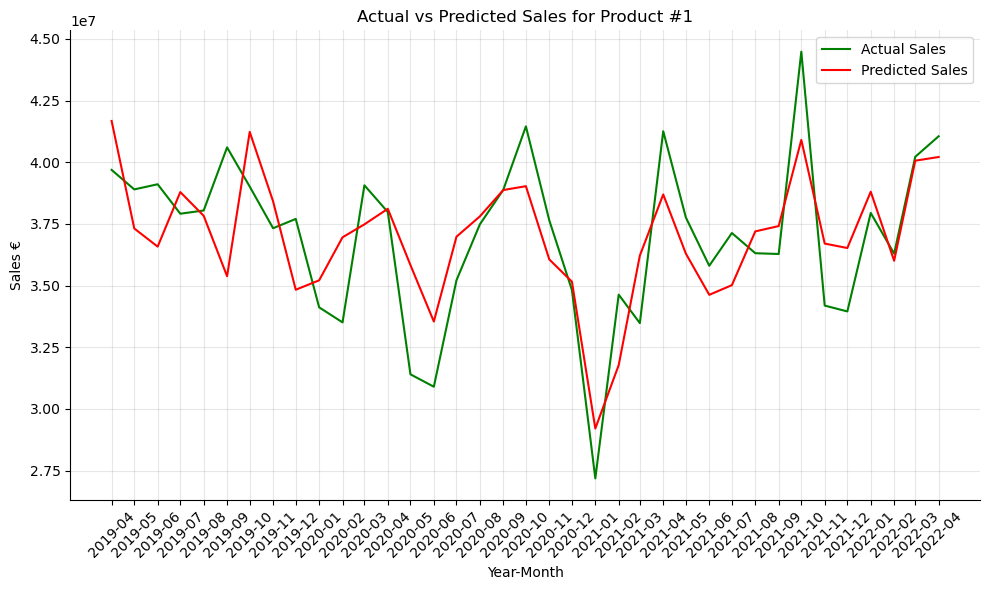

In [6]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p1['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p1['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p1['Full_Date'], p1['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [7]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [8]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))


Train scores: [1988025.6905631  1854428.57962398 1582725.3121769  1830531.55957665
 2056487.66156882]
Validation scores: [2556482.93177443 3216682.06628072 3989023.2647421  3641336.36328148
 3059942.86709054]

Average Train RMSE: 1862439.76
Average Validation RMSE: 3292693.5


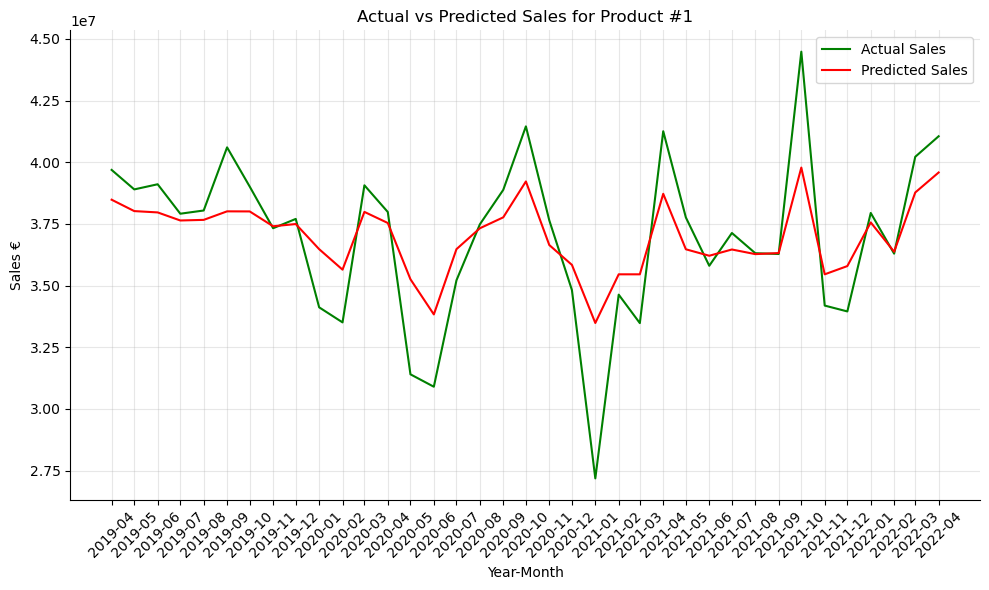

In [9]:
# Fit the mode
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p1['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p1['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p1['Full_Date'], p1['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [10]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


In [11]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [2182239.8330428  2194812.39579915 1747048.91132393 2048853.38827849
 2232124.35631994]
Validation scores: [2533507.8891838  3123984.39471083 4053738.52200871 3149115.20524497
 2468063.57279802]

Average Train RMSE: 2081015.78
Average Validation RMSE: 3065681.92


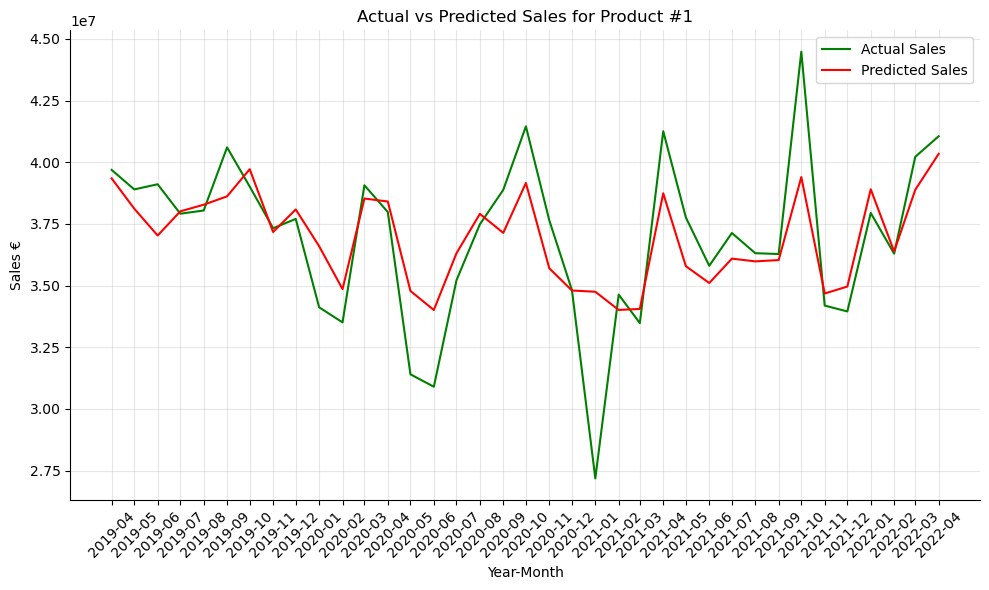

In [12]:
# Fit the mode
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p1['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p1['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p1['Full_Date'], p1['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [13]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s

In [14]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [990869.39689671 770233.25160057 693876.90305322 940074.31474278
 899699.52909139]
Validation scores: [4098278.65247534 6068882.90551068 5896937.32253201 2611138.13397042
 4262196.75568072]

Average Train RMSE: 858950.68
Average Validation RMSE: 4587486.75


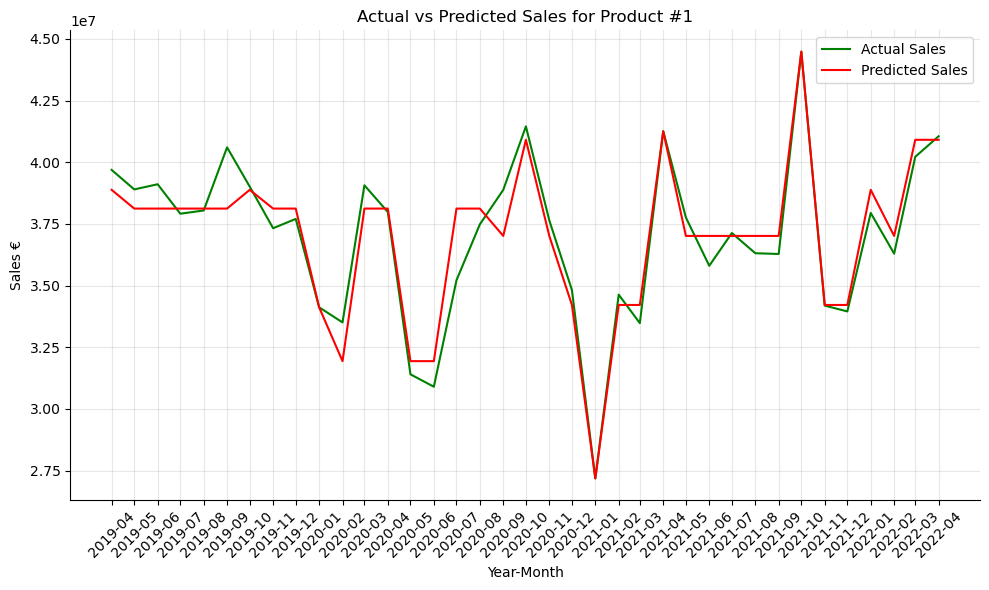

In [15]:
# Fit the mode
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p1['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p1['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p1['Full_Date'], p1['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

* Decision Tree present overfitting!

**NEURAL PROPHET**

In [16]:
df = pd.DataFrame({
    'ds': p1['Full_Date'],
    'y': y
})

set_random_seed(0)
model_pf1 = NeuralProphet()
model_pf1.set_plotting_backend("plotly-static")

In [17]:
df_train, df_val = model_pf1.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 37
Train dataset size: 30
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/202 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,5834767.50,7366463.50,0.289185,0.0,0,9708514.000,1.110551e+07,0.386359,0.0
1,5521065.00,7092272.50,0.271370,0.0,1,9376658.000,1.061760e+07,0.366876,0.0
2,5223163.50,6829560.00,0.255747,0.0,2,9231039.000,1.034565e+07,0.357313,0.0
3,4935959.00,6593505.00,0.242284,0.0,3,8890066.000,1.030660e+07,0.340947,0.0
4,4686513.00,6376316.50,0.230596,0.0,4,8915378.000,1.022837e+07,0.342505,0.0
...,...,...,...,...,...,...,...,...,...
405,3316301.50,4083132.00,0.124954,0.0,405,1311895.875,1.484381e+06,0.014712,0.0
406,3317740.50,4084545.00,0.125036,0.0,406,1328525.750,1.529291e+06,0.015250,0.0
407,3317676.50,4084434.25,0.125031,0.0,407,1358138.875,1.539927e+06,0.015703,0.0
408,3319193.50,4085729.25,0.125111,0.0,408,1320631.750,1.498721e+06,0.014810,0.0


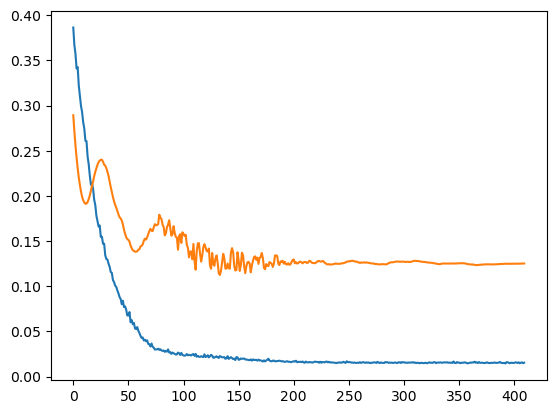

In [18]:
nprof_metrics = model_pf1.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

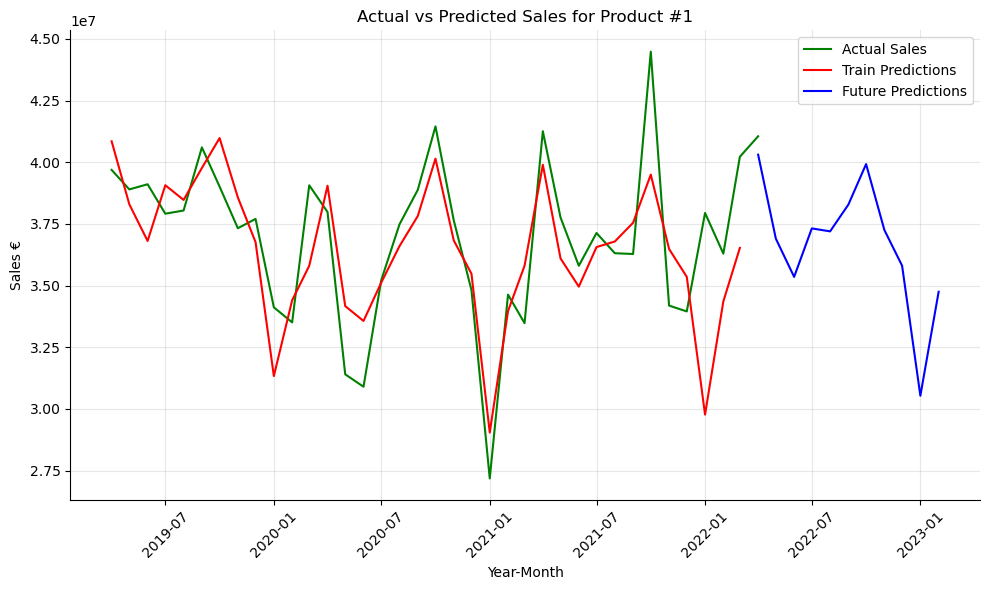

In [19]:
future = model_pf1.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_pf1.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()


In [20]:
# Compute RMSE
forecast = model_pf1.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 2260577.91


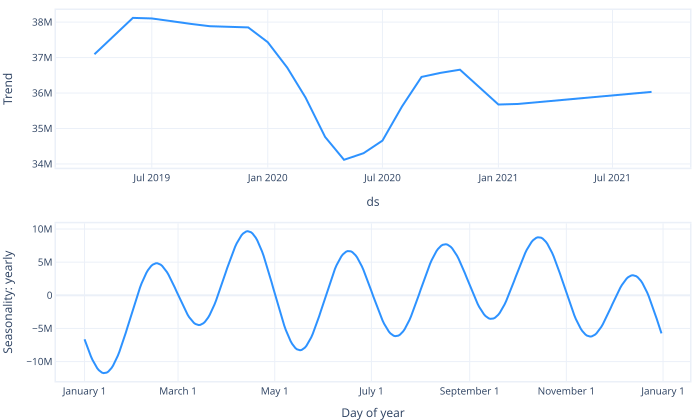

In [21]:
model_pf1.plot_parameters(components=["trend", "seasonality"])

In [22]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-04-01,39688292.0,40848724.0,37093552.0,3.755175e+06
1,2019-05-01,38897976.0,38293840.0,37597784.0,6.960562e+05
2,2019-06-01,39106752.0,36807968.0,38118824.0,-1.310860e+06
3,2019-07-01,37912572.0,39067824.0,38102804.0,9.650204e+05
4,2019-08-01,38042676.0,38471620.0,38020008.0,4.516130e+05
5,2019-09-01,40602780.0,39765828.0,37949288.0,1.816537e+06
6,2019-10-01,39012300.0,40980612.0,37884008.0,3.096605e+06
7,2019-11-01,37323904.0,38572408.0,37857460.0,7.149462e+05
8,2019-12-01,37701508.0,36759256.0,37850272.0,-1.091017e+06
9,2020-01-01,34116652.0,31328074.0,37433260.0,-6.105187e+06


**ARIMA**

In [23]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model1 = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model1.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   37
Model:                 ARIMA(4, 0, 3)   Log Likelihood                -602.836
Date:                Wed, 10 Apr 2024   AIC                           1223.673
Time:                        19:40:04   BIC                           1238.171
Sample:                             0   HQIC                          1228.784
                                 - 37                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.699e+07   1.18e+06     31.408      0.000    3.47e+07    3.93e+07
ar.L1          0.5215      4.355      0.120      0.905      -8.014       9.057
ar.L2         -0.6457      4.200  

* Due to lack of convergence the model might not be the best fit for the data

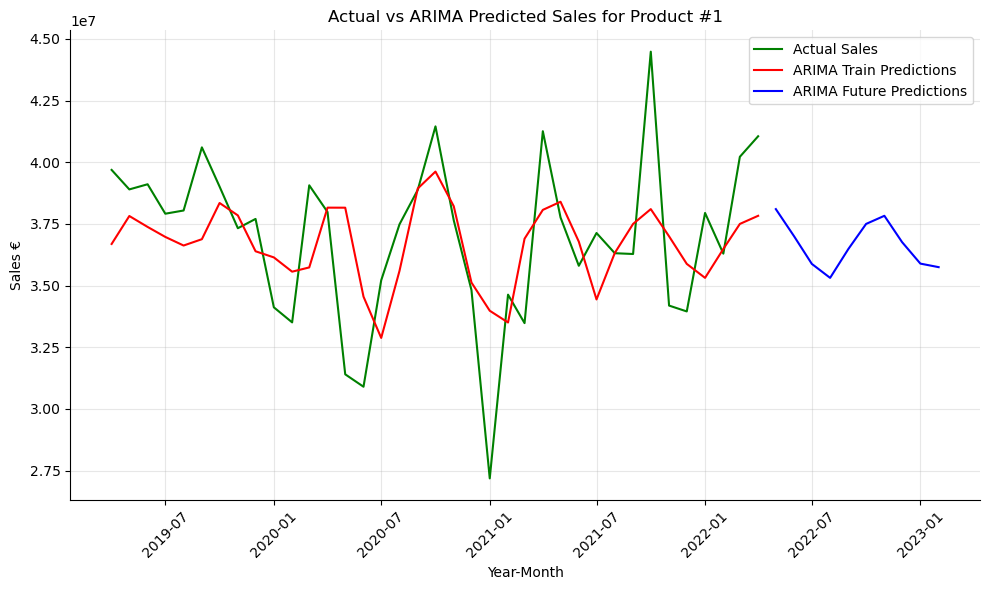

Train RMSE: 2601891.6645145854
Validation RMSE: 3319524.121846999


In [24]:
# Fit ARIMA model
arima_model1 = ARIMA(df_train['y'], order=(4,0,3))
arima_fit = arima_model1.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [25]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model1 = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model1.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   37
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -402.589
Date:                            Wed, 10 Apr 2024   AIC                            809.177
Time:                                    19:42:14   BIC                            811.533
Sample:                                         0   HQIC                           809.802
                                             - 37                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.3075      0.113     -2.730      0.006      -0.528      -0.087
sigma2      1.99

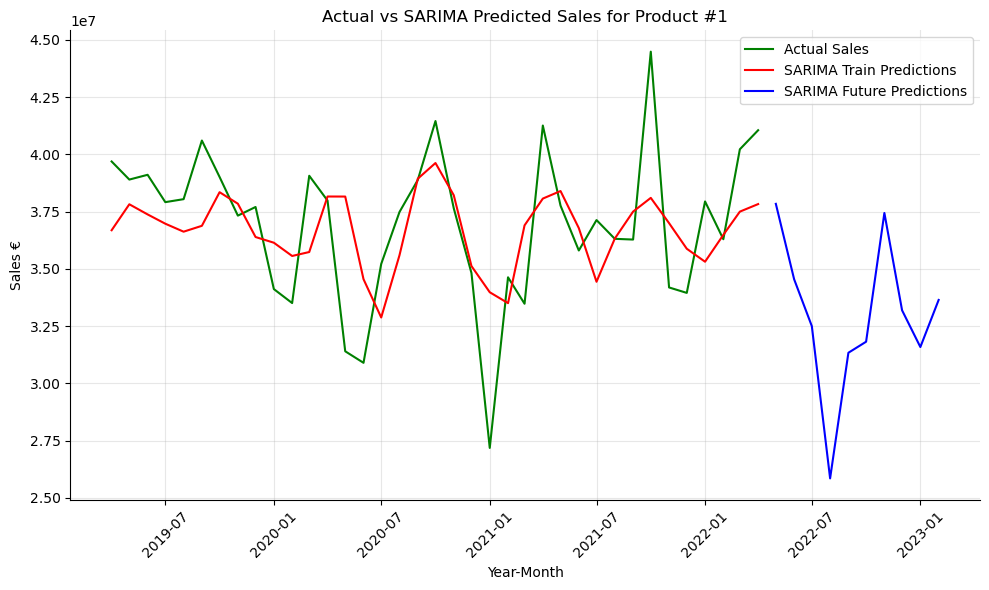

Train RMSE: 2601891.6645145854
Validation RMSE: 3319524.121846999


In [26]:
# Fit SARIMA model
sarima_model1 = SARIMAX(df_train['y'], order=(0, 1, 0), seasonal_order=(1, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model1.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #1'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 2260577.91 |  
| ARIMA    | 3319524.12    | 
| SARIMA    | 3811239.03   |

In [27]:
predicted_values_1 = forecast['yhat1'].values[-10:]  
predicted_table_1 = forecast[-10:] 

<hr>

<a class="anchor" id="2_2">
    
##    2.2 Product #3
    
</a>

In [28]:
p3 = pd.read_csv("sales_p3.csv")
p3.head()

,Full_Date,Italy Production Index M&E LAG3,UK Production Index M&E LAG12,United States: EUR in LCU LAG5,Germany Production Index Electrical eq. LAG8,Global Production Index Electrical eq. LAG11,China Production Index M&E LAG2,Japan Production Index Electrical eq. LAG9,US Producer Prices Electrical eq. LAG5,Italy Production Index Electrical eq. LAG3,Sales €,US Shipments Index M&E LAG2,France Production Index M&E LAG12,Japan Production Index M&E LAG9,France Producer Prices Electrical eq. LAG5,UK Production Index Electrical eq. LAG7,China Producer Prices Electrical eq. LAG10
0,2018-10-01,115.25,112.10,1.228,110.40,122.75,207.9,116.4,108.00,89.44,8089466.0,117.75,103.60,127.25,102.50,99.6,96.60
1,2018-11-01,116.50,108.80,1.182,107.25,125.94,197.5,103.6,108.56,90.80,11863002.0,128.20,107.70,112.44,102.25,109.2,96.44
2,2018-12-01,60.75,114.20,1.168,117.06,114.94,199.4,111.8,108.75,46.90,8736859.0,126.00,101.06,119.80,102.56,99.4,96.70
3,2019-01-01,105.44,102.00,1.169,108.70,110.44,212.0,141.5,110.00,85.20,10705301.0,127.80,101.40,153.90,102.50,102.5,96.60
4,2019-02-01,118.40,104.06,1.155,106.75,110.56,220.5,108.3,110.10,93.00,10167797.0,117.70,91.00,115.56,102.50,105.1,96.20


In [29]:
X = p3.drop(columns=['Sales €', 'Full_Date'])
y = p3['Sales €']

# 'Full_Date' column to datetime
p3['Full_Date'] = pd.to_datetime(p3['Full_Date'])

**LINEAR REGRESSION**

In [30]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))


Train scores: [1376029.14291265 1119518.98488638 1375069.6228035  1506377.99781706
 1271306.16988689]
Validation scores: [2577529.43549077 4421971.89558858 3066912.94664031 2623941.61598783
 3696585.49893574]

Average Train RMSE: 1329660.38
Average Validation RMSE: 3277388.28


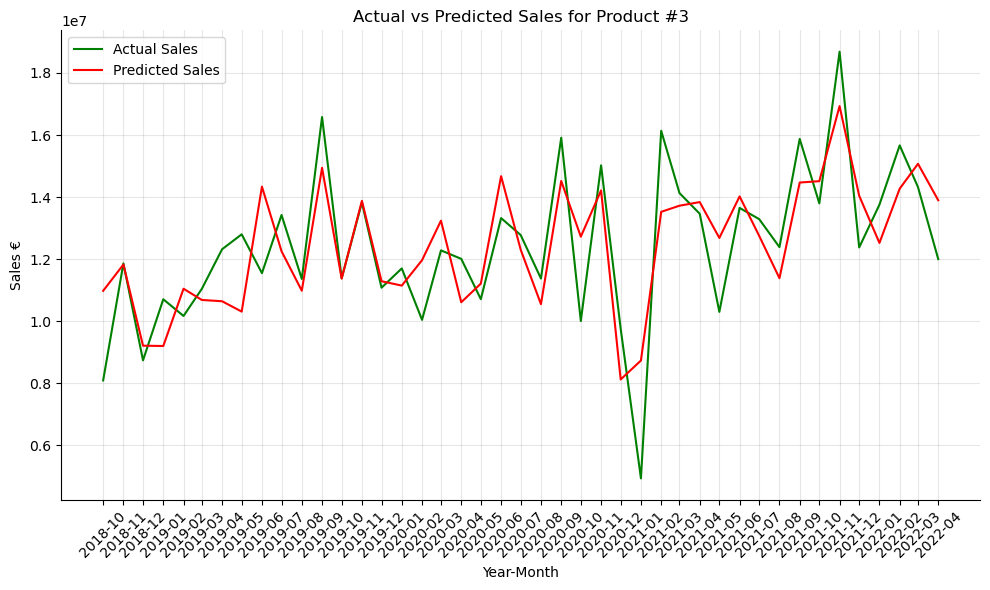

In [31]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p3['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p3['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #3')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p3['Full_Date'], p3['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [32]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [33]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1.31830997 1.61108294 1.12511437 1.45690474 1.22695907]
Validation scores: [2625444.98769576 3433883.14393763 2331181.03595355 1548979.89862312
 1592490.7394832 ]

Average Train RMSE: 1.35
Average Validation RMSE: 2306395.96


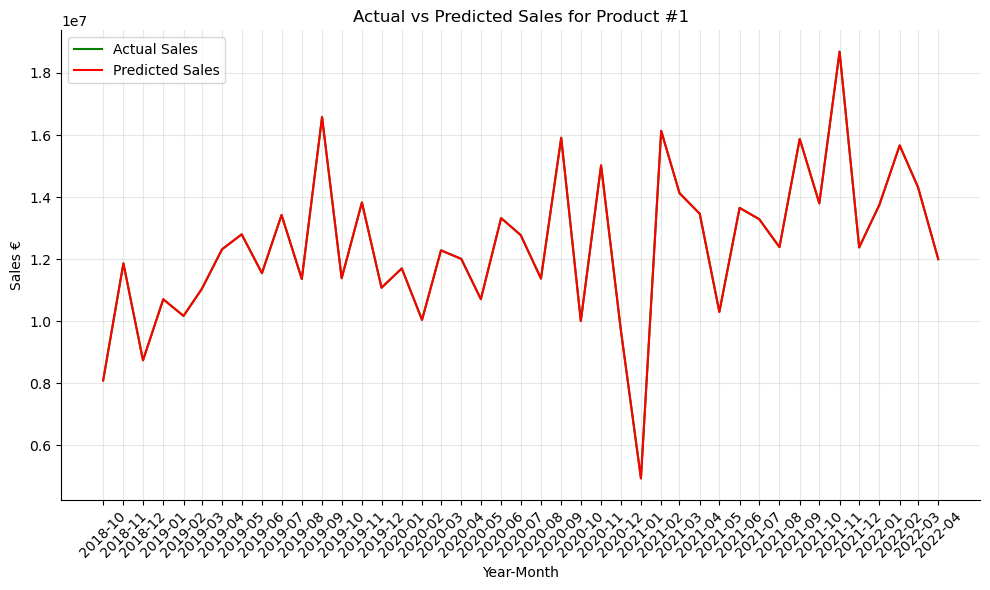

In [34]:
# Fit the mode
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p3['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p3['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)
plt.xticks(p3['Full_Date'], p3['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [35]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}


In [36]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1089727.47553555 1140378.21184812 1281677.18355673 1309869.54823037
 1428795.84617677]
Validation scores: [2454321.88953323 3310021.68332579 1864320.4319865  1543537.43176621
 1206954.54735147]

Average Train RMSE: 1250089.65
Average Validation RMSE: 2075831.2


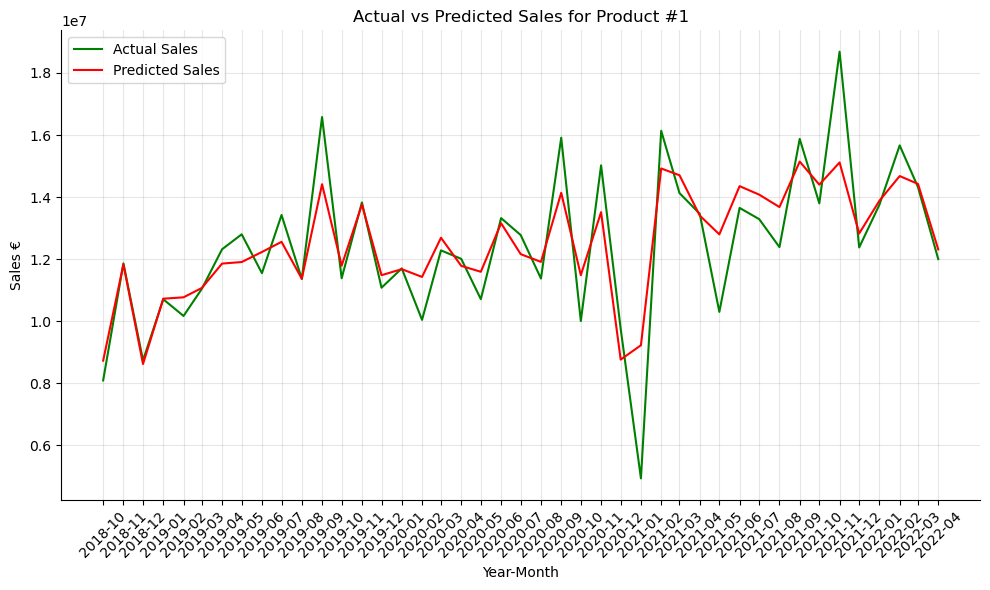

In [37]:
# Fit the mode
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p3['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p3['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p3['Full_Date'], p3['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [38]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s

In [39]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [ 879291.65888131  790747.12200637 1316652.78485709 1041003.66345569
  955461.85717218]
Validation scores: [2074745.01940349 4299041.85640402 2335702.2023204  3171804.54958951
 1802210.88819006]

Average Train RMSE: 996631.42
Average Validation RMSE: 2736700.9


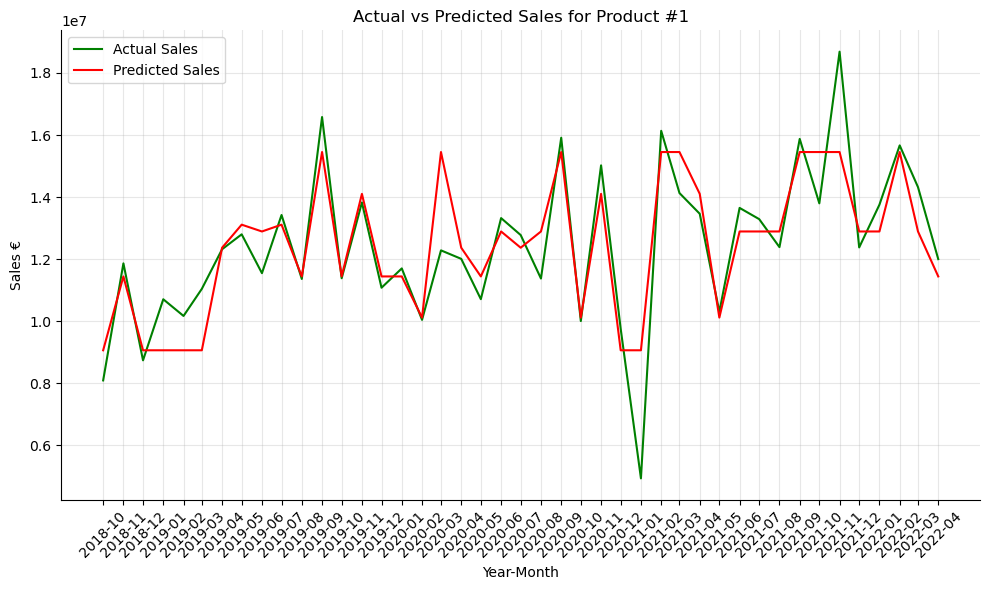

In [40]:
# Fit the mode
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p3['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p3['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #1')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p3['Full_Date'], p3['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [41]:
df = pd.DataFrame({
    'ds': p3['Full_Date'],
    'y': y
})

set_random_seed(0)
model_pf3 = NeuralProphet()
model_pf3.set_plotting_backend("plotly-static")

In [42]:
df_train, df_val = model_pf3.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 43
Train dataset size: 35
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,4920089.000,6080097.50,0.328692,0.0,0,6.821401e+06,7605615.000,0.329541,0.0
1,4842967.000,5813890.50,0.311640,0.0,1,6.861935e+06,8039493.000,0.326938,0.0
2,4754127.500,5577820.00,0.296493,0.0,2,6.752743e+06,7970951.000,0.322463,0.0
3,4654612.000,5344926.50,0.282204,0.0,3,6.285280e+06,7548880.000,0.288406,0.0
4,4553505.000,5121564.00,0.269017,0.0,4,6.157238e+06,7276041.500,0.285192,0.0
...,...,...,...,...,...,...,...,...,...
375,1827974.375,2130365.25,0.061785,0.0,375,1.066755e+06,1327109.125,0.018603,0.0
376,1825749.750,2127933.00,0.061651,0.0,376,8.752883e+05,1115354.125,0.014960,0.0
377,1824629.250,2127040.00,0.061600,0.0,377,8.716494e+05,1109158.500,0.014913,0.0
378,1823820.125,2126411.75,0.061565,0.0,378,1.006937e+06,1293136.125,0.017649,0.0


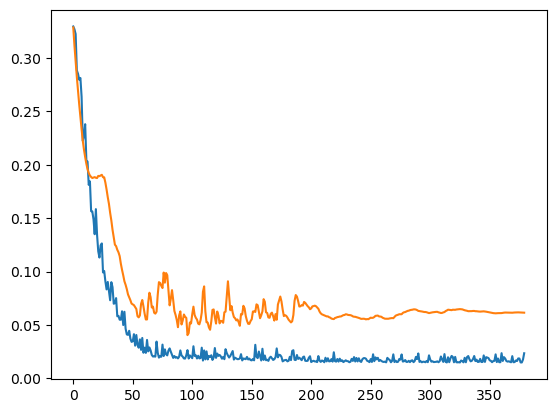

In [43]:
nprof_metrics = model_pf3.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

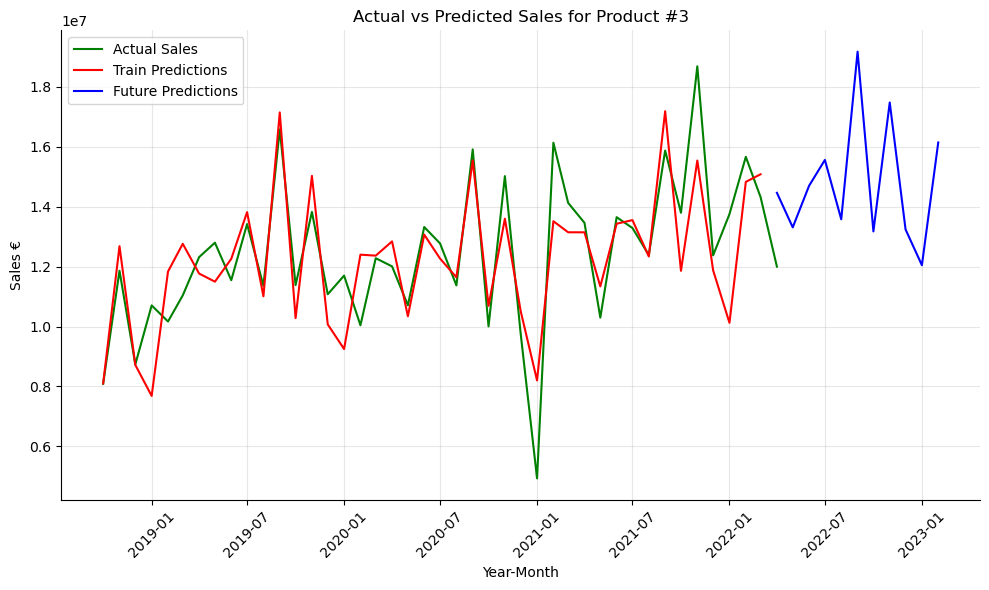

In [44]:
future = model_pf3.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_pf3.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #3')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [45]:
# Compute RMSE
forecast = model_pf3.predict(future)
predicted_sales = forecast['yhat1'].values[:-10] 
actual_sales = forecast['y'].values[:-10] 
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 1480871.38


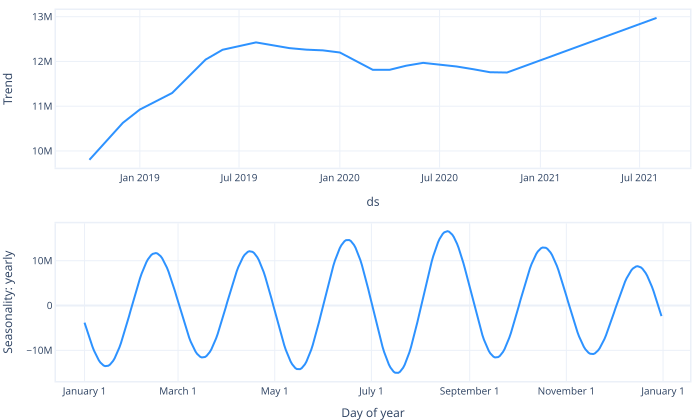

In [46]:
model_pf3.plot_parameters(components=["trend", "seasonality"])

In [47]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-10-01,8089466.0,8100683.0,9802935.0,-1.702252e+06
1,2018-11-01,11863002.0,12682608.0,10222444.0,2.460164e+06
2,2018-12-01,8736859.0,8718422.0,10628420.0,-1.909998e+06
3,2019-01-01,10705301.0,7684150.0,10925714.0,-3.241564e+06
4,2019-02-01,10167797.0,11835779.0,11118726.0,7.170532e+05
5,2019-03-01,11040545.0,12762109.0,11295788.0,1.466321e+06
6,2019-04-01,12317480.0,11768962.0,11674828.0,9.413466e+04
7,2019-05-01,12798945.0,11497703.0,12041640.0,-5.439368e+05
8,2019-06-01,11546452.0,12260326.0,12261034.0,-7.076736e+02
9,2019-07-01,13421551.0,13818285.0,12349100.0,1.469185e+06


**ARIMA**

In [48]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   43
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -690.982
Date:                Wed, 10 Apr 2024   AIC                           1401.964
Time:                        19:47:42   BIC                           1419.576
Sample:                             0   HQIC                          1408.459
                                 - 43                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.243e+07    5.3e-07   2.35e+13      0.000    1.24e+07    1.24e+07
ar.L1         -0.0213      0.693     -0.031      0.976      -1.380       1.338
ar.L2          0.9945      0.820  

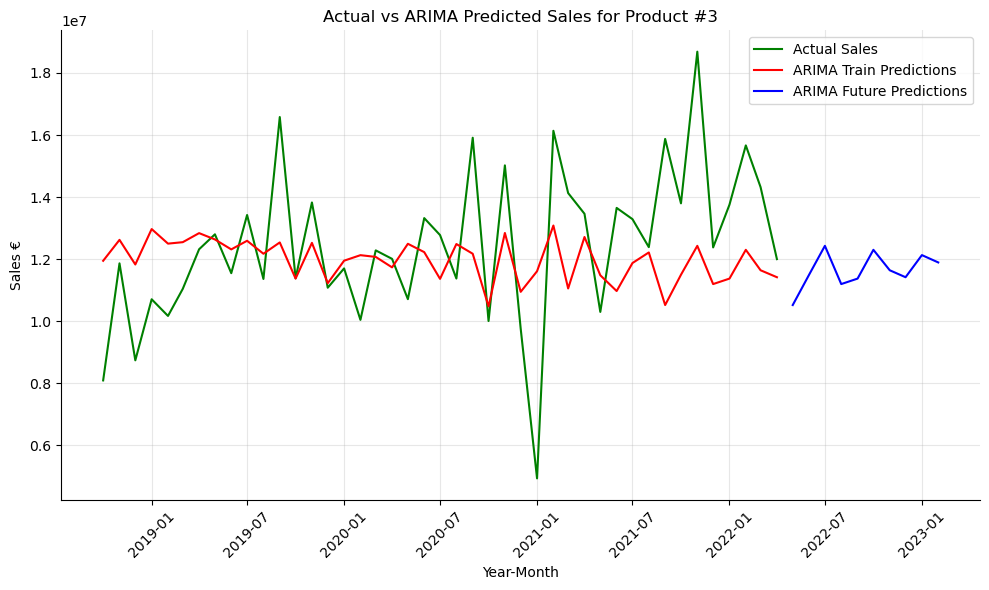

Train RMSE: 2172371.816283787
Validation RMSE: 3519207.666816636


In [49]:
# Fit ARIMA model
arima_model3 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model3.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #3')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [50]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   43
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -488.890
Date:                            Wed, 10 Apr 2024   AIC                            983.779
Time:                                    19:49:54   BIC                            987.983
Sample:                                         0   HQIC                           985.124
                                             - 43                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4518      0.118     -3.840      0.000      -0.682      -0.221
ma.S.L12      -0

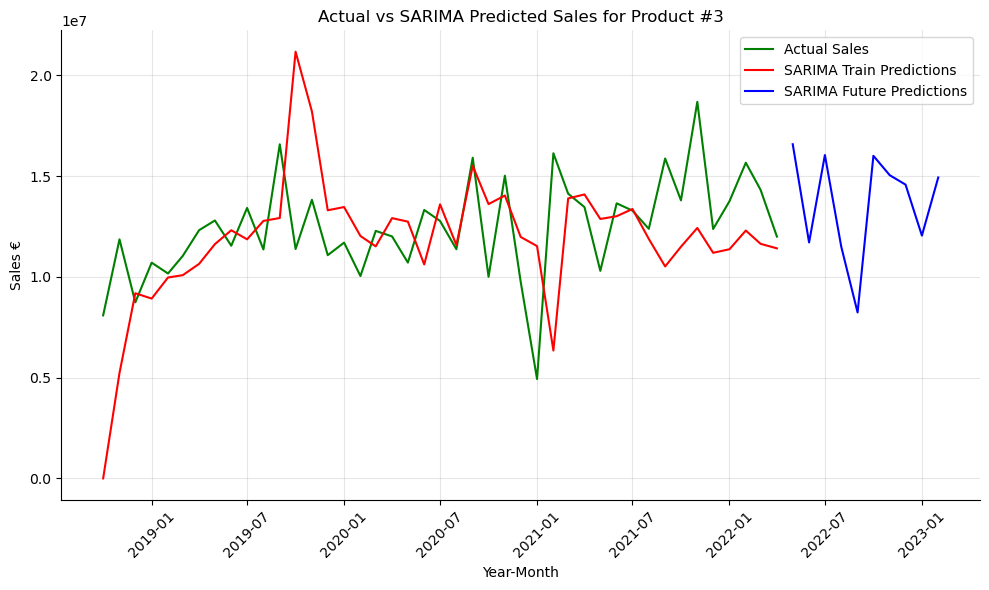

Train RMSE: 3558901.133703536
Validation RMSE: 3519207.666816636


In [51]:
# Fit SARIMA model
sarima_model3 = SARIMAX(df_train['y'], order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model3.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #3'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 1480871.38 |  
| ARIMA    | 3519207.66    | 
| SARIMA    | 3520593.46   |

In [52]:
predicted_values_3 = forecast['yhat1'].values[-10:]  
predicted_table_3 = forecast[-10:] 

<hr>

<a class="anchor" id="2_3">
    
##    2.3 Product 4
    
</a>

In [53]:
p4 = pd.read_csv("sales_p4.csv")
p4.head()

,Full_Date,Switzerland Production Index Machinery eq. LAG12,Europe Shipments Index M&E LAG12,France Production Index M&E LAG9,US Production Index M&E LAG9,Sales € LAG3,Germany Production Index Electrical eq. LAG5,Sales €,Europe Production Index M&E LAG12,US Shipments Index M&E LAG9,Italy Shipments Index M&E LAG12,Global Production Index Electrical eq. LAG12,Japan Production Index Electrical eq. LAG1
0,2019-01-01,109.30,134.90,111.94,109.06,397760.68750,111.2,484173.87500,117.20,131.00,131.60,114.94,111.94
1,2019-02-01,105.40,108.94,92.25,111.60,371322.40625,111.3,620031.81250,105.25,120.44,86.44,110.44,112.50
2,2019-03-01,101.44,112.75,88.50,110.00,430100.96875,110.9,491643.59375,108.00,126.25,100.50,110.56,95.94
3,2019-04-01,97.50,132.20,109.75,112.70,484173.87500,118.3,426221.34375,124.06,133.80,120.25,128.10,107.30
4,2019-05-01,98.60,116.94,100.80,106.56,620031.81250,117.2,375671.56250,110.60,117.75,102.90,117.70,131.50


In [54]:
X = p4.drop(columns=['Sales €', 'Full_Date'])
y = p4['Sales €']

# 'Full_Date' column to datetime
p4['Full_Date'] = pd.to_datetime(p4['Full_Date'])

**LINEAR REGRESSION**

In [55]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [107839.68968311 110281.4165183   94785.46673936 119986.44012052
 114501.18835325]
Validation scores: [204569.9077807  164542.14747662 200670.25594846 129545.3343756
 141321.13890344]

Average Train RMSE: 109478.84
Average Validation RMSE: 168129.76


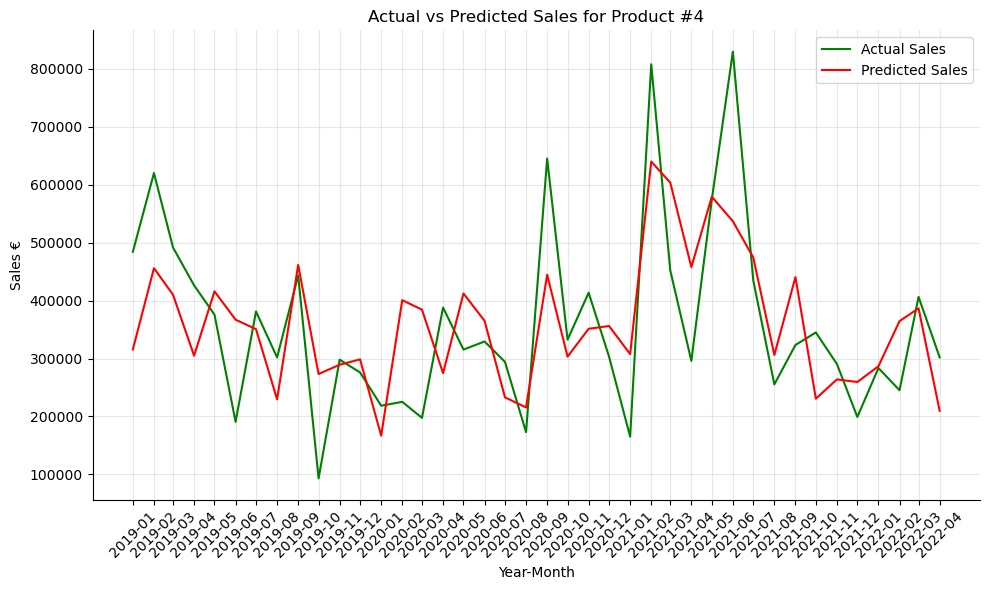

In [56]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p4['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p4['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p4['Full_Date'], p4['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [57]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [58]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [0.0572269  0.06182497 0.05924121 0.06286514 0.04825839]
Validation scores: [145991.94427317 125829.72994591 152827.98482242 114381.73612453
 143595.66533289]

Average Train RMSE: 0.06
Average Validation RMSE: 136525.41


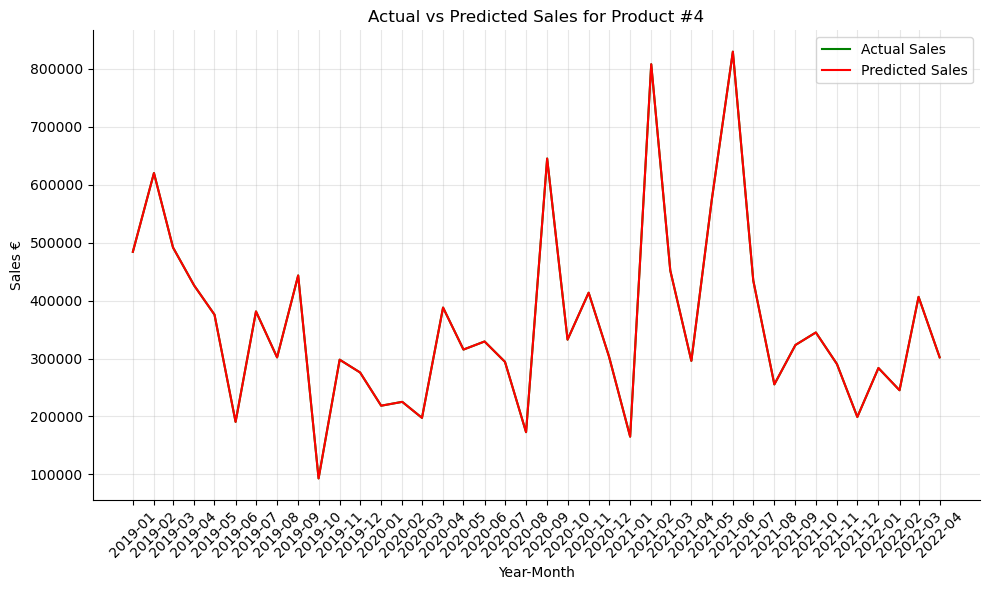

In [59]:
# Fit the mode
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p4['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p4['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)
plt.xticks(p4['Full_Date'], p4['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [60]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [61]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [47603.30012538 52189.2020949  49423.99806318 51758.04060364
 46047.16260429]
Validation scores: [115141.23770705 139275.16263755 162506.56412908 129629.21811411
 133064.78955039]

Average Train RMSE: 49404.34
Average Validation RMSE: 135923.39


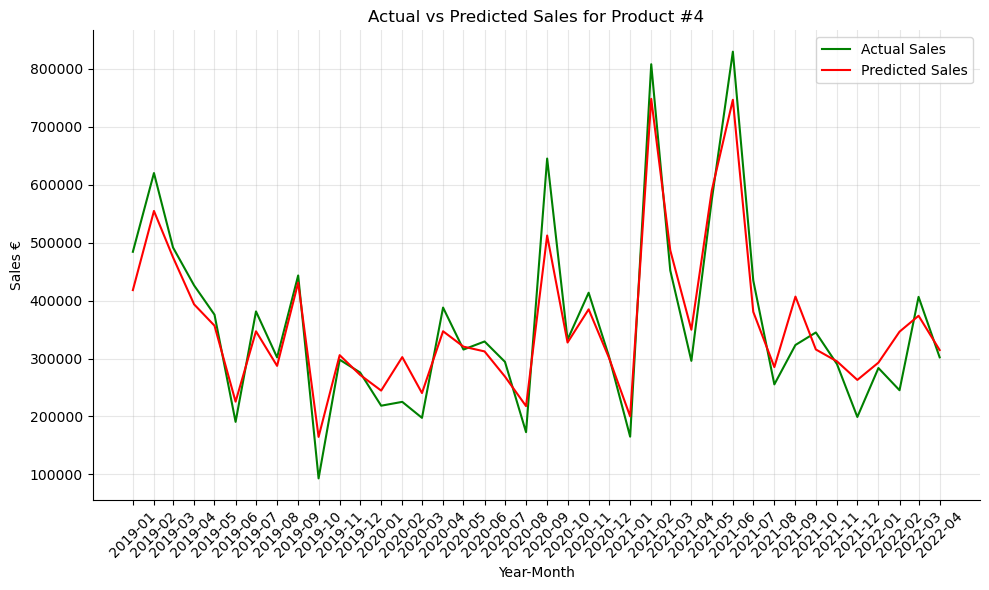

In [62]:
# Fit the mode
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p4['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p4['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p4['Full_Date'], p4['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [63]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[C

In [64]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [61885.38327299 54079.27634476 41837.11747803 35446.47826499
 31107.28874462]
Validation scores: [140182.29401704 159197.05104744 224209.71312652 132945.88964619
 226150.4645703 ]

Average Train RMSE: 44871.11
Average Validation RMSE: 176537.08


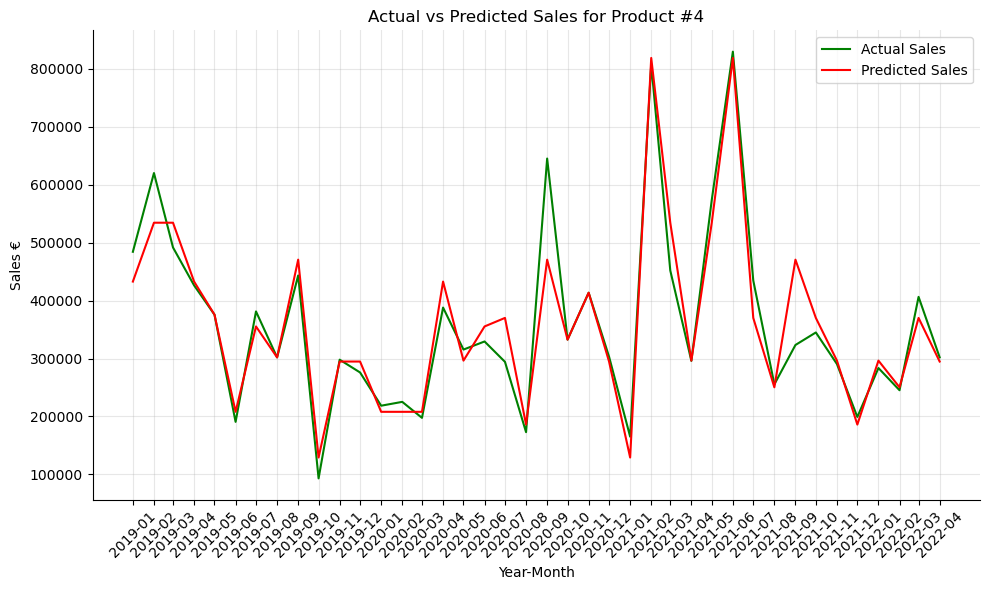

In [65]:
# Fit the mode
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p4['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p4['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p4['Full_Date'], p4['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [66]:
df = pd.DataFrame({
    'ds': p4['Full_Date'],
    'y': y
})

set_random_seed(0)
model_np4 = NeuralProphet()
model_np4.set_plotting_backend("plotly-static")

In [67]:
df_train, df_val = model_np4.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 40
Train dataset size: 32
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,165338.593750,198884.875000,0.150772,0.0,0,331501.562500,406356.312500,0.275817,0.0
1,171873.125000,204400.593750,0.156921,0.0,1,323148.500000,401150.781250,0.266529,0.0
2,178904.453125,211522.203125,0.165270,0.0,2,316245.531250,378608.187500,0.257576,0.0
3,185176.046875,218518.375000,0.173799,0.0,3,309572.500000,363170.875000,0.249785,0.0
4,191528.765625,226015.515625,0.183307,0.0,4,304340.562500,371950.062500,0.242328,0.0
...,...,...,...,...,...,...,...,...,...
395,304101.375000,333984.218750,0.341645,0.0,395,82968.625000,106167.945312,0.034445,0.0
396,304055.500000,333931.468750,0.341576,0.0,396,82965.265625,105852.179688,0.034444,0.0
397,304081.937500,333956.000000,0.341618,0.0,397,82962.578125,103196.703125,0.034443,0.0
398,304012.375000,333893.312500,0.341512,0.0,398,82967.140625,104142.757812,0.034447,0.0


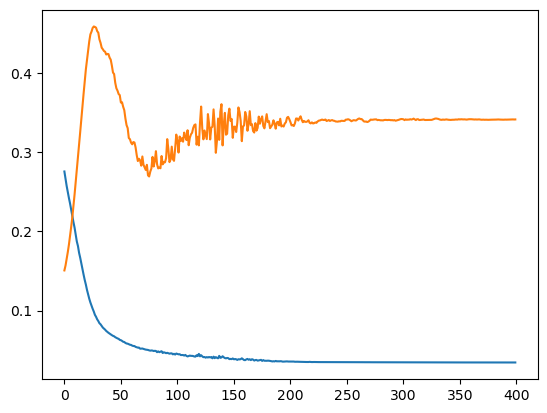

In [68]:
nprof_metrics = model_np4.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

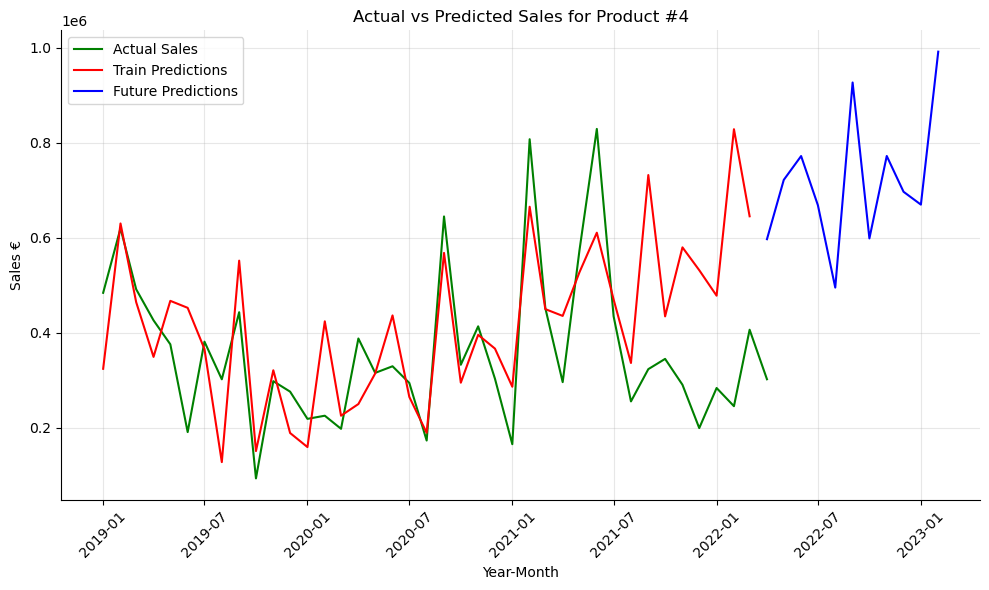

In [69]:
future = model_np4.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_np4.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [70]:
# Compute RMSE
forecast = model_np4.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 177104.01


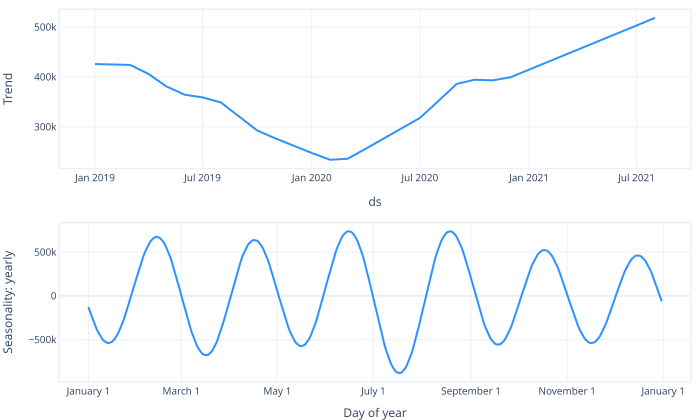

In [71]:
model_np4.plot_parameters(components=["trend", "seasonality"])

In [72]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-01-01,484173.875000,324123.625000,425894.15625,-101770.523438
1,2019-02-01,620031.812500,630254.750000,424959.59375,205295.171875
2,2019-03-01,491643.593750,464451.562500,424115.50000,40336.093750
3,2019-04-01,426221.343750,349170.625000,406055.50000,-56884.859375
4,2019-05-01,375671.562500,467248.375000,381163.75000,86084.625000
5,2019-06-01,190721.156250,452520.500000,364440.59375,88079.937500
6,2019-07-01,381274.968750,365674.406250,359058.84375,6615.547363
7,2019-08-01,301973.437500,127532.250000,348869.31250,-221337.062500
8,2019-09-01,443349.312500,551938.562500,320367.84375,231570.750000
9,2019-10-01,93226.320312,150776.921875,292785.78125,-142008.843750


**ARIMA**

In [73]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Error fitting ARIMA model with p=3, d=4, q=2: LU decomposition error.
Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   40
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -531.359
Date:                Wed, 10 Apr 2024   AIC                           1082.718
Time:                        19:54:59   BIC                           1099.607
Sample:                             0   HQIC                          1088.825
                                 - 40                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.607e+05   7.51e+04      4.803      0.000    2.14e+05    5.08e+05
ar.L1          0.2251      1.049      0.215

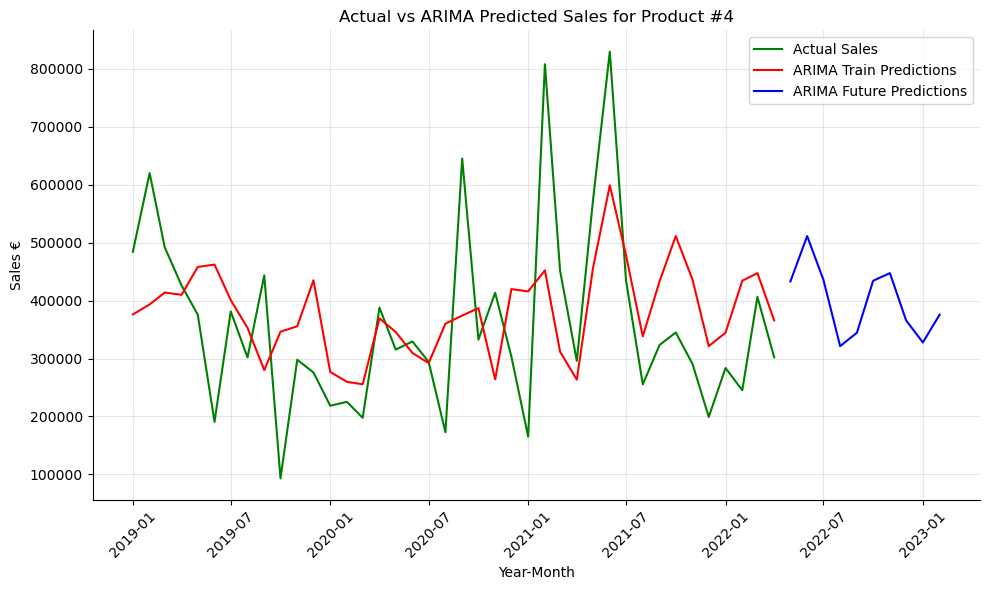

Train RMSE: 149449.26622404013
Validation RMSE: 122955.48343508014


In [74]:
# Fit ARIMA model
arima_model4 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model4.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #4')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [75]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   40
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 12)   Log Likelihood                -369.909
Date:                             Wed, 10 Apr 2024   AIC                            745.819
Time:                                     19:56:50   BIC                            749.706
Sample:                                          0   HQIC                           746.975
                                              - 40                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7742      0.264     -2.933      0.003      -1.292      -0.257
ar.S.L12

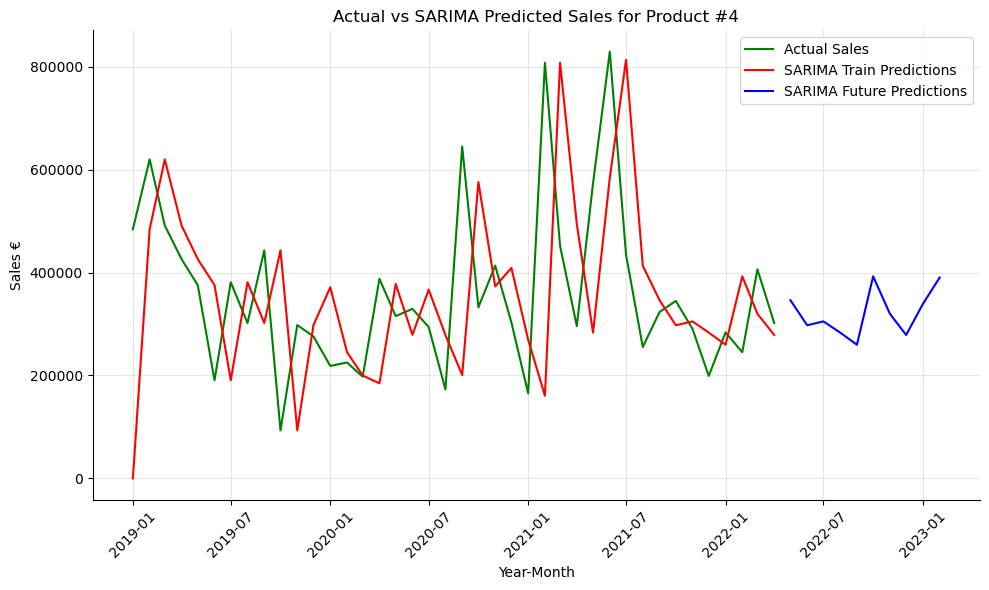

Train RMSE: 237421.16991548965
Validation RMSE: 71047.34462996424


In [76]:
# Fit SARIMA model
sarima_model4 = SARIMAX(df_train['y'], order=(0, 1, 0), seasonal_order=(2, 0, 1, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model4.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #4'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 177104.01 |  
| ARIMA    | 122955.48    | 
| SARIMA    | 71047.34   |

* Big difference between train and validation, so SARIMA is an unsafe choice


In [77]:
predicted_values_4 = arima_forecast.to_list()
predicted_table_4 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="2_4">
    
##    2.4 Product #5
    
</a>

In [78]:
p5 = pd.read_csv("sales_p5.csv")
p5.head()

,Full_Date,UK Production Index M&E LAG12,Europe Shipments Index M&E LAG12,Germany Production Index M&E LAG12,Global Production Index Electrical eq. LAG10,Japan Production Index Electrical eq. LAG12,Italy Production Index Electrical eq. LAG10,France Production Index M&E LAG12,Sales €,Europe Production Index M&E LAG12,France Production Index Electrical eq. LAG9,Price of Base Metals LAG11,Japan Production Index M&E LAG9,Sales € LAG6,Global Production Index Machinery eq. LAG12,Sales € LAG3,France Shipments Index M&E LAG12,Germany Shipments Index M&E LAG12
0,2019-04-01,119.94,132.20,125.94,119.00,141.50,89.80,111.94,5714462.5,124.06,95.10,96.06,126.94,2499061.25,137.2,8233205.0,121.70,141.80
1,2019-05-01,106.06,116.94,113.44,126.30,108.30,89.44,92.25,11389673.0,110.60,86.40,96.44,123.20,8993944.00,123.2,6879251.0,106.60,126.40
2,2019-06-01,107.20,122.10,112.10,121.94,107.06,90.80,88.50,13681879.0,114.30,64.30,96.80,115.20,6947507.50,124.4,11914314.0,102.25,126.25
3,2019-07-01,111.10,136.50,126.94,117.50,118.75,46.90,109.75,11145039.0,124.10,85.06,88.00,127.80,8233205.00,133.5,5714462.5,127.10,148.00
4,2019-08-01,106.06,120.44,116.75,126.40,116.50,85.20,100.80,7645745.5,114.06,97.90,85.56,125.20,6879251.00,124.8,11389673.0,104.75,129.90


In [79]:
X = p5.drop(columns=['Sales €', 'Full_Date'])
y = p5['Sales €']

# 'Full_Date' column to datetime
p5['Full_Date'] = pd.to_datetime(p5['Full_Date'])

**LINEAR REGRESSION**

In [80]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [2373478.43060075 2250029.45258256 2287133.53076665 1909913.97414185
 1147260.11748053]
Validation scores: [1880552.17517154 3186009.39943798 2270242.60021728 4463774.03033304
 5139837.73073431]

Average Train RMSE: 1993563.1
Average Validation RMSE: 3388083.19


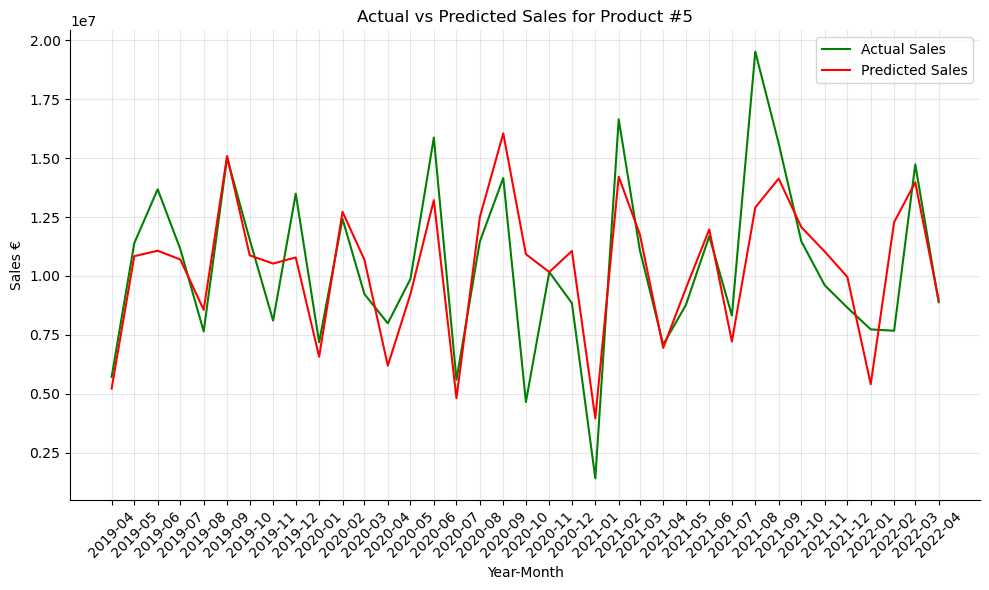

In [81]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p5['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p5['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p5['Full_Date'], p5['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [82]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.

In [83]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1942422.46875949 1944948.66036852 1718977.12033685 1968661.14765415
 1612488.43452578]
Validation scores: [3302605.05977432 2026753.31564543 4229622.18622957 3232277.70061984
 4810632.48995687]

Average Train RMSE: 1837499.57
Average Validation RMSE: 3520378.15


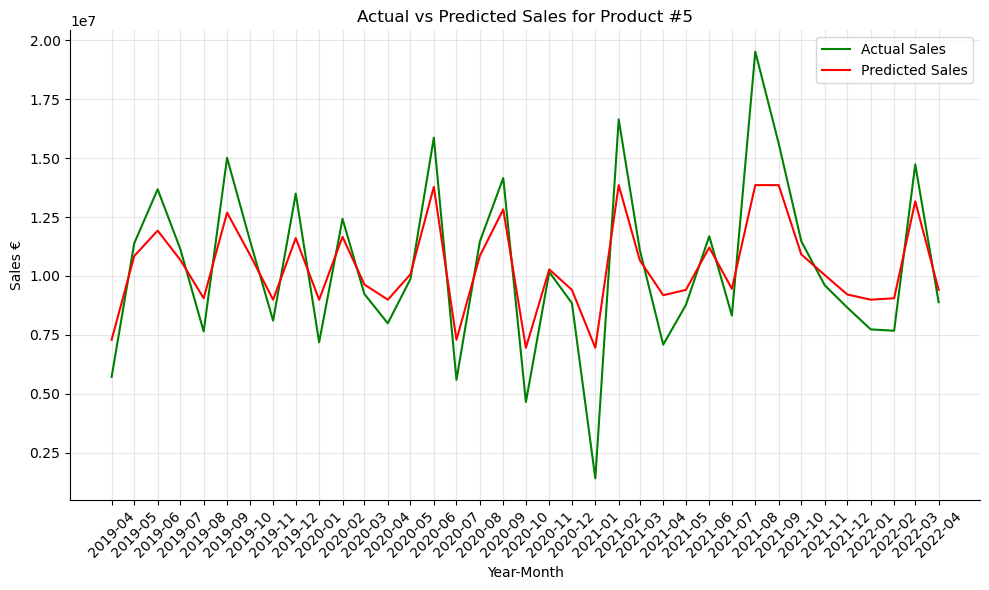

In [84]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p5['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p5['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p5['Full_Date'], p5['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [85]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}


In [86]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [2532885.38584455 2505173.01509025 2279636.53447561 2139157.30218759
 2025227.67839551]
Validation scores: [2220543.62495025 2635227.90212005 3888027.29222031 3246166.70478697
 4812487.62353672]

Average Train RMSE: 2296415.98
Average Validation RMSE: 3360490.63


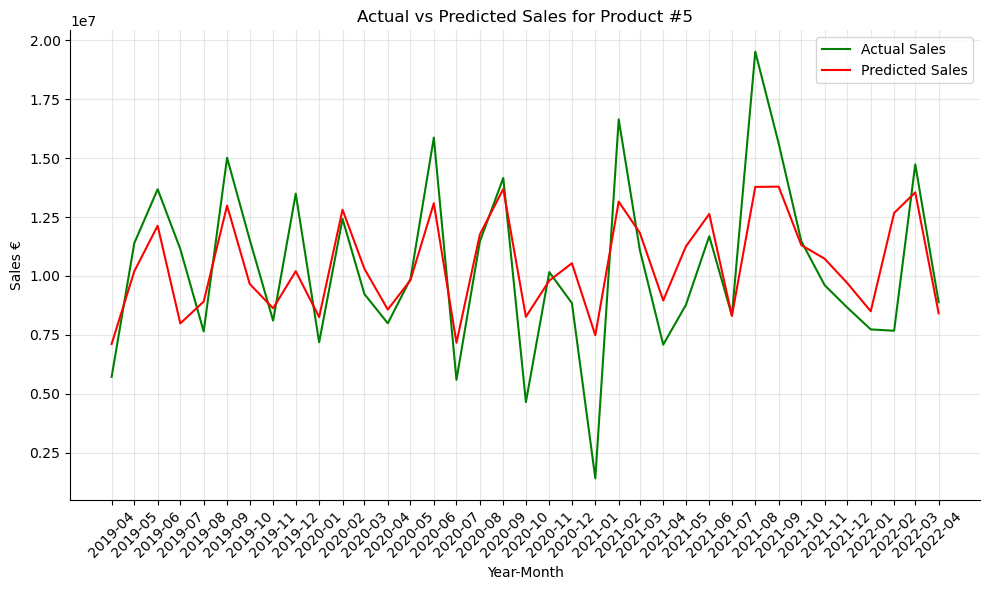

In [87]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p5['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p5['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p5['Full_Date'], p5['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [88]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s

In [89]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1924969.69379824 2028576.90391347 1834971.1086132  2171393.16690329
 1987793.38682177]
Validation scores: [3255826.02377944 2324690.60610807 4256245.03531043 3830972.24315787
 4423205.02417604]

Average Train RMSE: 1989540.85
Average Validation RMSE: 3618187.79


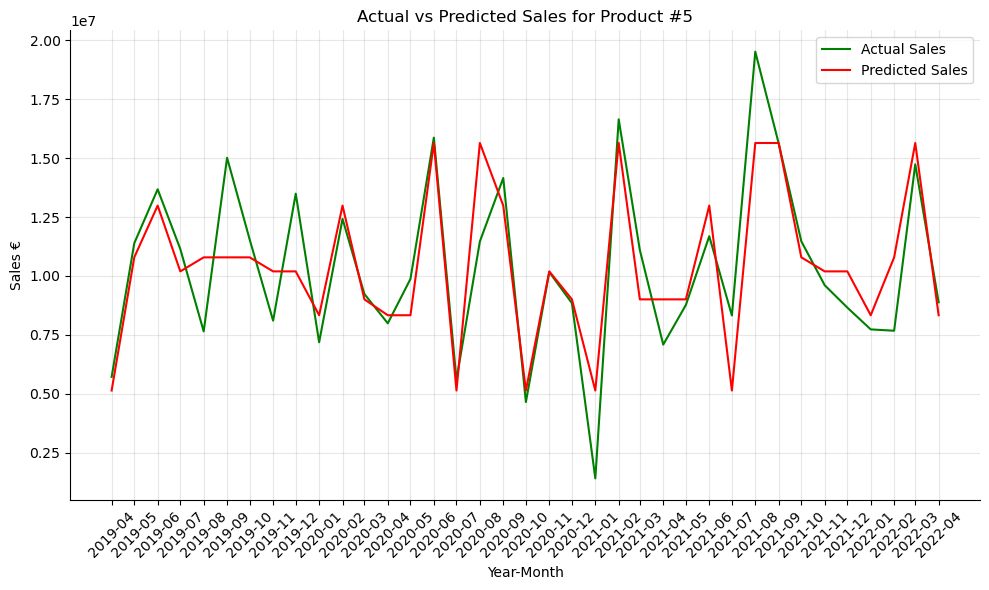

In [90]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p5['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p5['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p5['Full_Date'], p5['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [91]:
df = pd.DataFrame({
    'ds': p5['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph5 = NeuralProphet()
model_ph5.set_plotting_backend("plotly-static")

In [92]:
df_train, df_val = model_ph5.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 37
Train dataset size: 30
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/202 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,3854037.25,4381935.00,0.133854,0.0,0,9414200.000,1.067276e+07,0.344707,0.0
1,3664167.50,4224055.50,0.126999,0.0,1,9266357.000,1.045058e+07,0.336373,0.0
2,3589830.25,4109280.75,0.122379,0.0,2,8954061.000,1.018742e+07,0.319017,0.0
3,3545361.75,4050592.00,0.120156,0.0,3,8693488.000,1.005035e+07,0.306552,0.0
4,3495052.00,4014582.50,0.118588,0.0,4,8578342.000,9.944666e+06,0.301417,0.0
...,...,...,...,...,...,...,...,...,...
405,4441863.00,5952235.50,0.182958,0.0,405,1681794.000,1.939913e+06,0.021646,0.0
406,4443167.00,5952796.50,0.183008,0.0,406,1714990.250,2.055000e+06,0.022482,0.0
407,4443316.50,5953002.00,0.183014,0.0,407,1681300.500,1.995156e+06,0.021643,0.0
408,4443662.00,5952815.00,0.183008,0.0,408,1672510.375,1.996327e+06,0.021588,0.0


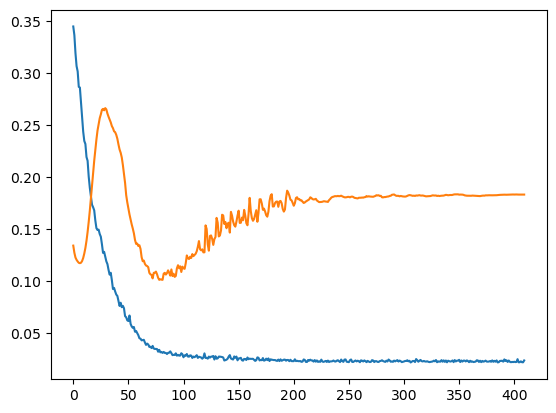

In [93]:
nprof_metrics = model_ph5.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

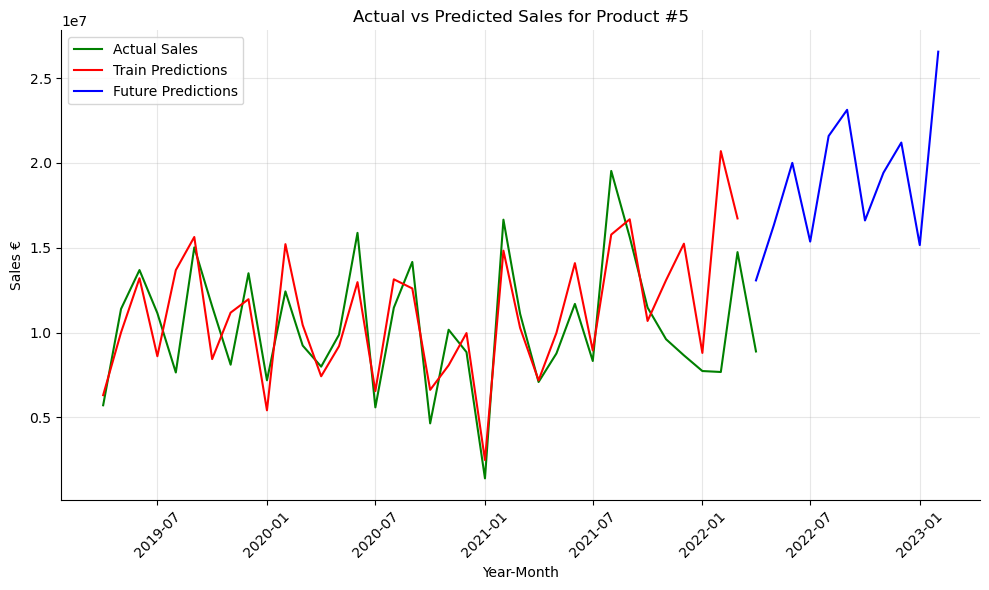

In [94]:
future = model_ph5.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph5.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [95]:
# Compute RMSE
forecast = model_ph5.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 3206408.8


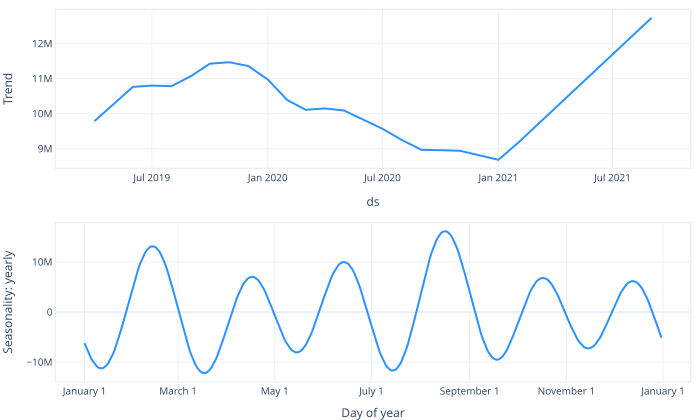

In [96]:
model_ph5.plot_parameters(components=["trend", "seasonality"])

In [97]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-04-01,5.714462e+06,6309721.5,9788444.0,-3.478723e+06
1,2019-05-01,1.138967e+07,10004117.0,10269544.0,-2.654270e+05
2,2019-06-01,1.368188e+07,13200362.0,10766681.0,2.433681e+06
3,2019-07-01,1.114504e+07,8603548.0,10803899.0,-2.200352e+06
4,2019-08-01,7.645746e+06,13680189.0,10785845.0,2.894344e+06
5,2019-09-01,1.501860e+07,15630184.0,11071963.0,4.558221e+06
6,2019-10-01,1.154265e+07,8434594.0,11428196.0,-2.993602e+06
7,2019-11-01,8.104242e+06,11173620.0,11469710.0,-2.960901e+05
8,2019-12-01,1.349469e+07,11963719.0,11362191.0,6.015278e+05
9,2020-01-01,7.184360e+06,5416955.5,10976829.0,-5.559874e+06


**ARIMA**

In [98]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   37
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -605.126
Date:                Wed, 10 Apr 2024   AIC                           1230.252
Time:                        20:02:27   BIC                           1246.361
Sample:                             0   HQIC                          1235.931
                                 - 37                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.038e+07   2.43e+05     42.638      0.000     9.9e+06    1.09e+07
ar.L1          0.2186      2.014      0.109      0.914      -3.729       4.166
ar.L2         -0.1440      0.648  

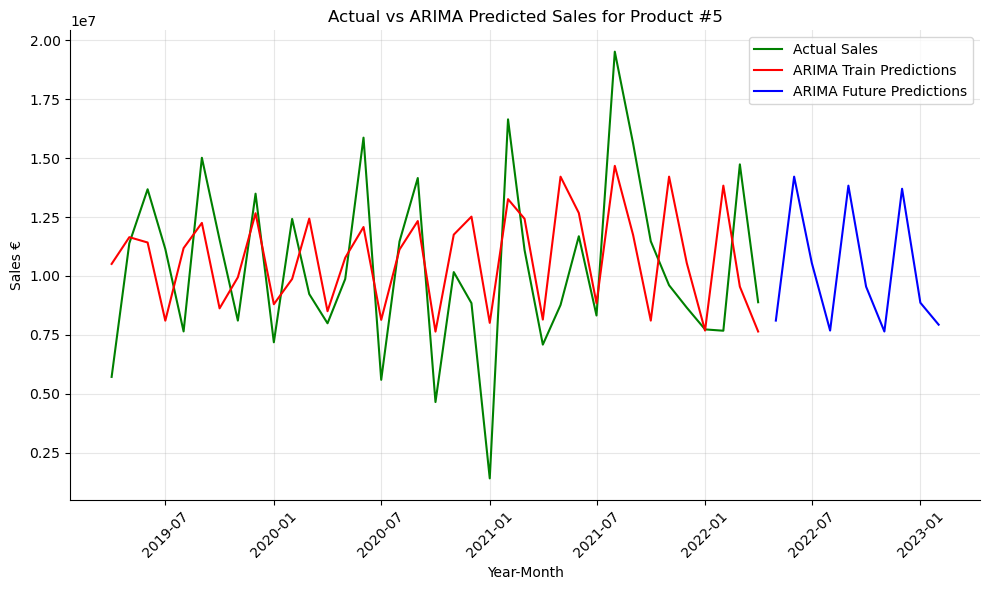

Train RMSE: 2986002.7058883617
Validation RMSE: 3828981.418523985


In [99]:
# Fit ARIMA model
arima_model5 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model5.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #5')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [100]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   37
Model:             SARIMAX(2, 1, 0)x(2, 1, 0, 12)   Log Likelihood                -401.527
Date:                            Wed, 10 Apr 2024   AIC                            813.055
Time:                                    20:04:24   BIC                            818.945
Sample:                                         0   HQIC                           814.617
                                             - 37                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7234      0.294     -2.463      0.014      -1.299      -0.148
ar.L2         -0

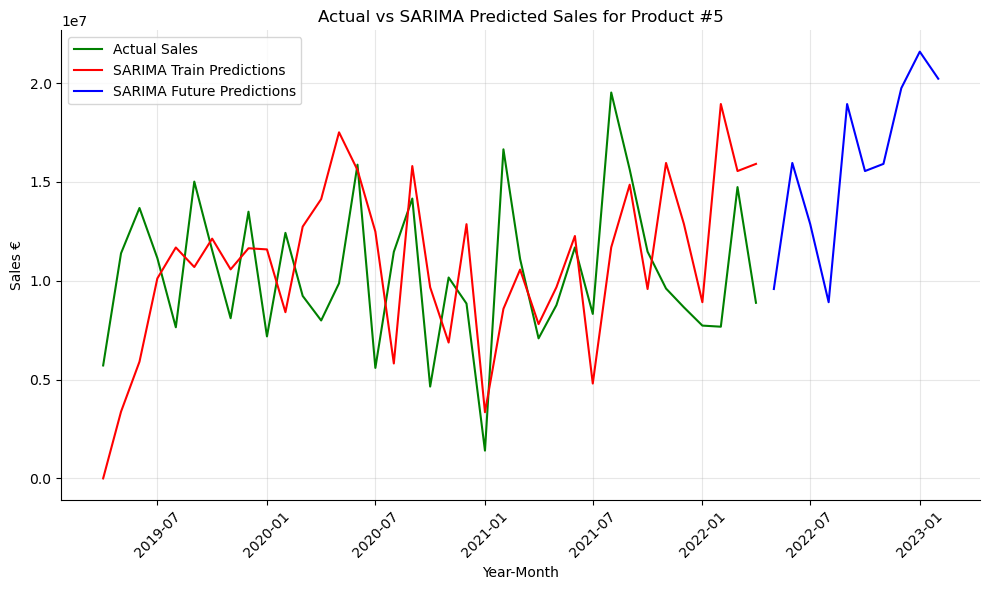

Train RMSE: 4570891.279929913
Validation RMSE: 5857467.8023275165


In [101]:
# Fit SARIMA model
sarima_model5 = SARIMAX(df_train['y'], order=(2, 1, 0), seasonal_order=(2, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model5.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01']) 

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #5'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 3206408.8 |  
| ARIMA    | 3828981.42    | 
| SARIMA    | 5857467.8   |

In [102]:
predicted_values_5 = forecast['yhat1'].values[-10:]  
predicted_table_5 = forecast[-10:] 

In [103]:
predicted_table_5

,ds,y,yhat1,trend,season_yearly
37,2022-05-01,NaN,16332109.0,16807540.0,-4.754298e+05
38,2022-06-01,NaN,19998196.0,17329200.0,2.668996e+06
39,2022-07-01,NaN,15359572.0,17834030.0,-2.474457e+06
40,2022-08-01,NaN,21582906.0,18355690.0,3.227216e+06
41,2022-09-01,NaN,23125414.0,18877350.0,4.248064e+06
42,2022-10-01,NaN,16605275.0,19382182.0,-2.776907e+06
43,2022-11-01,NaN,19417398.0,19903844.0,-4.864463e+05
44,2022-12-01,NaN,21194924.0,20408676.0,7.862486e+05
45,2023-01-01,NaN,15154448.0,20930336.0,-5.775887e+06
46,2023-02-01,NaN,26551798.0,21451996.0,5.099800e+06


<hr>

<a class="anchor" id="2_5">
    
##    2.5 Product #6
    
</a>

In [104]:
p6 = pd.read_csv("sales_p6.csv")
p6.head()

,Full_Date,France Production Index M&E LAG3,Global Production Index Machinery eq. LAG6,Price of Natural gas index LAG9,Price of Base Metals LAG1,Sales € LAG4,Japan Production Index M&E LAG4,United States: EUR in LCU LAG12,China Producer Prices Electrical eq. LAG3,Sales €,France Production Index Electrical eq. LAG3,Japan Production Index Electrical eq. LAG4
0,2019-02-01,108.25,124.8,73.5,82.75,369231.59375,127.8,1.220,96.30,542037.50000,97.90,114.50
1,2019-03-01,99.60,118.9,76.5,81.25,473046.96875,125.2,1.234,95.40,735604.25000,91.10,112.40
2,2019-04-01,94.70,128.5,78.3,84.70,999472.68750,122.6,1.233,95.00,277575.12500,78.06,111.94
3,2019-05-01,90.10,131.4,77.5,86.20,598874.12500,123.0,1.228,94.94,315978.78125,81.94,112.50
4,2019-06-01,92.56,130.0,81.7,85.60,542037.50000,105.5,1.182,94.70,282963.18750,80.30,95.94


In [105]:
X = p6.drop(columns=['Sales €', 'Full_Date'])
y = p6['Sales €']

# 'Full_Date' column to datetime
p6['Full_Date'] = pd.to_datetime(p6['Full_Date'])

**LINEAR REGRESSION**

In [106]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [181165.18621184 197281.19579197 173110.63878116 154169.90562117
 197732.52520521]
Validation scores: [316160.5842147  230324.58132701 297186.29680444 349248.32982518
 194530.25385826]

Average Train RMSE: 180691.89
Average Validation RMSE: 277490.01


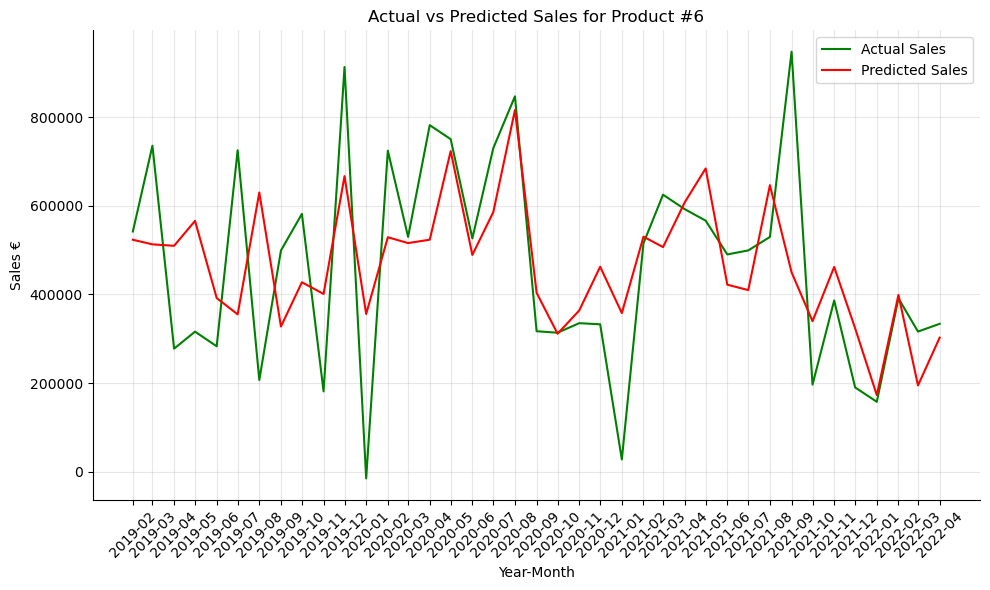

In [107]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p6['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p6['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p6['Full_Date'], p6['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [108]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [109]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [76136.08109402 76498.55852067 74523.41278308 68096.57004791
 85093.74218987]
Validation scores: [211625.03634599 216356.79543051 228534.20257288 282792.22837136
 135034.76157673]

Average Train RMSE: 76069.67
Average Validation RMSE: 214868.6


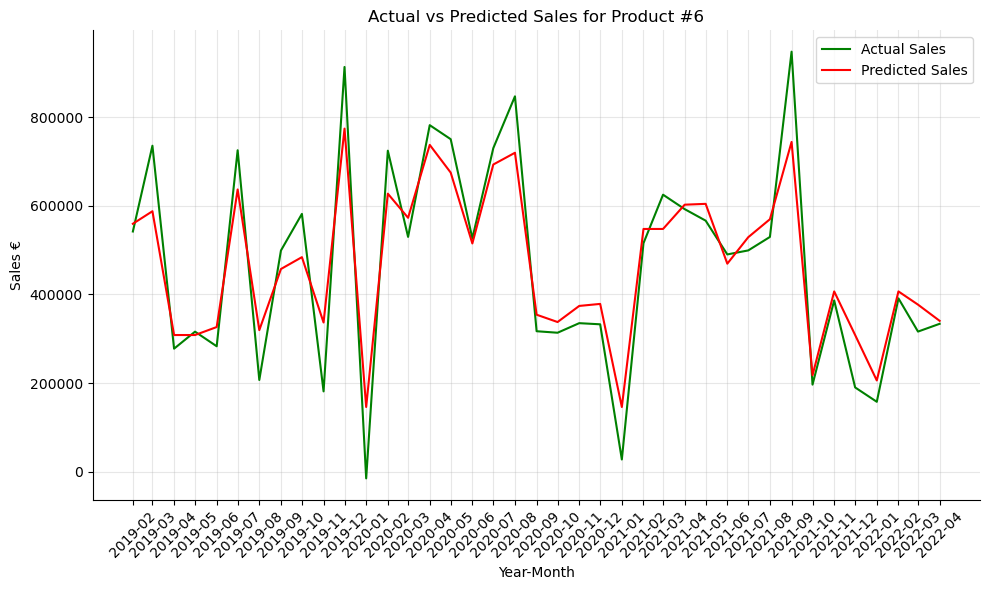

In [110]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p6['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p6['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p6['Full_Date'], p6['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [111]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}


In [112]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [101087.49985267 103727.95559008  97677.98800436  86844.07297801
 108271.05365288]
Validation scores: [165882.4413414  191787.83667218 261737.79983934 294002.14375537
 136870.01977202]

Average Train RMSE: 99521.71
Average Validation RMSE: 210056.05


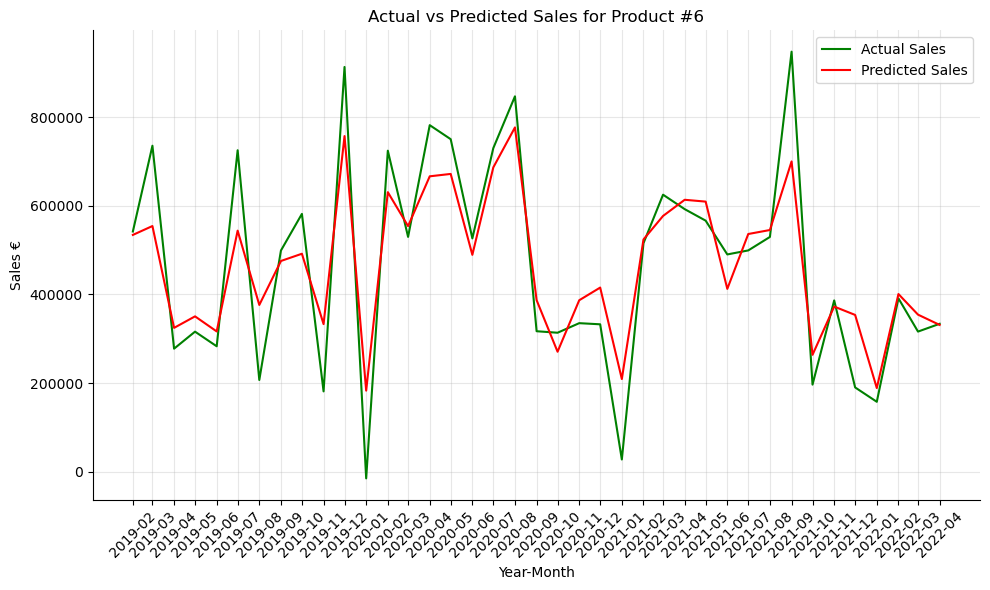

In [113]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p6['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p6['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p6['Full_Date'], p6['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [114]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s

In [115]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [ 91731.24184105  97604.86077048 119231.33277827  87028.45032907
 111999.34767654]
Validation scores: [187945.20069983 231335.58357864 272682.02020165 401562.38060098
 176786.54062551]

Average Train RMSE: 101519.05
Average Validation RMSE: 254062.35


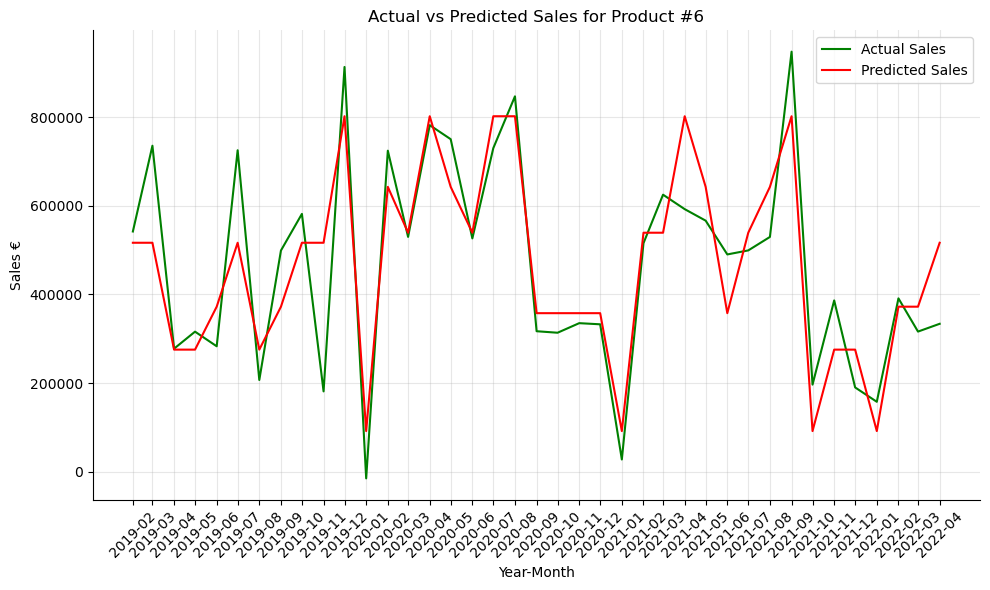

In [116]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p6['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p6['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p6['Full_Date'], p6['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [117]:
df = pd.DataFrame({
    'ds': p6['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph6 = NeuralProphet()
model_ph6.set_plotting_backend("plotly-static")

In [118]:
df_train, df_val = model_ph6.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 39
Train dataset size: 32
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,239867.234375,280081.37500,0.148865,0.0,0,538544.500000,623655.750000,0.322497,0.0
1,243057.250000,288916.78125,0.153737,0.0,1,524972.875000,597214.875000,0.312089,0.0
2,245974.453125,298173.59375,0.159262,0.0,2,510881.156250,598588.250000,0.301089,0.0
3,248906.203125,308521.37500,0.165724,0.0,3,497963.000000,577549.312500,0.291691,0.0
4,251534.421875,319610.21875,0.172842,0.0,4,484092.656250,548457.625000,0.280674,0.0
...,...,...,...,...,...,...,...,...,...
395,497221.843750,541742.06250,0.411795,0.0,395,119462.218750,141803.500000,0.031875,0.0
396,497308.656250,541832.31250,0.411887,0.0,396,119469.937500,146309.953125,0.031876,0.0
397,497310.656250,541835.75000,0.411891,0.0,397,119471.062500,146058.000000,0.031875,0.0
398,497313.437500,541841.43750,0.411894,0.0,398,119469.156250,146065.406250,0.031873,0.0


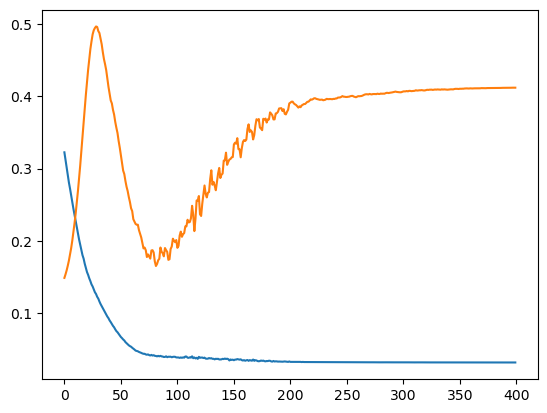

In [119]:
nprof_metrics = model_ph6.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

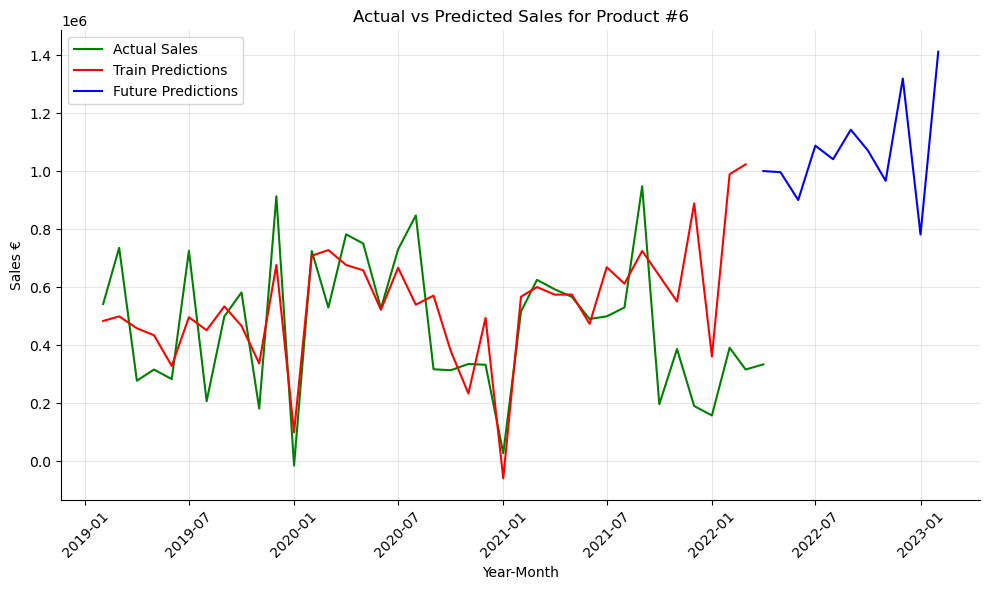

In [120]:
future = model_ph6.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph6.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [121]:
# Compute RMSE
forecast = model_ph6.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 265215.17


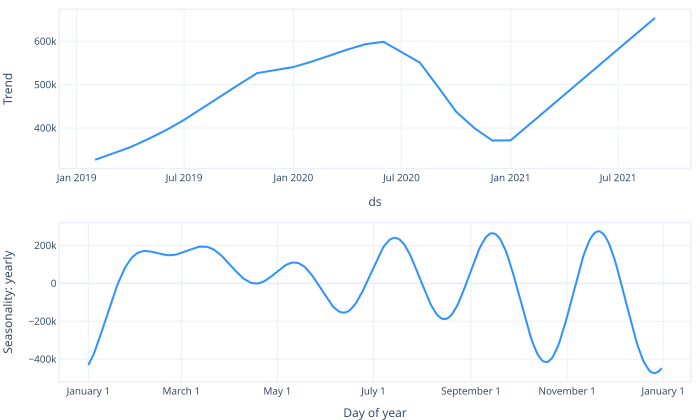

In [122]:
model_ph6.plot_parameters(components=["trend", "seasonality"])

In [123]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-02-01,542037.500000,4.834571e+05,3.268780e+05,156579.093750
1,2019-03-01,735604.250000,4.992088e+05,3.405626e+05,158646.125000
2,2019-04-01,277575.125000,4.581713e+05,3.557134e+05,102457.945312
3,2019-05-01,315978.781250,4.341750e+05,3.743795e+05,59795.441406
4,2019-06-01,282963.187500,3.283372e+05,3.956096e+05,-67272.335938
5,2019-07-01,725412.000000,4.963818e+05,4.189162e+05,77465.671875
6,2019-08-01,206931.171875,4.514958e+05,4.468150e+05,4680.745117
7,2019-09-01,499147.718750,5.337143e+05,4.744407e+05,59273.589844
8,2019-10-01,581767.875000,4.664801e+05,5.001293e+05,-33649.214844
9,2019-11-01,181159.203125,3.370619e+05,5.266742e+05,-189612.234375


**ARIMA**

In [124]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   39
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -532.725
Date:                Wed, 10 Apr 2024   AIC                           1085.450
Time:                        20:09:16   BIC                           1102.085
Sample:                             0   HQIC                          1091.418
                                 - 39                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.667e+05   2.62e+04     17.805      0.000    4.15e+05    5.18e+05
ar.L1          0.2275      0.444      0.512      0.609      -0.644       1.098
ar.L2          1.2457      0.358  

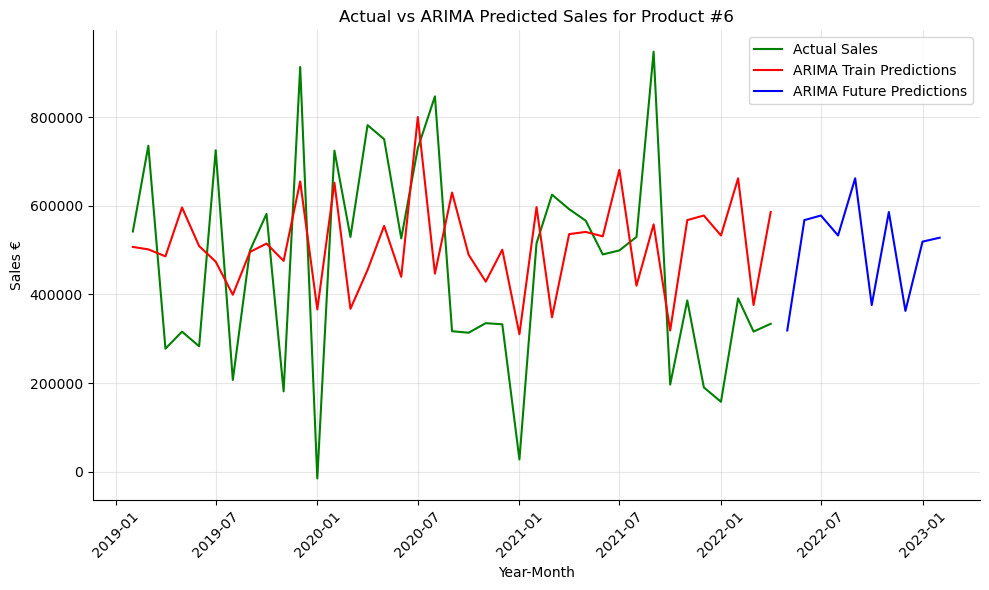

Train RMSE: 217509.18100323455
Validation RMSE: 261838.50507463035


In [125]:
# Fit ARIMA model
arima_model6 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model6.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #6')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [126]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                   39
Model:             SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -359.919
Date:                              Wed, 10 Apr 2024   AIC                            727.837
Time:                                      20:10:52   BIC                            732.870
Sample:                                           0   HQIC                           729.286
                                               - 39                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7783      0.259     -3.007      0.003      -1.286      -0.271


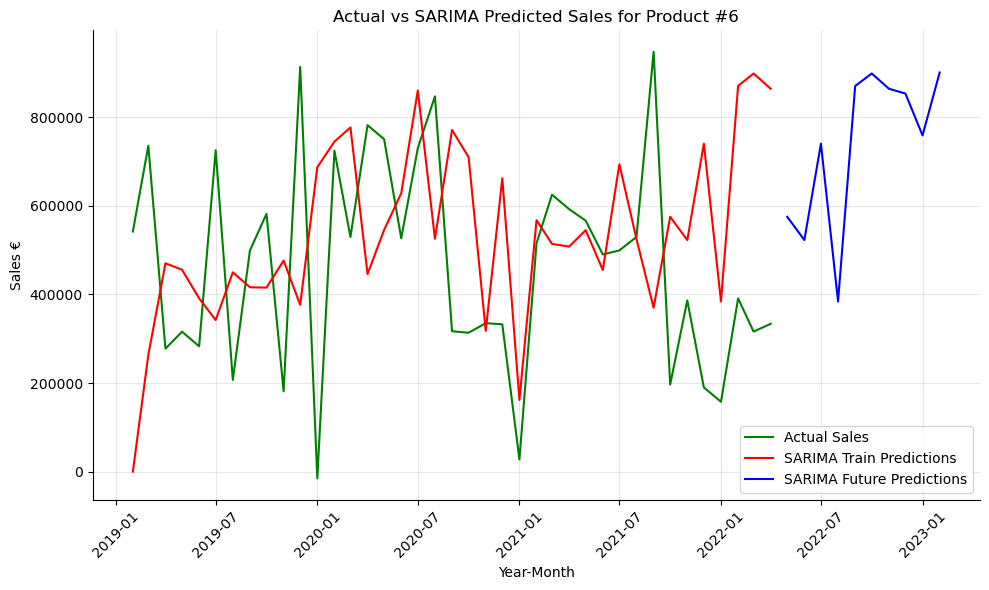

Train RMSE: 302443.13382542925
Validation RMSE: 441854.0923269022


In [127]:
# Fit SARIMA model
sarima_model6 = SARIMAX(df_train['y'], order=(0, 1, 2), seasonal_order=(0, 1, 1, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model6.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #6'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 265215.17 |  
| ARIMA    | 261838.5    | 
| SARIMA    | 441854.09   |

* Althouh the Neural Prophet and ARIMA produce similiar scores, the ARIMA aligns more with our idea of possible results

In [128]:
predicted_values_6 = arima_forecast.to_list()
predicted_table_6 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="2_6">
    
##    2.6 Product #8
    
</a>

In [129]:
p8 = pd.read_csv("sales_p8.csv")
p8.head()

,Full_Date,Switzerland Production Index Machinery eq. LAG12,Europe Shipments Index M&E LAG12,Germany Production Index Electrical eq. LAG10,Italy Shipments Index M&E LAG8,Switzerland Production Index M&E LAG12,China Production Index M&E LAG8,Price of Energy LAG12,Price of Base Metals LAG1,Japan Production Index M&E LAG12,...,France Production Index Electrical eq. LAG12,Japan Production Index Electrical eq. LAG12,Sales € LAG5,China Producer Prices Electrical eq. LAG12,UK Production Index M&E LAG6,Italy Production Index M&E LAG12,Sales €,Sales € LAG3,US Producer Prices Electrical eq. LAG3,Sales € LAG2
0,2019-03-01,101.44,112.75,108.70,127.00,103.30,244.1,82.1,81.25,119.80,...,82.25,111.80,586052.75000,96.60,103.70,103.25,591288.37500,271490.71875,111.00,381400.15625
1,2019-04-01,97.50,132.20,106.75,121.40,98.80,207.9,82.8,84.70,153.90,...,94.70,141.50,526292.75000,96.20,108.30,116.10,418899.90625,381400.15625,111.20,368475.56250
2,2019-05-01,98.60,116.94,116.75,74.44,98.44,197.5,88.4,86.20,115.56,...,83.94,108.30,271490.71875,95.56,113.70,101.25,298806.84375,368475.56250,111.40,591288.37500
3,2019-06-01,99.80,122.10,111.20,115.30,98.06,199.4,94.6,85.60,115.40,...,81.80,107.06,381400.15625,96.60,115.06,118.25,420707.71875,591288.37500,111.56,418899.90625
4,2019-07-01,100.94,136.50,111.30,122.44,97.70,212.0,93.7,81.00,126.94,...,95.10,118.75,368475.56250,97.00,101.56,115.25,366980.25000,418899.90625,111.94,298806.84375


In [130]:
X = p8.drop(columns=['Sales €', 'Full_Date'])
y = p8['Sales €']

# 'Full_Date' column to datetime
p8['Full_Date'] = pd.to_datetime(p8['Full_Date'])

**LINEAR REGRESSION**

In [131]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [124896.37040329 134836.86413979 136147.68248033 118886.61201405
 176048.50903031]
Validation scores: [1102650.80148375  646231.60987802 1208154.53540727  764125.25840267
  735683.4317868 ]

Average Train RMSE: 138163.21
Average Validation RMSE: 891369.13


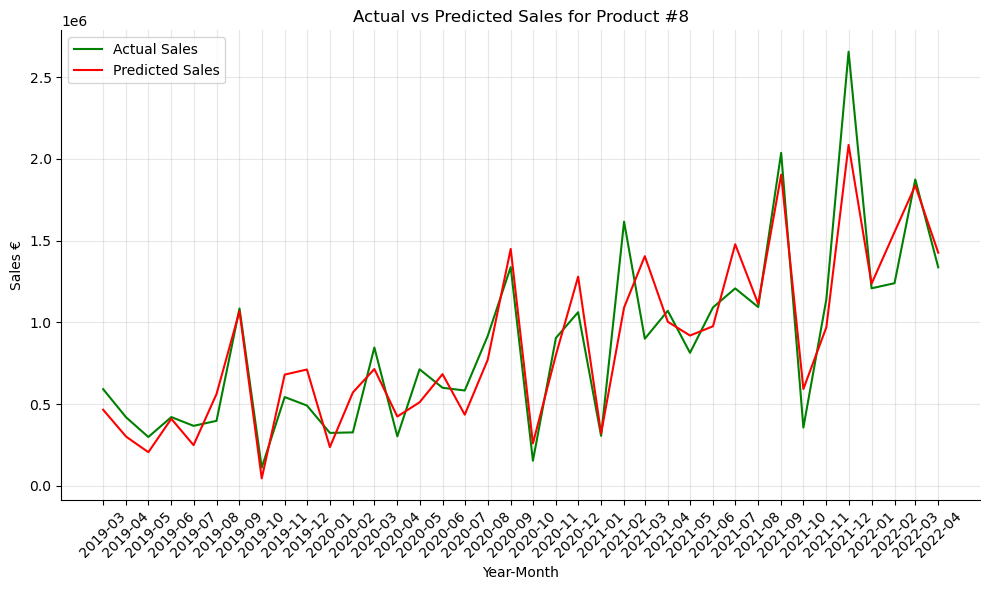

In [132]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p8['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p8['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p8['Full_Date'], p8['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [133]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [134]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [12.79751188 19.25070097 20.21359479 30.17565321 19.49892749]
Validation scores: [686736.93559176 426128.75751149 242999.66443139 384675.52467005
 407958.78881877]

Average Train RMSE: 20.39
Average Validation RMSE: 429699.93


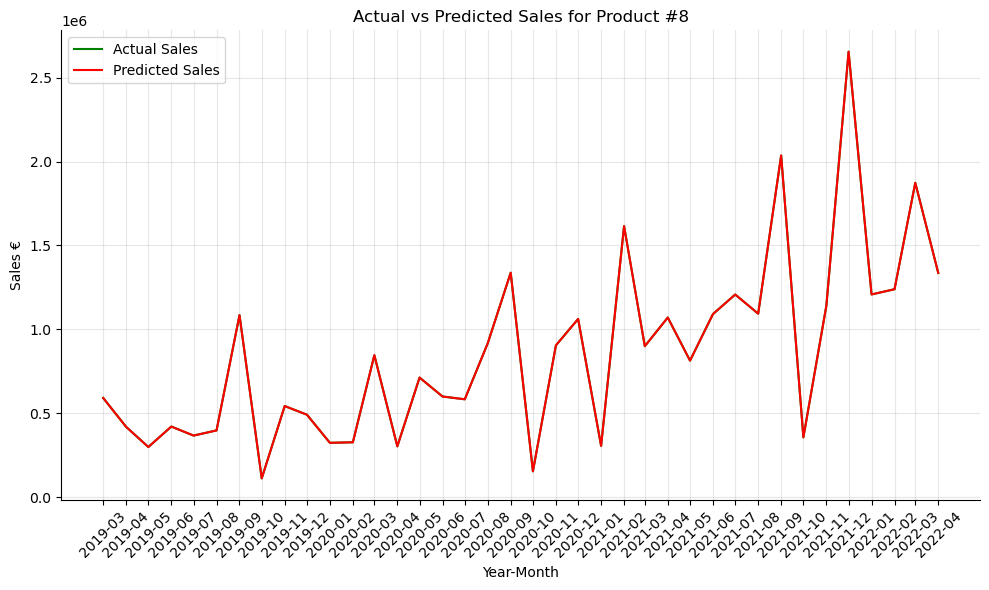

In [135]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p8['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p8['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p8['Full_Date'], p8['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [136]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.9s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [137]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [130323.33897147 167844.71423491 183658.69814043 156975.62748373
 167377.31258642]
Validation scores: [697122.1444117  277159.75693612 229567.00099193 374340.29052196
 337777.29712959]

Average Train RMSE: 161235.94
Average Validation RMSE: 383193.3


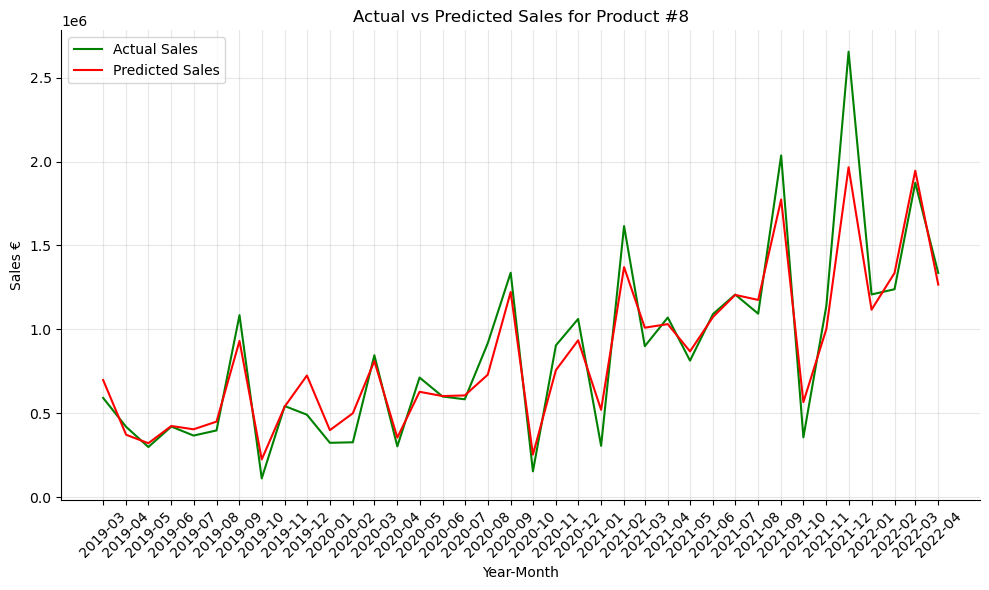

In [138]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p8['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p8['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p8['Full_Date'], p8['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [139]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s

In [140]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [30755.90668208 26727.5758652  58780.56717183 40353.41945914
 52072.75424784]
Validation scores: [728576.26691706 472734.75719572 322081.85905776 363710.97405766
 395585.94476518]

Average Train RMSE: 41738.04
Average Validation RMSE: 456537.96


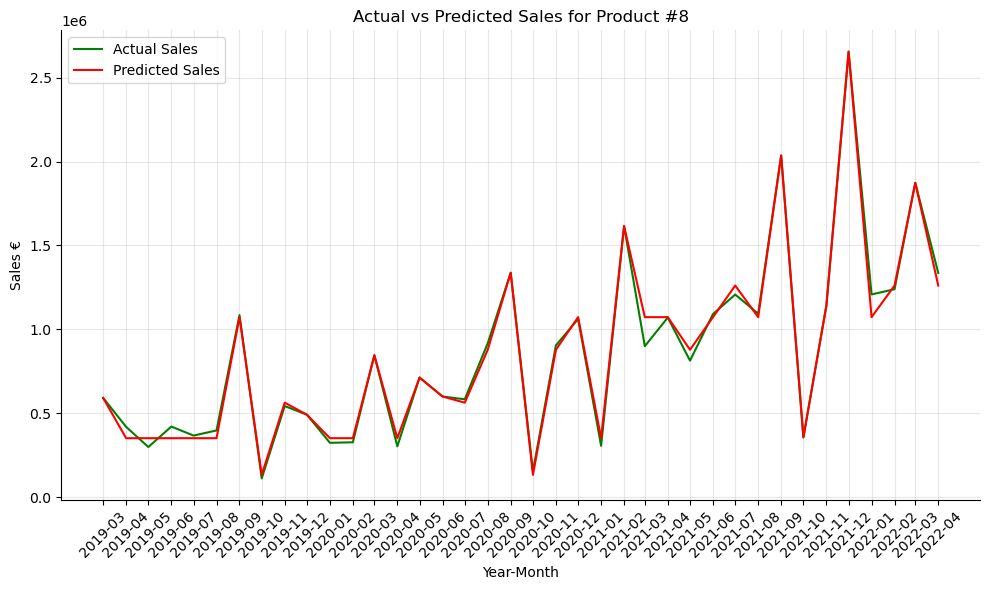

In [141]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p8['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p8['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p8['Full_Date'], p8['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [142]:
df = pd.DataFrame({
    'ds': p8['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph8 = NeuralProphet()
model_ph8.set_plotting_backend("plotly-static")

In [143]:
df_train, df_val = model_ph8.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 38
Train dataset size: 31
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/202 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,717749.00000,869564.7500,0.396858,0.0,0,661678.250000,766377.62500,0.259301,0.0
1,696171.62500,846867.8125,0.380833,0.0,1,640210.687500,723236.75000,0.248169,0.0
2,676189.31250,826299.5000,0.366148,0.0,2,619212.750000,713552.68750,0.238305,0.0
3,655792.68750,805486.8750,0.351450,0.0,3,604148.187500,707134.25000,0.229535,0.0
4,635954.31250,785312.2500,0.337375,0.0,4,589498.687500,698931.68750,0.222576,0.0
...,...,...,...,...,...,...,...,...,...
395,428222.53125,535720.8125,0.187166,0.0,395,125757.562500,153626.62500,0.016713,0.0
396,428210.25000,535685.5625,0.187147,0.0,396,126555.906250,155972.28125,0.016853,0.0
397,428191.65625,535675.1250,0.187151,0.0,397,125532.648438,152510.78125,0.016502,0.0
398,428199.71875,535668.4375,0.187148,0.0,398,126315.531250,152403.18750,0.016703,0.0


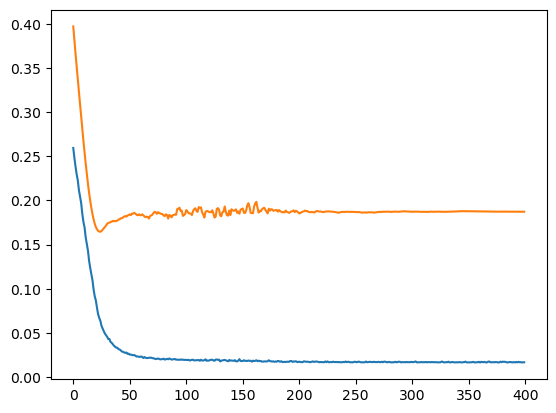

In [144]:
nprof_metrics = model_ph8.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

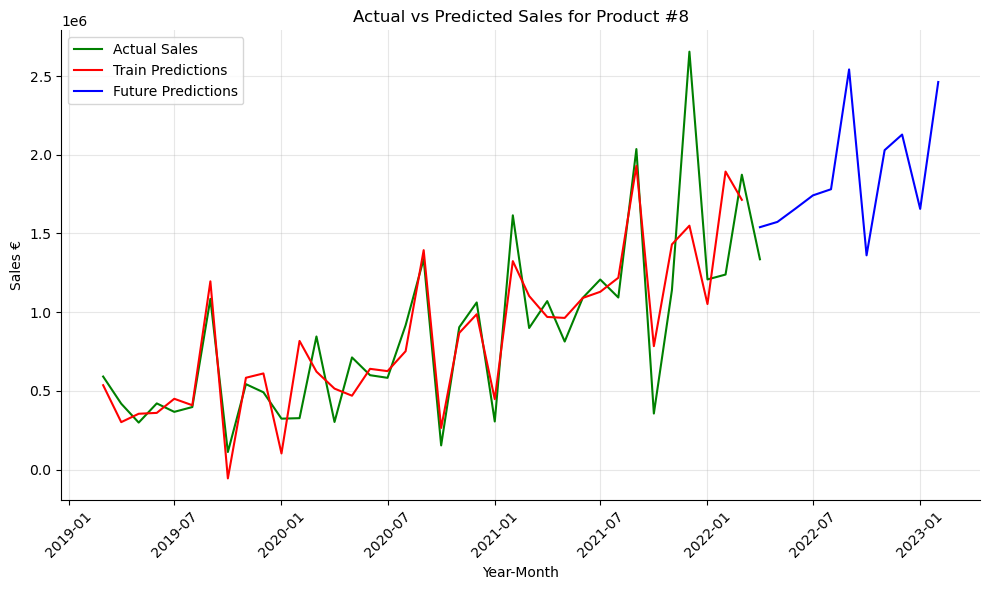

In [145]:
future = model_ph8.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph8.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [146]:
# Compute RMSE
forecast = model_ph8.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 271645.88


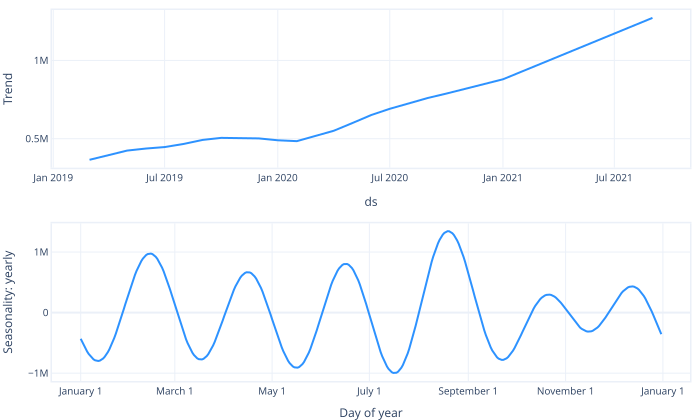

In [147]:
model_ph8.plot_parameters(components=["trend", "seasonality"])

In [148]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-03-01,5.912884e+05,5.362948e+05,3.651713e+05,171123.359375
1,2019-04-01,4.188999e+05,3.016090e+05,3.950467e+05,-93437.648438
2,2019-05-01,2.988068e+05,3.549128e+05,4.239583e+05,-69045.460938
3,2019-06-01,4.207077e+05,3.603904e+05,4.371904e+05,-76799.984375
4,2019-07-01,3.669802e+05,4.500075e+05,4.464869e+05,3520.645508
5,2019-08-01,3.975372e+05,4.090606e+05,4.664887e+05,-57428.121094
6,2019-09-01,1.084686e+06,1.196087e+06,4.922817e+05,703805.312500
7,2019-10-01,1.117913e+05,-5.565197e+04,5.052950e+05,-560947.000000
8,2019-11-01,5.429234e+05,5.835789e+05,5.053025e+05,78276.414062
9,2019-12-01,4.913327e+05,6.110366e+05,5.018942e+05,109142.429688


**ARIMA**

In [149]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   38
Model:                 ARIMA(4, 1, 3)   Log Likelihood                -526.195
Date:                Wed, 10 Apr 2024   AIC                           1068.390
Time:                        20:16:28   BIC                           1081.277
Sample:                             0   HQIC                          1072.933
                                 - 38                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1032      1.609     -0.064      0.949      -3.257       3.051
ar.L2          0.3373      0.740      0.456      0.649      -1.113       1.788
ar.L3          0.5395      0.300  

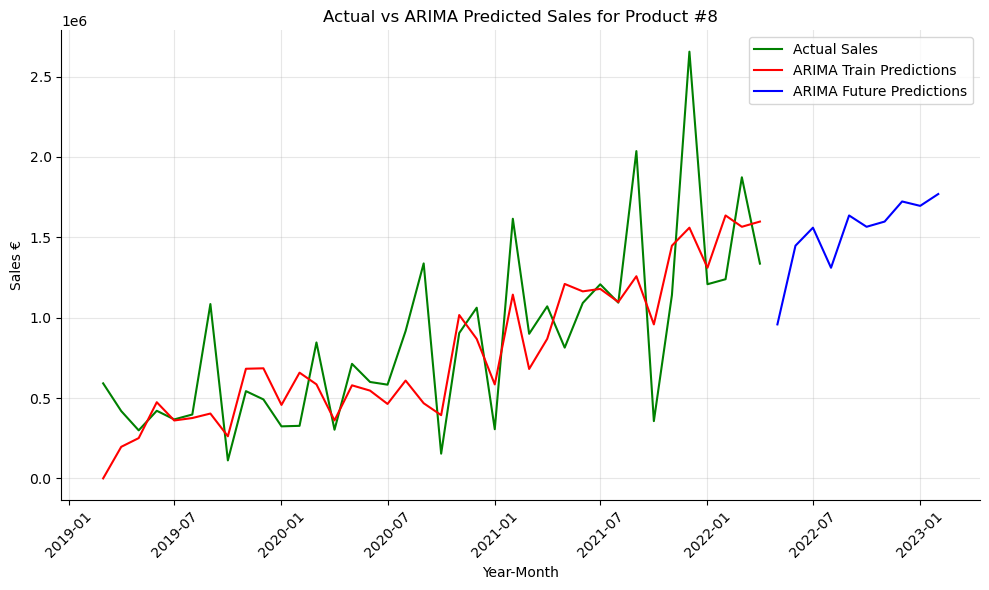

Train RMSE: 326288.72922972165
Validation RMSE: 532825.8438000235


In [150]:
# Fit ARIMA model
arima_model8 = ARIMA(df_train['y'], order=(4,1,3))
arima_fit = arima_model8.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #8')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [151]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   38
Model:             SARIMAX(1, 0, 2)x(0, 1, [], 12)   Log Likelihood                   0.000
Date:                             Wed, 10 Apr 2024   AIC                              8.000
Time:                                     20:18:02   BIC                             13.032
Sample:                                          0   HQIC                             9.449
                                              - 38                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000      0.059     17.052      0.000       0.885       1.115
ma.L1   

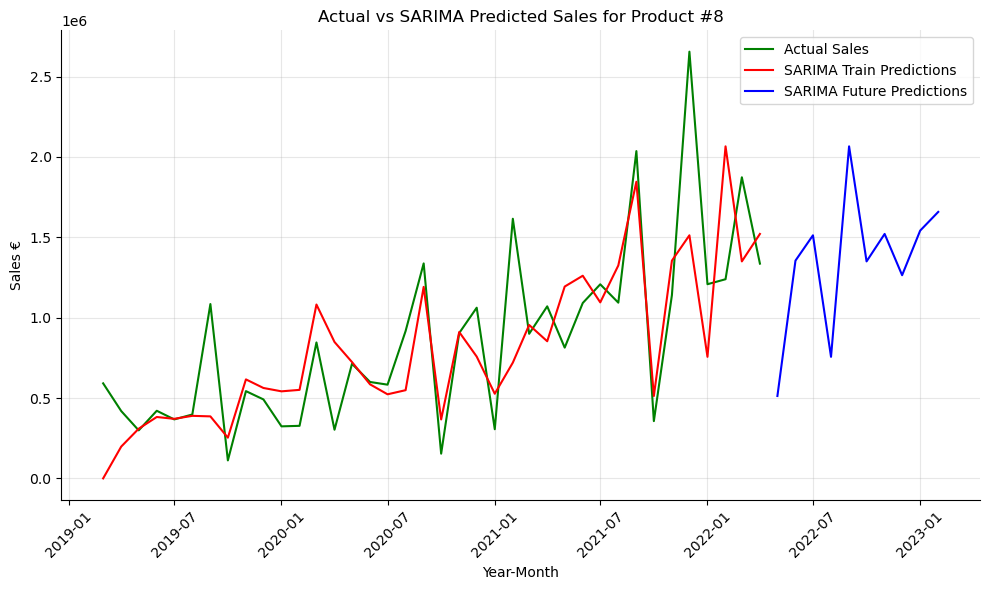

Train RMSE: 302934.78498955996
Validation RMSE: 606109.1093114185


In [152]:
# Fit SARIMA model
sarima_model8 = SARIMAX(df_train['y'], order=(0, 1, 2), seasonal_order=(0, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model8.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #8'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 271645.88 |  
| ARIMA    | 532825.84    | 
| SARIMA    | 606109.11   |

In [153]:
predicted_values_8 = forecast['yhat1'].values[-10:]  
predicted_table_8 = forecast[-10:] 

<hr>

<a class="anchor" id="2_7">
    
##    2.7 Product #9
    
</a>

In [154]:
p9 = pd.read_csv("sales_p9.csv")
p9.head()

,Full_Date,Global Production Index Electrical eq. LAG5,China Producer Prices Electrical eq. LAG11,UK Production Index M&E LAG10,Sales € LAG1,France Production Index M&E LAG6,Price of Base Metals LAG11,Sales €,Japan Production Index M&E LAG9,US Shipments Index M&E LAG9,Germany Production Index M&E LAG6,Price of Energy LAG10,UK Production Index Electrical eq. LAG10
0,2018-11-01,119.00,96.60,102.00,3219.320068,92.25,92.6,1875.900024,112.44,105.94,113.44,80.80,101.7
1,2018-12-01,126.30,96.44,104.06,1875.900024,88.50,92.1,0.000000,119.80,112.60,112.10,87.44,100.0
2,2019-01-01,121.94,96.70,101.06,0.000000,109.75,97.0,1487.000000,153.90,131.00,126.94,82.10,99.6
3,2019-02-01,117.50,96.60,119.94,1487.000000,100.80,96.9,3234.280029,115.56,120.44,116.75,82.80,109.2
4,2019-03-01,126.40,96.20,106.06,3234.280029,68.25,92.9,13050.610352,115.40,126.25,114.70,88.40,99.4


In [155]:
X = p9.drop(columns=['Sales €', 'Full_Date'])
y = p9['Sales €']

# 'Full_Date' column to datetime
p9['Full_Date'] = pd.to_datetime(p9['Full_Date'])

**LINEAR REGRESSION**

In [156]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [6914.31362308 6313.79719384 6252.3448236  4295.05008378 6649.47657137]
Validation scores: [ 7188.4240996   9943.14117381 12061.43618744 16328.68839709
  8134.9942646 ]

Average Train RMSE: 6085.0
Average Validation RMSE: 10731.34


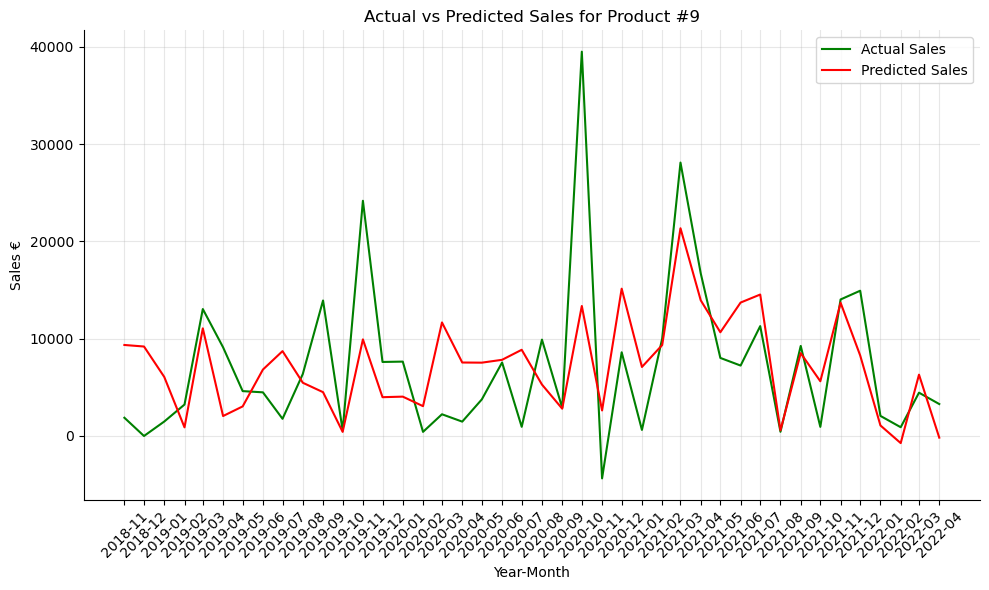

In [157]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p9['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p9['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p9['Full_Date'], p9['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [158]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [159]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [5226.57632678 4842.14757416 5111.65432844 4264.73569144 4990.89699923]
Validation scores: [ 4508.87351143  7763.39818534  9453.52437588 14028.78615071
  9419.20485281]

Average Train RMSE: 4887.2
Average Validation RMSE: 9034.76


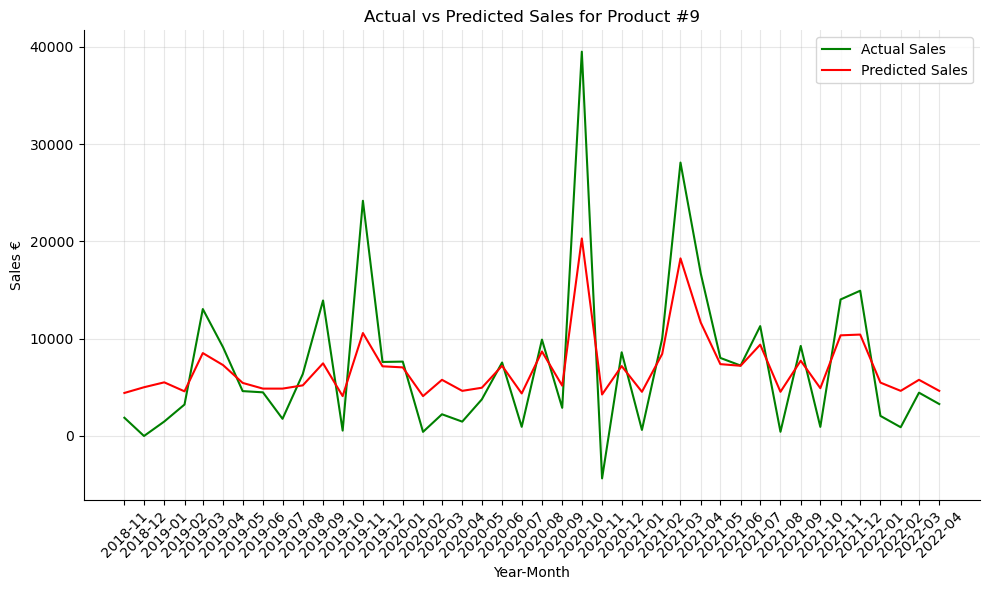

In [160]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p9['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p9['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p9['Full_Date'], p9['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [161]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


In [162]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [6520.67433892 6228.05027833 5854.69084471 4695.13596523 6124.38956088]
Validation scores: [ 5438.91564834  7678.23091124  8828.53518857 13668.74648242
  7713.25826414]

Average Train RMSE: 5884.59
Average Validation RMSE: 8665.54


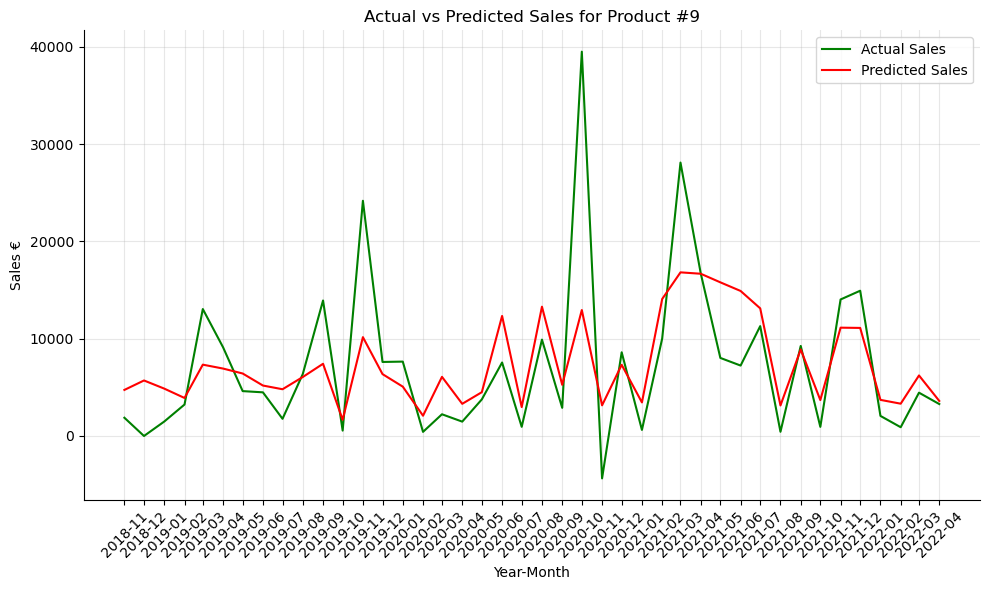

In [163]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p9['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p9['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p9['Full_Date'], p9['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [164]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[C

In [165]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [0. 0. 0. 0. 0.]
Validation scores: [ 6338.22291313 12096.51970517 12853.77389472 15908.31649509
  6567.59781063]

Average Train RMSE: 0.0
Average Validation RMSE: 10752.89


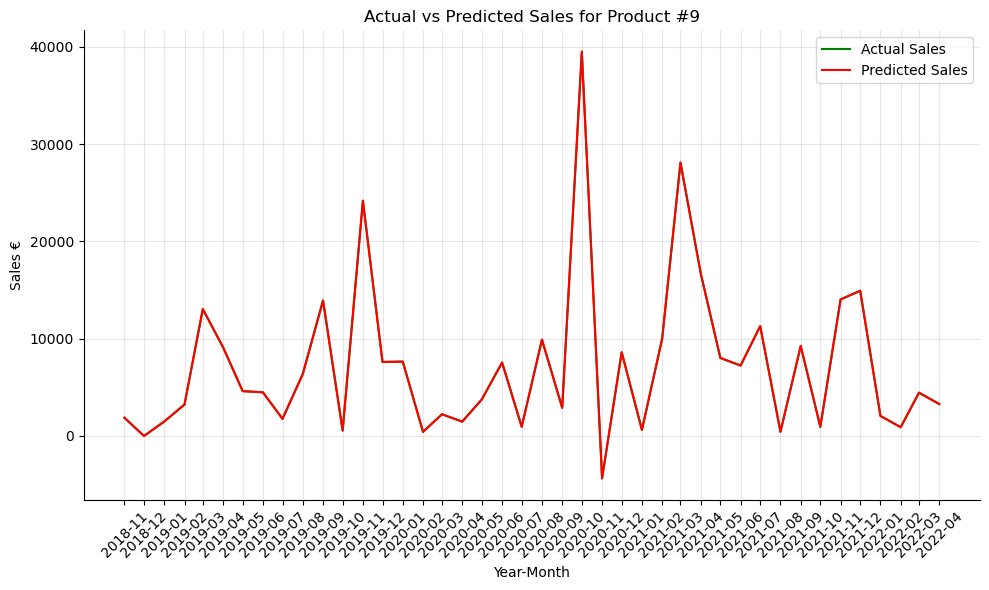

In [166]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p9['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p9['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p9['Full_Date'], p9['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [167]:
df = pd.DataFrame({
    'ds': p9['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph9 = NeuralProphet()
model_ph9.set_plotting_backend("plotly-static")

In [168]:
df_train, df_val = model_ph9.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 42
Train dataset size: 34
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,7600.824219,9544.129883,0.140163,0.0,0,16416.322266,19301.875000,0.288005,0.0
1,8033.095703,9948.403320,0.147889,0.0,1,14195.888672,16983.490234,0.259919,0.0
2,8353.417969,10266.333984,0.154468,0.0,2,13194.326172,15960.174805,0.229000,0.0
3,8579.394531,10516.571289,0.159721,0.0,3,14872.009766,17647.517578,0.255640,0.0
4,8896.064453,10887.165039,0.167828,0.0,4,13320.869141,15775.526367,0.226382,0.0
...,...,...,...,...,...,...,...,...,...
385,11654.483398,15528.769531,0.270011,0.0,385,4520.057617,5989.333008,0.047208,0.0
386,11652.597656,15526.764648,0.269939,0.0,386,4482.366211,6064.636719,0.043819,0.0
387,11648.042969,15522.636719,0.269797,0.0,387,5177.143066,6704.551758,0.057357,0.0
388,11643.801758,15520.033203,0.269660,0.0,388,4124.890625,5577.563477,0.041309,0.0


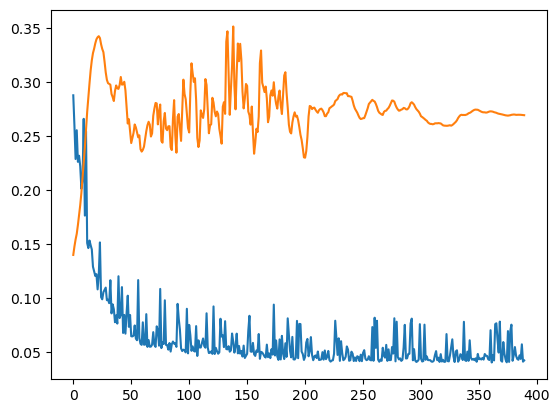

In [169]:
nprof_metrics = model_ph9.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

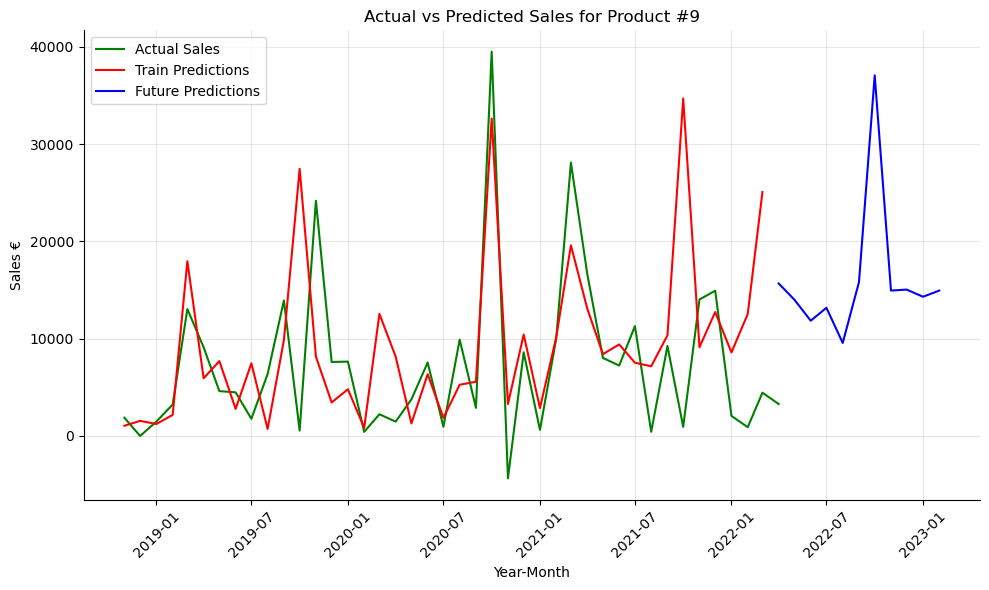

In [170]:
future = model_ph9.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph9.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [171]:
# Compute RMSE
forecast = model_ph9.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 9150.93


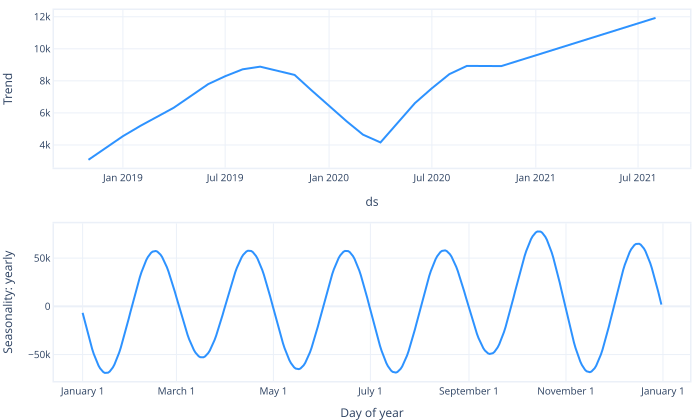

In [172]:
model_ph9.plot_parameters(components=["trend", "seasonality"])

In [173]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-11-01,1875.900024,1052.104980,3075.724121,-2023.618774
1,2018-12-01,0.000000,1553.933594,3800.122070,-2246.188477
2,2019-01-01,1487.000000,1233.414551,4548.666504,-3315.251709
3,2019-02-01,3234.280029,2169.744141,5193.703613,-3023.959229
4,2019-03-01,13050.610352,17973.777344,5717.126465,12256.648438
5,2019-04-01,9119.650391,5935.719238,6323.787598,-388.067963
6,2019-05-01,4614.080078,7699.620605,7048.736816,650.883545
7,2019-06-01,4488.089844,2782.522461,7797.853027,-5015.330078
8,2019-07-01,1766.400024,7470.833496,8288.324219,-817.491638
9,2019-08-01,6371.500000,721.641113,8720.654297,-7999.013184


**ARIMA**

In [174]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   42
Model:                 ARIMA(1, 0, 4)   Log Likelihood                -435.129
Date:                Wed, 10 Apr 2024   AIC                            884.258
Time:                        20:23:57   BIC                            896.422
Sample:                             0   HQIC                           888.717
                                 - 42                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       7267.3180   1885.768      3.854      0.000    3571.280     1.1e+04
ar.L1         -0.8019      0.301     -2.663      0.008      -1.392      -0.212
ma.L1          0.7813      0.573  

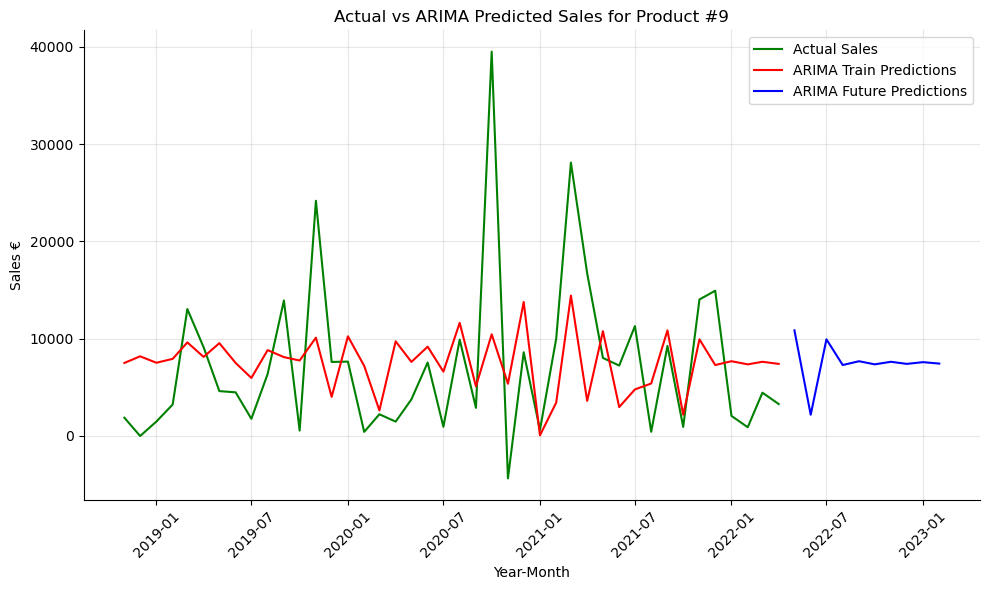

Train RMSE: 7977.095398793015
Validation RMSE: 4740.820850641308


In [175]:
# Fit ARIMA model
arima_model9 = ARIMA(df_train['y'], order=(1,0,4))
arima_fit = arima_model9.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #9')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [176]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Error fitting SARIMA model with parameters p=1, d=1, q=2, P=2, D=1, Q=0: LU decomposition error.
Best SARIMA Model:
                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                   42
Model:             SARIMAX(0, 1, 0)x(2, 1, [1, 2], 12)   Log Likelihood                   0.000
Date:                                 Wed, 10 Apr 2024   AIC                             10.000
Time:                                         20:27:13   BIC                             16.836
Sample:                                              0   HQIC                            12.141
                                                  - 42                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------

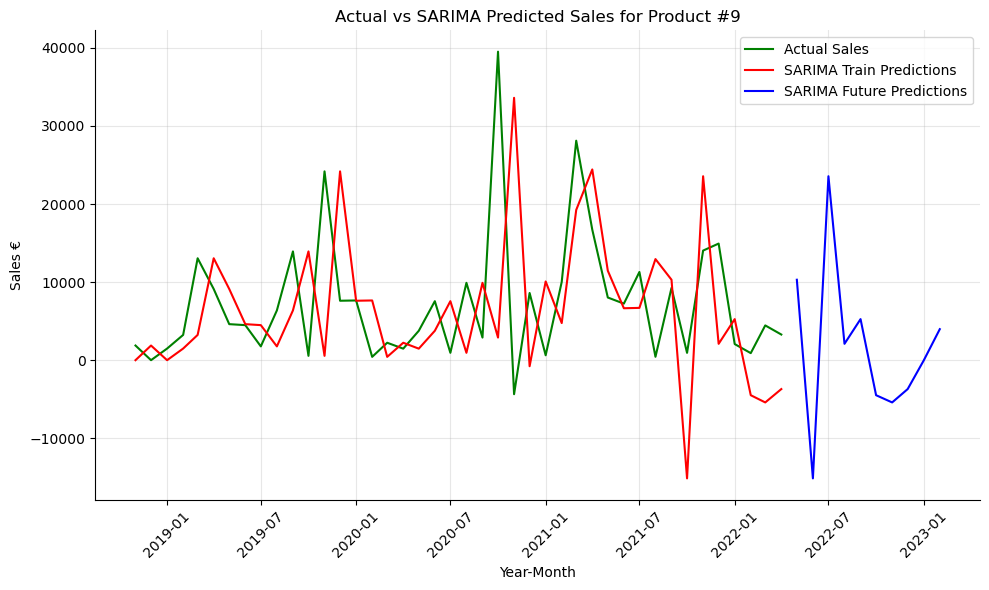

Train RMSE: 11888.81042235895
Validation RMSE: 9356.654640413739


In [177]:
# Fit SARIMA model
sarima_model9 = SARIMAX(df_train['y'], order=(0, 1, 0), seasonal_order=(2, 1, 1, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model9.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #9'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 9150.93 |  
| ARIMA    | 4740.82    | 
| SARIMA    | 9356.65   |

In [178]:
predicted_values_9 = arima_forecast.to_list()
predicted_table_9 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="2_8">
    
##    2.8 Product #11
    
</a>

In [179]:
p11 = pd.read_csv("sales_p11.csv")
p11.head()

,Full_Date,Global Production Index Electrical eq. LAG8,Japan Production Index Electrical eq. LAG6,France Producer Prices Electrical eq. LAG6,Italy Shipments Index M&E LAG8,Switzerland Production Index M&E LAG12,China Production Index M&E LAG8,France Production Index M&E LAG6,Germany Production Index M&E LAG6,France Production Index Electrical eq. LAG6,US Production Index Electrical eq. LAG10,Europe Production Index M&E LAG6,US Production Index M&E LAG7,Germany Shipments Index M&E LAG6,Global Production Index Machinery eq. LAG6,UK Production Index M&E LAG6,Sales €,Japan Production Index M&E LAG6,Europe Shipments Index M&E LAG8,France Shipments Index M&E LAG8
0,2018-10-01,110.44,141.50,102.40,86.44,102.25,163.8,111.94,125.94,94.70,109.60,124.06,107.70,141.80,137.2,119.94,1021303.500,153.90,108.94,103.80
1,2018-11-01,110.56,108.30,102.50,100.50,105.60,163.8,92.25,113.44,83.94,105.75,110.60,109.06,126.40,123.2,106.06,1898844.750,115.56,112.75,104.56
2,2018-12-01,128.10,107.06,102.25,120.25,109.00,227.2,88.50,112.10,81.80,106.80,114.30,111.60,126.25,124.4,107.20,1226122.000,115.40,132.20,121.70
3,2019-01-01,117.70,118.75,102.56,102.90,112.30,210.4,109.75,126.94,95.10,107.94,124.10,110.00,148.00,133.5,111.10,2216391.750,126.94,116.94,106.60
4,2019-02-01,119.00,116.50,102.50,120.60,107.80,221.2,100.80,116.75,86.40,107.30,114.06,112.70,129.90,124.8,106.06,610456.625,123.20,122.10,102.25


In [180]:
X = p11.drop(columns=['Sales €', 'Full_Date'])
y = p11['Sales €']

# 'Full_Date' column to datetime
p11['Full_Date'] = pd.to_datetime(p11['Full_Date'])

**LINEAR REGRESSION**

In [181]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [594062.76596817 436088.75966449 468826.7336457  618645.92799707
 534072.93896793]
Validation scores: [ 744886.64933882 1245943.78180191 1520267.61876212  532955.55036685
 1201164.3003808 ]

Average Train RMSE: 530339.43
Average Validation RMSE: 1049043.58


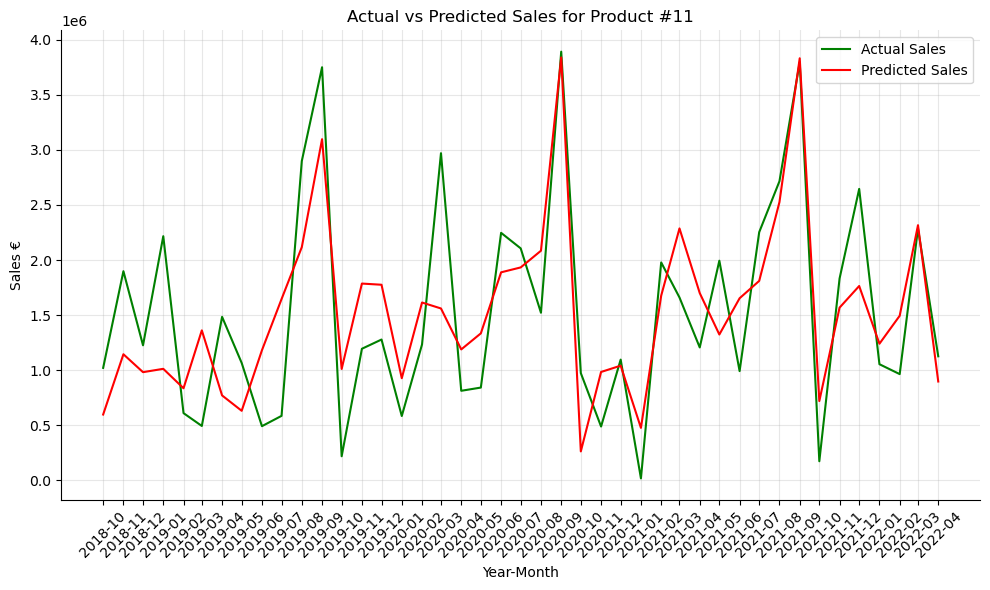

In [182]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p11['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p11['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p11['Full_Date'], p11['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [183]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [184]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [541156.41256825 521081.12030516 521014.79172465 469002.24230068
 584292.98872935]
Validation scores: [ 877670.32271371  824355.92109403 1059855.14162377 1002895.39617909
  767245.90393658]

Average Train RMSE: 527309.51
Average Validation RMSE: 906404.54


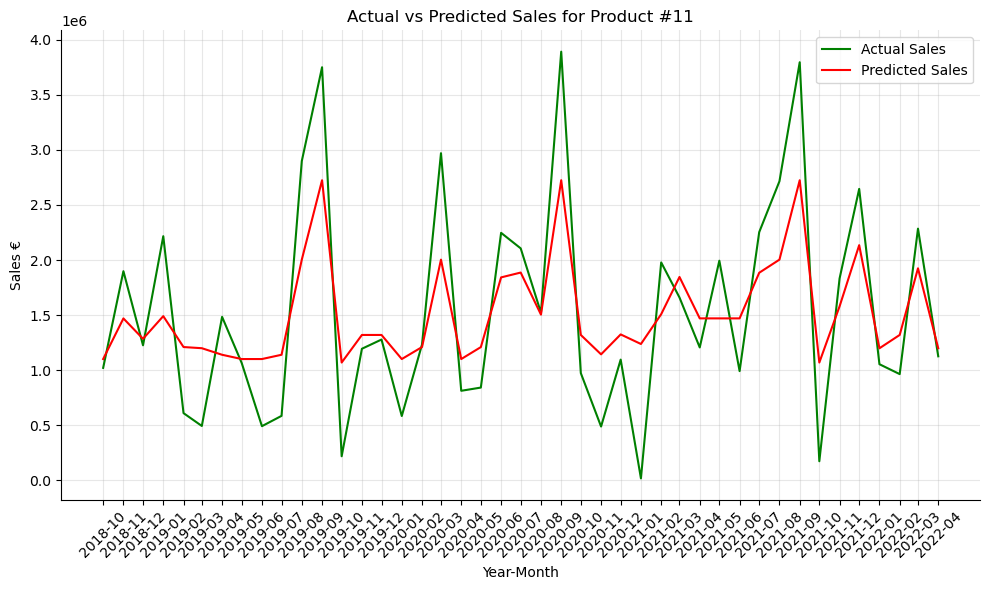

In [185]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p11['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p11['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p11['Full_Date'], p11['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [186]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}


In [187]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [380926.27994744 339941.49776388 351287.84456849 397391.35703524
 412741.03000167]
Validation scores: [ 853238.90659457  881698.27103921 1109847.61810462  833219.32068837
  596957.805946  ]

Average Train RMSE: 376457.6
Average Validation RMSE: 854992.38


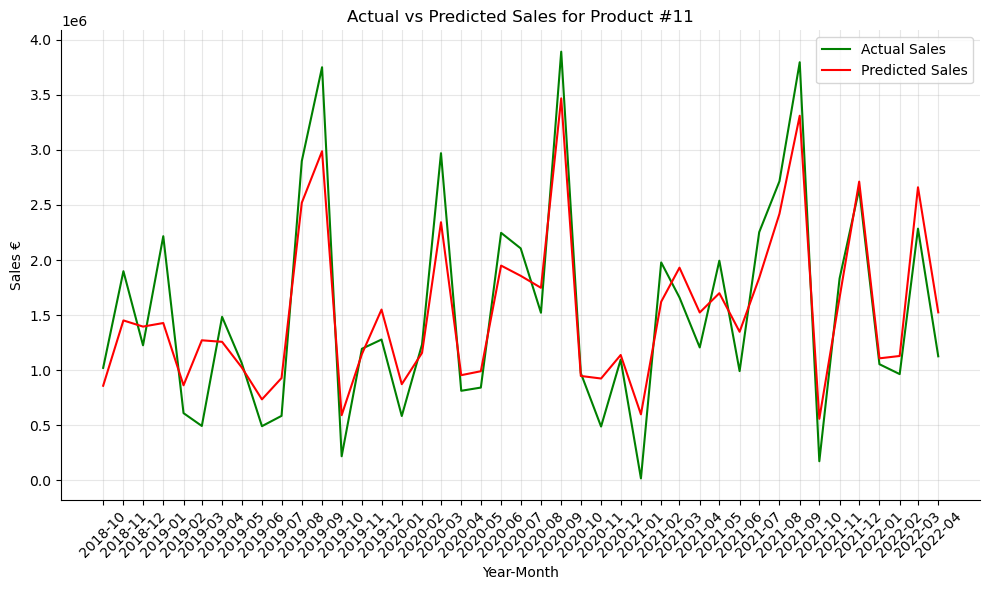

In [188]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p11['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p11['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p11['Full_Date'], p11['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [189]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[C

In [190]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [511298.75360479 420738.26217465 441832.58351337 352327.68382554
 453294.00345721]
Validation scores: [1022130.48702076  847802.3639448  1378016.25861781  888648.71251669
 1068739.00044663]

Average Train RMSE: 435898.26
Average Validation RMSE: 1041067.36


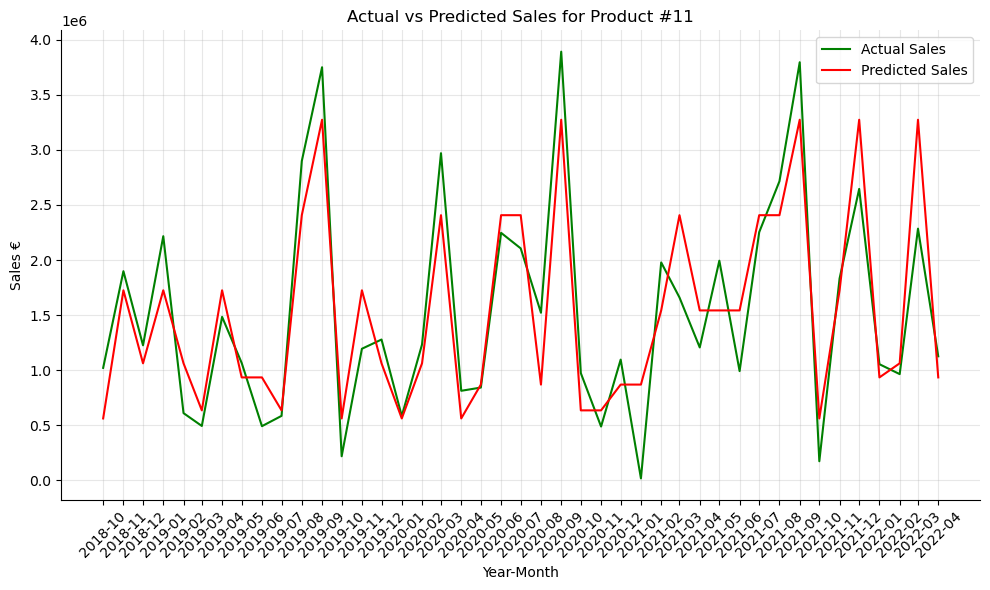

In [191]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p11['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p11['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p11['Full_Date'], p11['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [192]:
df = pd.DataFrame({
    'ds': p11['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph11 = NeuralProphet()
model_ph11.set_plotting_backend("plotly-static")

In [193]:
df_train, df_val = model_ph11.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 43
Train dataset size: 35
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,838495.6250,1.010894e+06,0.144833,0.0,0,1.730961e+06,2.068230e+06,0.285300,0.0
1,840465.6250,1.000128e+06,0.143412,0.0,1,1.672922e+06,2.046944e+06,0.268593,0.0
2,842605.9375,9.892917e+05,0.141968,0.0,2,1.640402e+06,1.979246e+06,0.269567,0.0
3,842823.6875,9.833932e+05,0.141578,0.0,3,1.572578e+06,1.947267e+06,0.240459,0.0
4,842977.6875,9.830506e+05,0.142491,0.0,4,1.457395e+06,1.701974e+06,0.221405,0.0
...,...,...,...,...,...,...,...,...,...
375,918163.6875,1.031008e+06,0.157066,0.0,375,5.199407e+05,6.212435e+05,0.044019,0.0
376,917993.6250,1.030949e+06,0.157034,0.0,376,4.356559e+05,5.712206e+05,0.036066,0.0
377,917997.3750,1.031078e+06,0.157052,0.0,377,4.276079e+05,5.611306e+05,0.033985,0.0
378,917888.8125,1.031045e+06,0.157032,0.0,378,4.523429e+05,5.701618e+05,0.034349,0.0


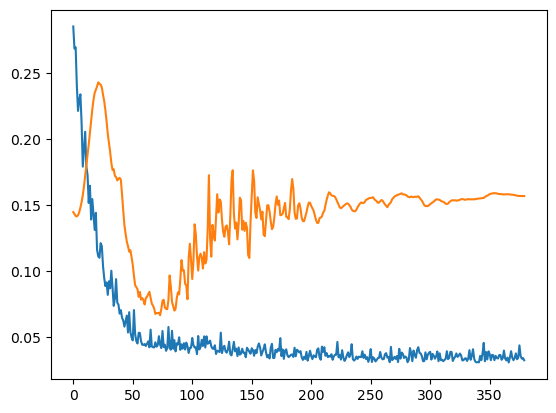

In [194]:
nprof_metrics = model_ph11.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

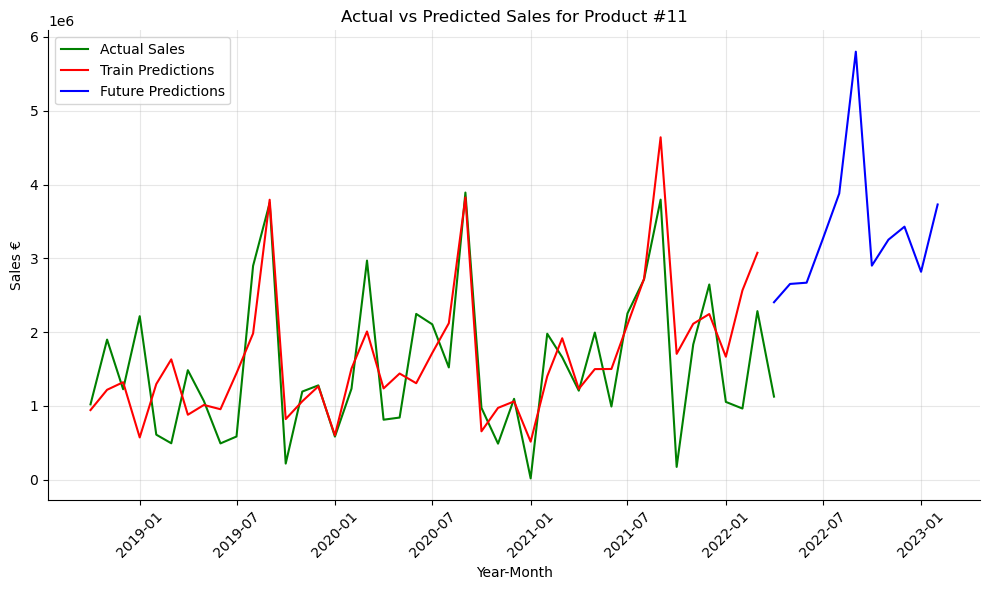

In [195]:
future = model_ph11.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph11.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [196]:
# Compute RMSE
forecast = model_ph11.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 689213.97


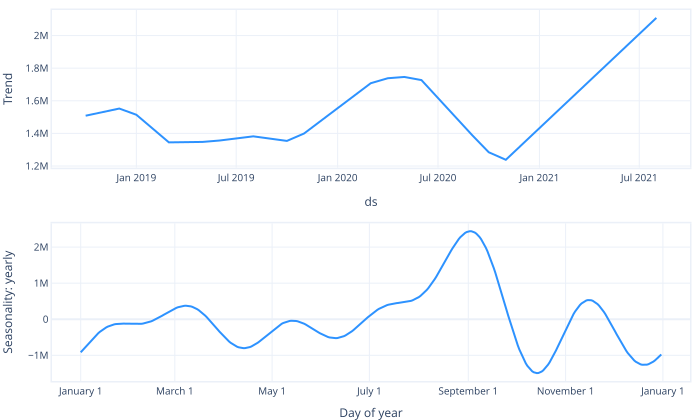

In [197]:
model_ph11.plot_parameters(components=["trend", "seasonality"])

In [198]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-10-01,1.021304e+06,9.437778e+05,1508502.500,-5.647248e+05
1,2018-11-01,1.898845e+06,1.218792e+06,1530792.625,-3.120006e+05
2,2018-12-01,1.226122e+06,1.321192e+06,1552363.500,-2.311710e+05
3,2019-01-01,2.216392e+06,5.731263e+05,1514262.250,-9.411359e+05
4,2019-02-01,6.104566e+05,1.296576e+06,1424631.250,-1.280553e+05
5,2019-03-01,4.939998e+05,1.631134e+06,1345009.375,2.861249e+05
6,2019-04-01,1.484282e+06,8.803562e+05,1346427.750,-4.660715e+05
7,2019-05-01,1.066064e+06,1.013077e+06,1347800.250,-3.347231e+05
8,2019-06-01,4.921332e+05,9.554224e+05,1356404.750,-4.009825e+05
9,2019-07-01,5.856481e+05,1.444623e+06,1370324.625,7.429835e+04


**ARIMA**

In [199]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   43
Model:                 ARIMA(4, 0, 3)   Log Likelihood                -650.066
Date:                Wed, 10 Apr 2024   AIC                           1318.131
Time:                        20:32:56   BIC                           1333.982
Sample:                             0   HQIC                          1323.977
                                 - 43                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.533e+06   1.31e+05     11.675      0.000    1.28e+06    1.79e+06
ar.L1         -0.2597      0.356     -0.730      0.466      -0.957       0.438
ar.L2         -0.0119      0.338  

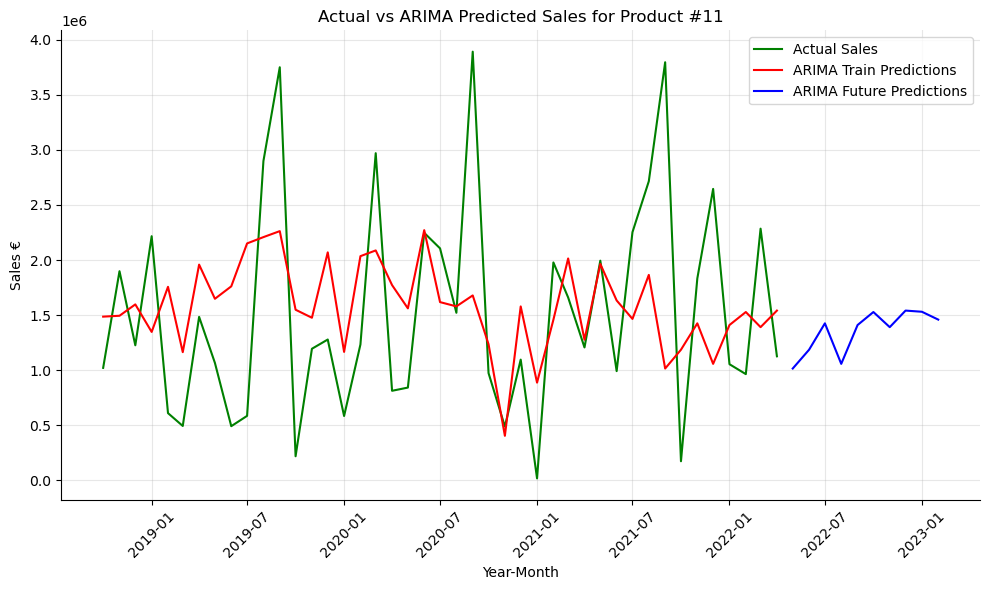

Train RMSE: 834605.1884006463
Validation RMSE: 1267702.1644152866


In [200]:
# Fit ARIMA model
arima_model11 = ARIMA(df_train['y'], order=(4,0,3))
arima_fit = arima_model11.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #11')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [201]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                   43
Model:             SARIMAX(2, 1, 0)x(0, 1, [1], 12)   Log Likelihood                -457.206
Date:                              Wed, 10 Apr 2024   AIC                            922.412
Time:                                      20:35:23   BIC                            928.017
Sample:                                           0   HQIC                           924.205
                                               - 43                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5127      0.157     -3.258      0.001      -0.821      -0.204


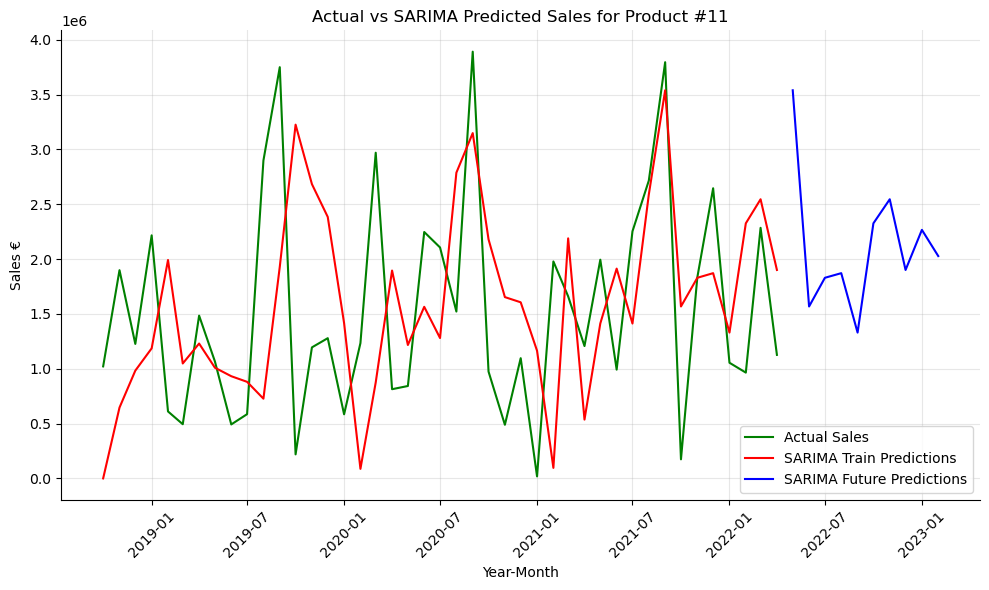

Train RMSE: 1175760.3485476421
Validation RMSE: 806557.7414930739


In [202]:
# Fit SARIMA model
sarima_model11 = SARIMAX(df_train['y'], order=(2, 1, 0), seasonal_order=(0, 1, 1, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model11.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #11'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 689213.97 |  
| ARIMA    | 1267702.16   | 
| SARIMA    | 141456.3  |

In [203]:
predicted_values_11 = sarima_forecast.predicted_mean.to_list()
predicted_table_11 = pd.DataFrame({'date': sarima_future_dates, 'y_hat': sarima_forecast.predicted_mean.to_list()})

<hr>

<a class="anchor" id="2_9">
    
##    2.9 Product #12
    
</a>

In [204]:
p12 = pd.read_csv("sales_p12.csv")
p12.head()

,Full_Date,Europe Shipments Index M&E LAG12,UK Production Index M&E LAG9,Switzerland Production Index Machinery eq. LAG7,Switzerland Production Index Electrical eq. LAG7,Germany Shipments Index M&E LAG9,Japan Production Index M&E LAG9,COVID_Impact,Price of Energy LAG10,China Production Index M&E LAG5,...,Switzerland Production Index M&E LAG7,Sales € LAG6,Italy Production Index Electrical eq. LAG1,China Producer Prices Electrical eq. LAG11,Germany Production Index M&E LAG9,Sales €,Europe Production Index M&E LAG9,France Producer Prices Electrical eq. LAG7,Sales € LAG3,Sales € LAG2
0,2019-04-01,132.20,111.10,102.20,104.80,148.0,126.94,0,94.60,212.0,...,103.20,28686.330078,83.44,95.56,126.94,21813.269531,124.10,102.50,21484.000000,34214.738281
1,2019-05-01,116.94,106.06,102.80,111.20,129.9,123.20,0,93.70,220.5,...,105.94,1070.000000,88.80,96.60,116.75,24468.000000,114.06,102.20,34214.738281,10118.000000
2,2019-06-01,122.10,103.70,106.80,113.00,130.0,115.20,0,93.00,241.9,...,109.06,17880.599609,75.94,97.00,114.70,44255.679688,100.70,102.06,10118.000000,21813.269531
3,2019-07-01,136.50,108.30,110.80,114.75,136.6,127.80,0,92.00,175.6,...,112.25,21484.000000,91.60,97.06,118.56,21318.480469,117.00,102.06,21813.269531,24468.000000
4,2019-08-01,120.44,113.70,114.75,116.50,137.8,125.20,0,98.75,175.6,...,115.40,34214.738281,83.50,96.75,124.25,19217.000000,124.40,102.20,24468.000000,44255.679688


In [205]:
X = p12.drop(columns=['Sales €', 'Full_Date'])
y = p12['Sales €']

# 'Full_Date' column to datetime
p12['Full_Date'] = pd.to_datetime(p12['Full_Date'])

**LINEAR REGRESSION**

In [206]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [54831.43618911 43397.95903431 45052.43111626 47443.61146338
 31729.0952285 ]
Validation scores: [163953.870088   231474.91676868 119158.51127934 164872.42763654
 162990.03450825]

Average Train RMSE: 44490.91
Average Validation RMSE: 168489.95


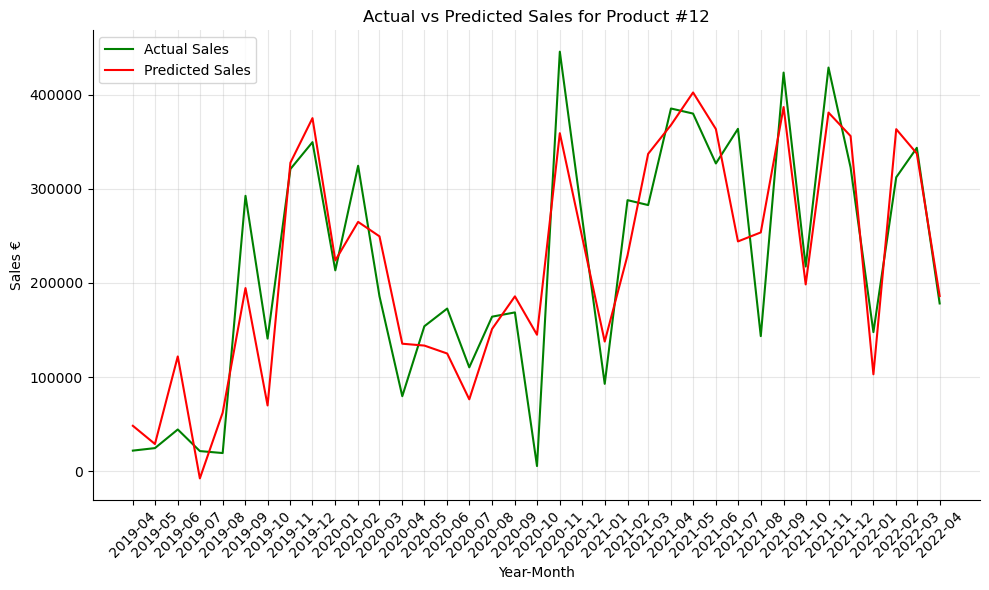

In [207]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p12['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p12['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p12['Full_Date'], p12['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [208]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.4s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.3s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.

In [209]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [17660.74934239 17367.43459277 19046.14825093 18661.71000721
 16038.58363615]
Validation scores: [ 86642.89365493 104334.13608278  99918.09966527 112755.40893451
 128492.00157041]

Average Train RMSE: 17754.93
Average Validation RMSE: 106428.51


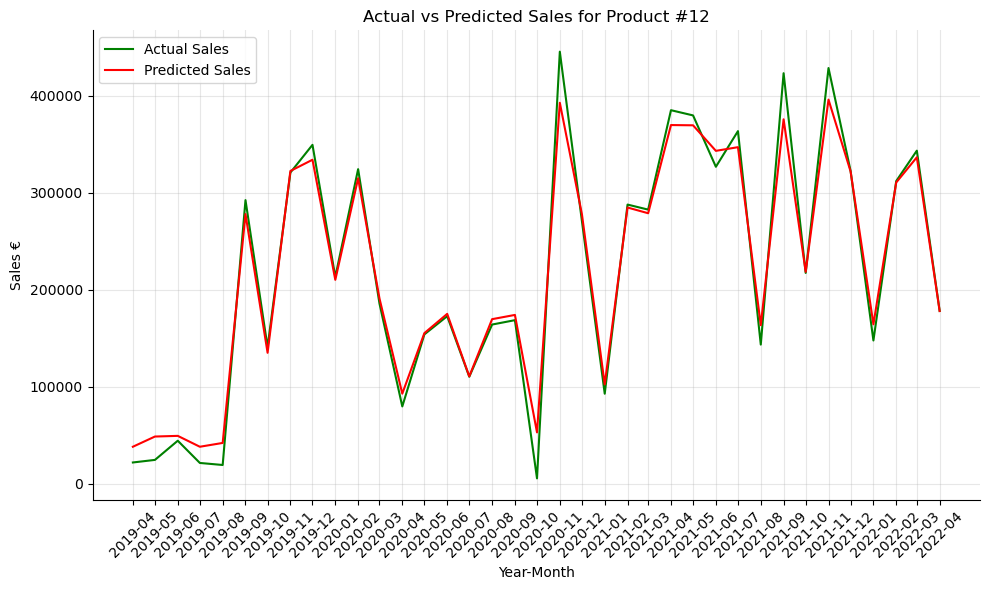

In [210]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p12['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p12['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p12['Full_Date'], p12['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [211]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [212]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [43390.24879385 41937.98062457 40406.91622252 44302.40664208
 35946.21657555]
Validation scores: [ 75548.19427023  85025.56801382 111552.56343897  76821.30363865
 125157.11146916]

Average Train RMSE: 41196.75
Average Validation RMSE: 94820.95


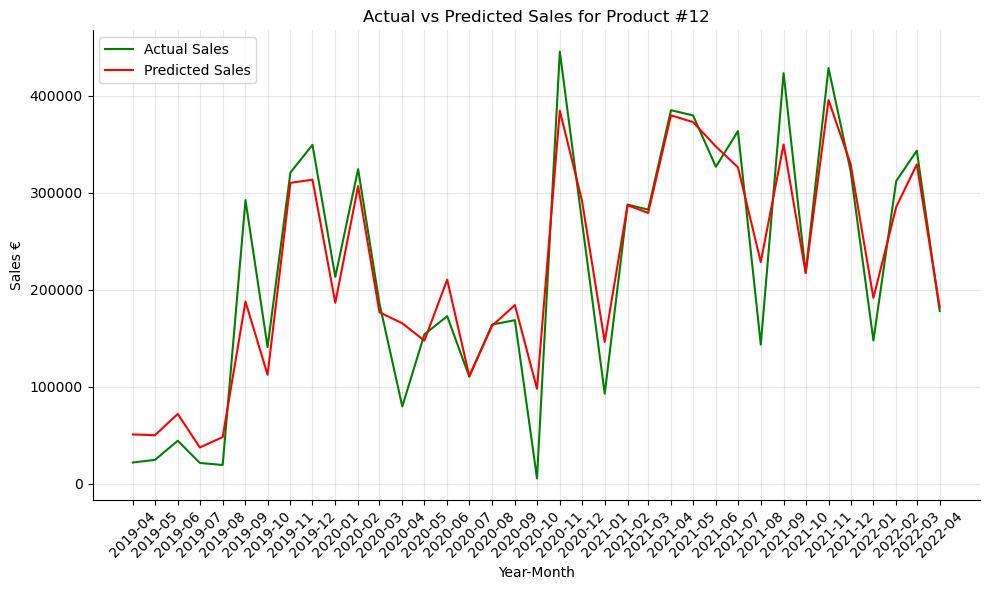

In [213]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p12['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p12['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p12['Full_Date'], p12['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [214]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s

In [215]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [ 5175.98211425  4154.13682548 22980.56906924  4457.19911212
 11529.82814691]
Validation scores: [117197.21234316 128578.36778787 102051.11591766 152439.04536086
 132964.8829587 ]

Average Train RMSE: 9659.54
Average Validation RMSE: 126646.12


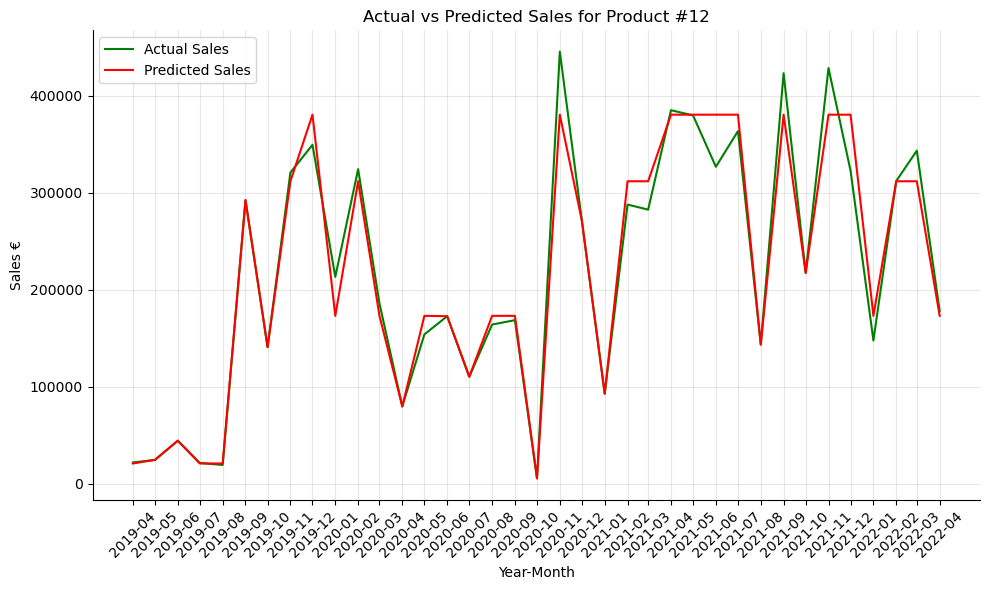

In [216]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p12['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p12['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p12['Full_Date'], p12['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [217]:
df = pd.DataFrame({
    'ds': p12['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph12 = NeuralProphet()
model_ph12.set_plotting_backend("plotly-static")

In [218]:
df_train, df_val = model_ph12.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 37
Train dataset size: 30
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/202 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,136461.265625,164339.109375,0.219119,0.0,0,220079.109375,266635.531250,0.301145,0.0
1,132874.218750,158955.359375,0.209194,0.0,1,209645.625000,257324.390625,0.279870,0.0
2,129148.578125,154156.796875,0.200183,0.0,2,201896.984375,248394.218750,0.265531,0.0
3,125729.203125,150236.500000,0.192585,0.0,3,200749.078125,250438.593750,0.262964,0.0
4,122218.578125,146543.843750,0.185192,0.0,4,192183.187500,238434.843750,0.250834,0.0
...,...,...,...,...,...,...,...,...,...
405,236544.359375,253288.468750,0.443880,0.0,405,48438.824219,56683.339844,0.025344,0.0
406,236487.328125,253232.531250,0.443750,0.0,406,46955.218750,54297.152344,0.024416,0.0
407,236470.468750,253214.921875,0.443712,0.0,407,48759.714844,57167.769531,0.025599,0.0
408,236438.734375,253178.500000,0.443641,0.0,408,48382.105469,56520.515625,0.025212,0.0


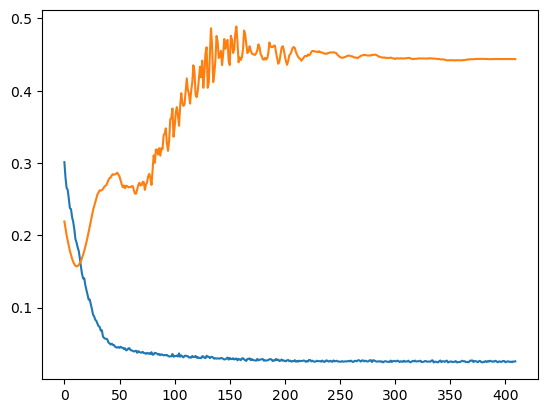

In [219]:
nprof_metrics = model_ph12.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

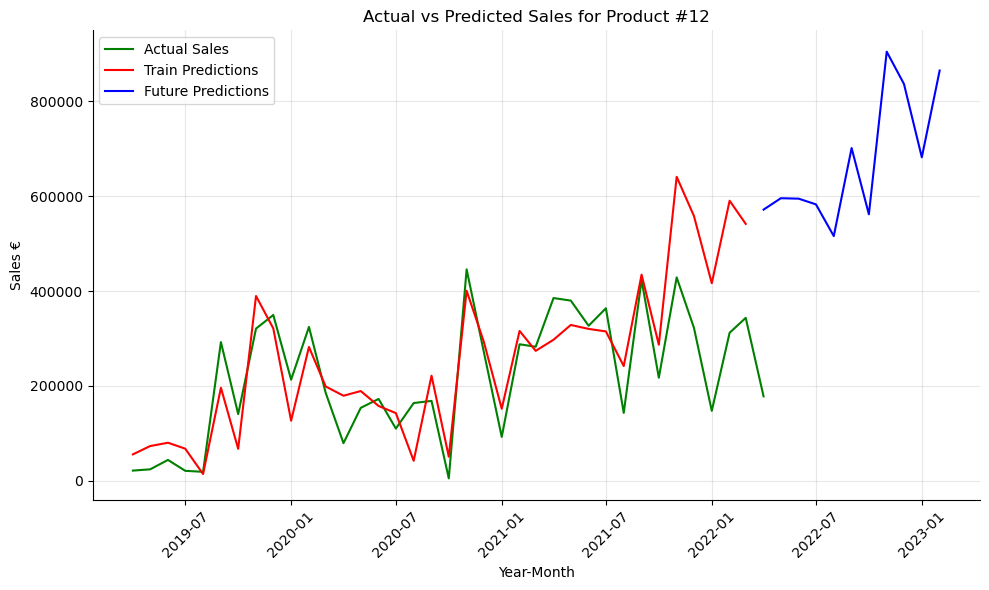

In [220]:
future = model_ph12.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph12.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [221]:
# Compute RMSE
forecast = model_ph12.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 121590.02


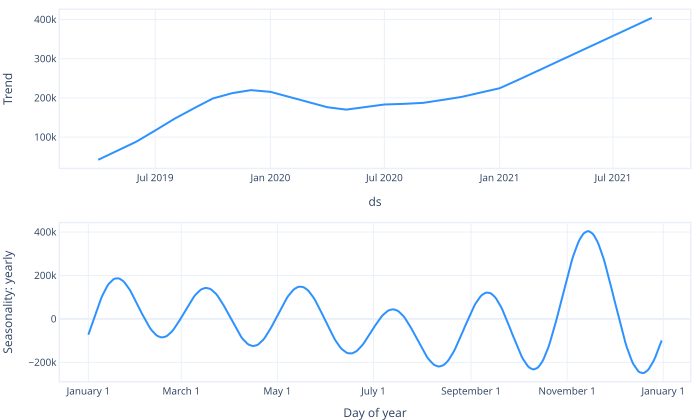

In [222]:
model_ph12.plot_parameters(components=["trend", "seasonality"])

In [223]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-04-01,21813.269531,55977.468750,42191.898438,13785.566406
1,2019-05-01,24468.000000,73453.859375,64966.242188,8487.615234
2,2019-06-01,44255.679688,80528.101562,88499.734375,-7971.631836
3,2019-07-01,21318.480469,67945.890625,116938.171875,-48992.277344
4,2019-08-01,19217.000000,14517.596680,147045.718750,-132528.109375
5,2019-09-01,292490.406250,196288.062500,173669.078125,22618.984375
6,2019-10-01,140819.687500,67619.562500,198524.765625,-130905.195312
7,2019-11-01,320942.281250,389561.250000,212125.343750,177435.906250
8,2019-12-01,349515.281250,321369.125000,219822.718750,101546.390625
9,2020-01-01,213315.312500,126836.906250,215487.734375,-88650.828125


**ARIMA**

In [224]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   37
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -481.452
Date:                Wed, 10 Apr 2024   AIC                            982.903
Time:                        20:41:21   BIC                            999.012
Sample:                             0   HQIC                           988.582
                                 - 37                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.207e+05   4.98e+04      4.429      0.000    1.23e+05    3.18e+05
ar.L1          0.6444      0.498      1.293      0.196      -0.332       1.621
ar.L2         -0.2538      0.488  

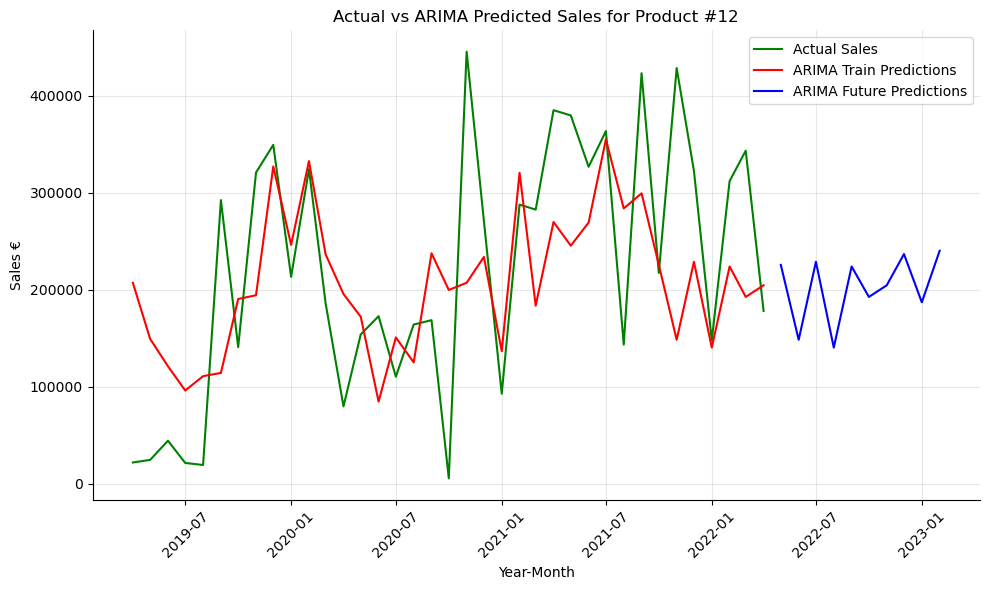

Train RMSE: 105274.62768237163
Validation RMSE: 130250.19519819126


In [225]:
# Fit ARIMA model
arima_model12 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model12.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #12')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [226]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   37
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -313.378
Date:                            Wed, 10 Apr 2024   AIC                            634.756
Time:                                    20:43:08   BIC                            639.469
Sample:                                         0   HQIC                           636.007
                                             - 37                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5539      0.504     -1.099      0.272      -1.542       0.434
ar.L2         -0

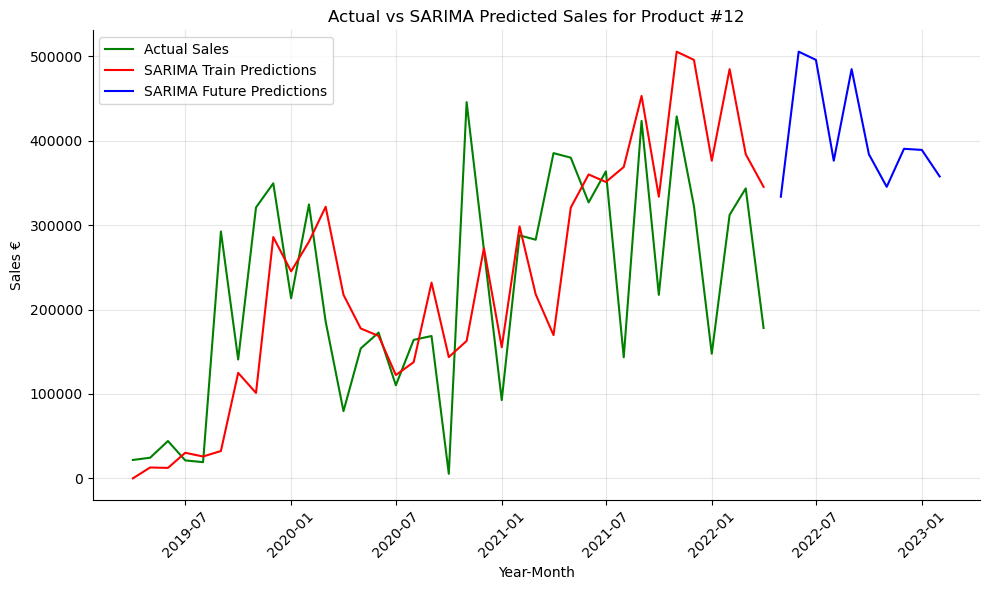

Train RMSE: 112252.52589864274
Validation RMSE: 151653.65573942653


In [227]:
# Fit SARIMA model
sarima_model12 = SARIMAX(df_train['y'], order=(2, 1, 0), seasonal_order=(1, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model12.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #12'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 121590.02 |  
| ARIMA    | 130250.2    | 
| SARIMA    | 151653.66   |

* This prediction believes in an increasing trend of product #12

In [228]:
predicted_values_12 = forecast['yhat1'].values[-10:]  
predicted_table_12 = forecast[-10:] 

<hr>

<a class="anchor" id="2_10">
    
##    2.10 Product #13
    
</a>

In [229]:
p13 = pd.read_csv("sales_p13.csv")
p13.head()

,Full_Date,Japan Production Index M&E LAG11,Sales € LAG2,Germany Production Index M&E LAG12,China Production Index M&E LAG1,France Shipments Index M&E LAG3,Switzerland Production Index Electrical eq. LAG11,Sales €,Global Production Index Machinery eq. LAG3,France Producer Prices Electrical eq. LAG9,Europe Shipments Index M&E LAG3,United States: EUR in LCU LAG7
0,2018-12-01,127.25,27666.099609,130.90,212.0,92.80,117.56,15655.179688,118.9,102.25,112.3,1.228
1,2019-01-01,112.44,68180.000000,130.10,220.5,110.50,112.06,27198.289062,128.5,102.40,127.7,1.182
2,2019-02-01,119.80,15655.179688,106.60,241.9,122.44,106.56,32638.630859,131.4,102.50,131.0,1.168
3,2019-03-01,153.90,27198.289062,109.40,175.6,115.94,101.06,11890.000000,130.0,102.25,132.9,1.169
4,2019-04-01,115.56,32638.630859,125.94,175.6,115.10,98.06,7488.540039,124.2,102.56,131.2,1.155


In [230]:
X = p13.drop(columns=['Sales €', 'Full_Date'])
y = p13['Sales €']

# 'Full_Date' column to datetime
p13['Full_Date'] = pd.to_datetime(p13['Full_Date'])

**LINEAR REGRESSION**

In [231]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [12984.89275344 12930.55394977  9737.68130757 12482.36097391
 10400.66263869]
Validation scores: [11981.39575512  9711.44435624 23700.15435126 13724.56987693
 20341.96985819]

Average Train RMSE: 11707.23
Average Validation RMSE: 15891.91


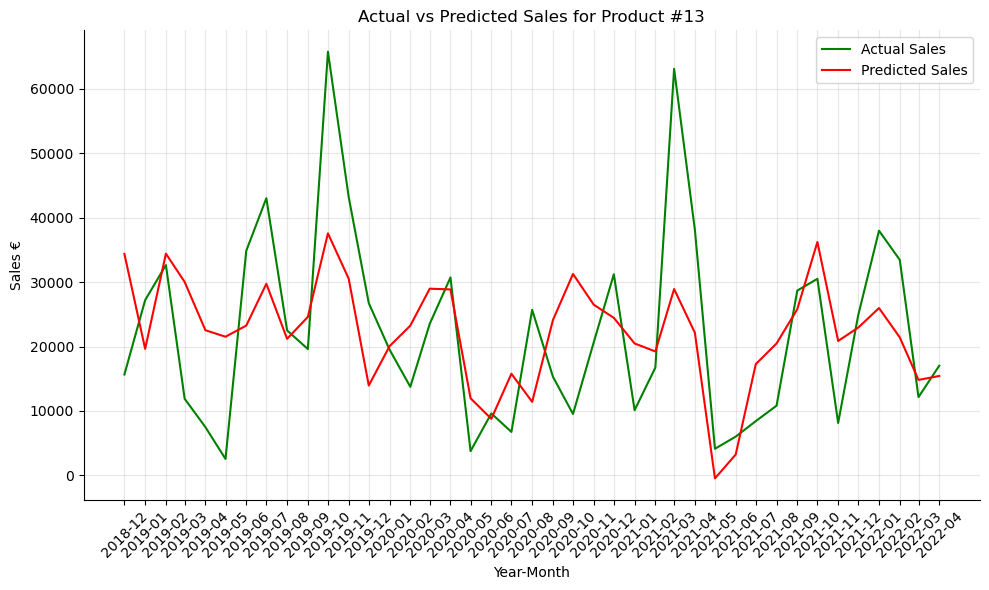

In [232]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p13['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p13['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p13['Full_Date'], p13['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [233]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.5s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [234]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [7652.27937075 7798.2443267  6972.15808925 7687.68408697 6821.08008778]
Validation scores: [12309.69169327 11440.17323101 18228.01999959  9846.64259035
 17918.0836749 ]

Average Train RMSE: 7386.29
Average Validation RMSE: 13948.52


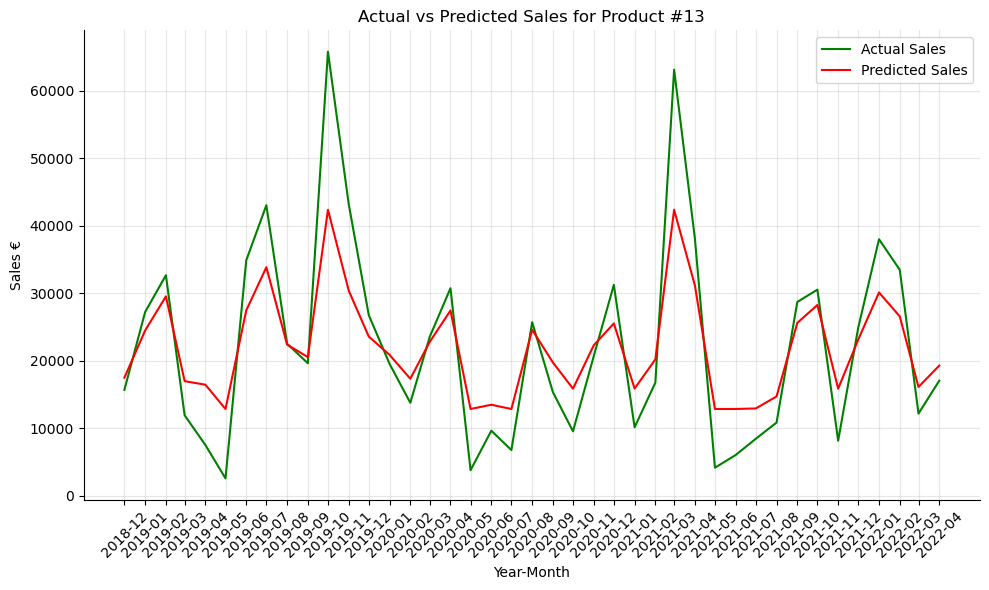

In [235]:
# Fit the model
xgb_reg.fit(X, y)

# Predict sales using the fitted model
predicted_sales = xgb_reg.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p13['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p13['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p13['Full_Date'], p13['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [236]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   1.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}


In [237]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [9587.97894088 8689.98770559 8226.15585785 9033.66080431 8402.22027347]
Validation scores: [11400.23343748  7870.79509312 15956.19320183 10636.74978802
 16654.00880948]

Average Train RMSE: 8788.0
Average Validation RMSE: 12503.6


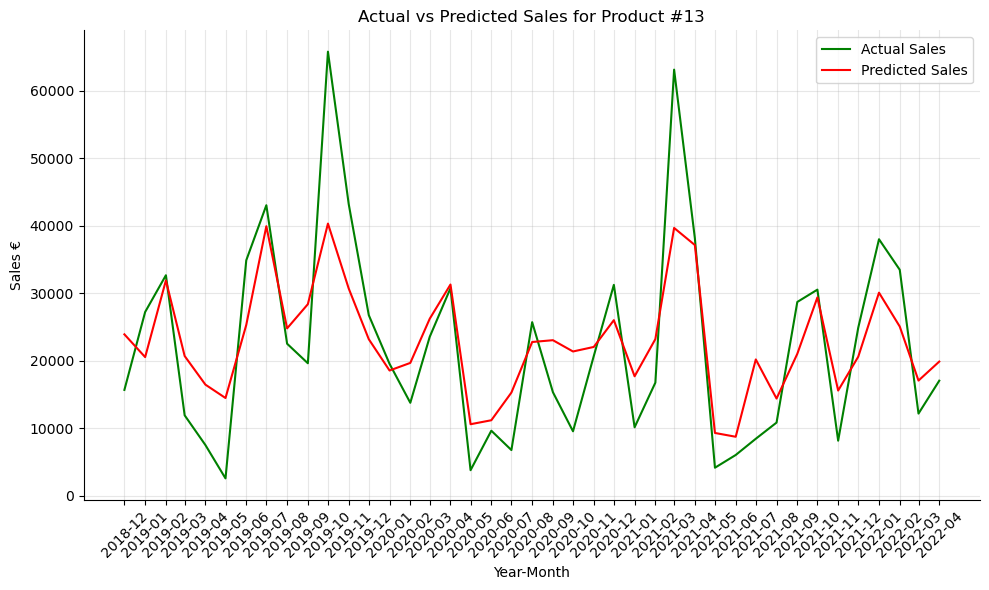

In [238]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p13['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p13['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p13['Full_Date'], p13['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [239]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[C

In [240]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [10262.28858066  7956.98285099  8588.21070375  8076.19496905
  7624.59701061]
Validation scores: [13690.24000049 18448.52881221 19312.85313936 16418.55819294
 18539.22746173]

Average Train RMSE: 8501.65
Average Validation RMSE: 17281.88


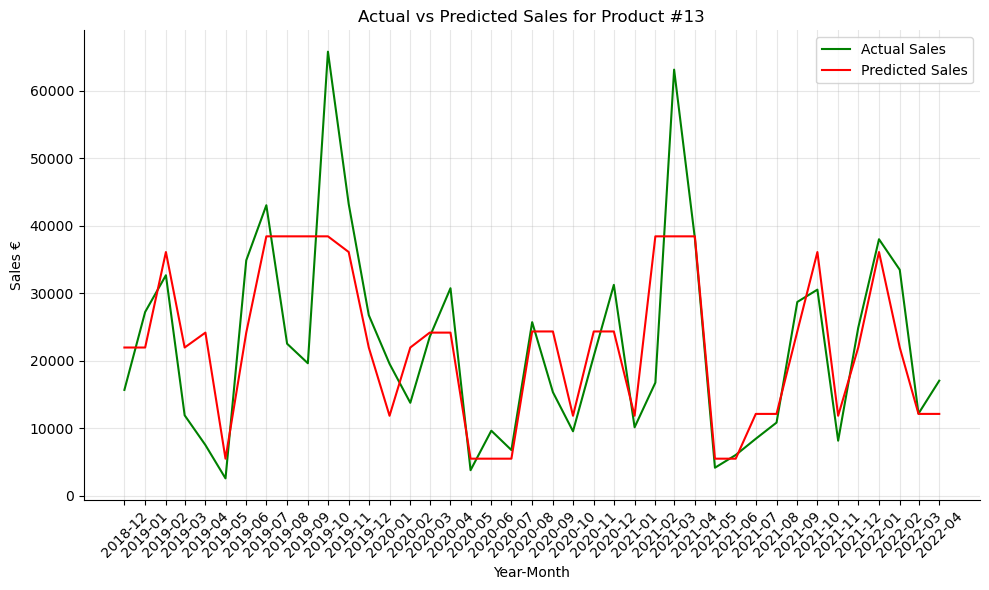

In [241]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p13['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p13['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p13['Full_Date'], p13['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [242]:
df = pd.DataFrame({
    'ds': p13['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph13 = NeuralProphet()
model_ph13.set_plotting_backend("plotly-static")

In [243]:
df_train, df_val = model_ph13.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 41
Train dataset size: 33
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,18520.066406,21616.513672,0.249671,0.0,0,24656.257812,28634.041016,0.261378,0.0
1,18704.158203,21675.353516,0.251425,0.0,1,28856.900391,31758.197266,0.351569,0.0
2,18806.525391,21745.824219,0.252848,0.0,2,29611.302734,33780.089844,0.368673,0.0
3,18863.978516,21778.240234,0.253499,0.0,3,23203.107422,26165.298828,0.240902,0.0
4,18968.283203,21848.632812,0.254870,0.0,4,25548.498047,29176.375000,0.276141,0.0
...,...,...,...,...,...,...,...,...,...
385,14538.986328,15724.884766,0.164668,0.0,385,9134.581055,11291.120117,0.061404,0.0
386,14538.905273,15724.018555,0.164680,0.0,386,8475.203125,10744.331055,0.055113,0.0
387,14541.081055,15725.311523,0.164723,0.0,387,8103.664062,10445.127930,0.052663,0.0
388,14543.431641,15726.128906,0.164750,0.0,388,8148.212402,10435.519531,0.052954,0.0


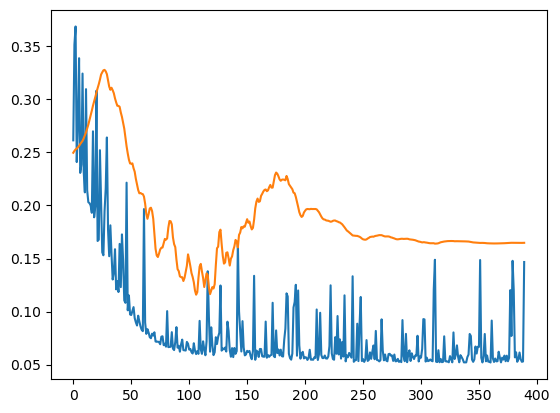

In [244]:
nprof_metrics = model_ph13.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

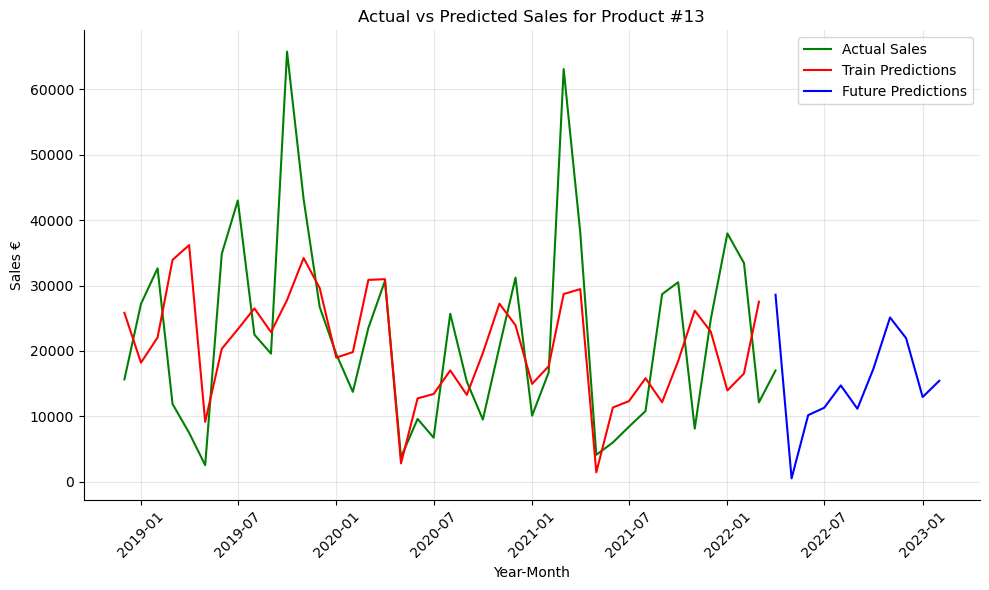

In [245]:
future = model_ph13.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph13.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [246]:
# Compute RMSE
forecast = model_ph13.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 13585.74


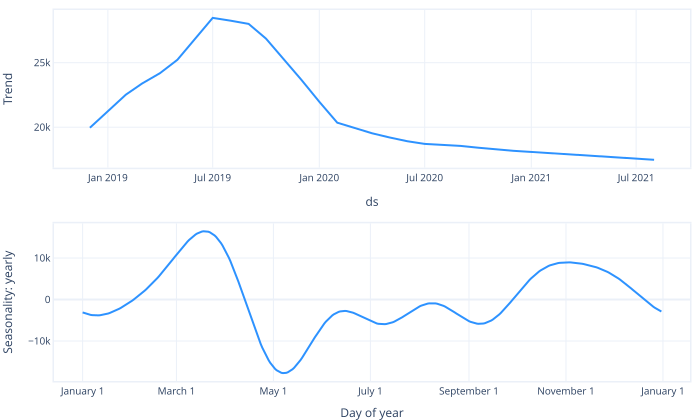

In [247]:
model_ph13.plot_parameters(components=["trend", "seasonality"])

In [248]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-12-01,15655.179688,25839.429688,19959.539062,5879.890137
1,2019-01-01,27198.289062,18213.164062,21240.271484,-3027.107422
2,2019-02-01,32638.630859,22063.621094,22521.005859,-457.383423
3,2019-03-01,11890.000000,33928.859375,23384.099609,10544.758789
4,2019-04-01,7488.540039,36188.273438,24189.738281,11998.538086
5,2019-05-01,2550.310059,9173.960938,25223.623047,-16049.660156
6,2019-06-01,34849.210938,20329.708984,26874.238281,-6544.529785
7,2019-07-01,43008.351562,23319.160156,28471.607422,-5152.447754
8,2019-08-01,22497.599609,26512.332031,28254.531250,-1742.198730
9,2019-09-01,19601.050781,22882.281250,28006.265625,-5123.983887


**ARIMA**

In [249]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   41
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -443.154
Date:                Wed, 10 Apr 2024   AIC                            906.309
Time:                        20:49:44   BIC                            923.444
Sample:                             0   HQIC                           912.548
                                 - 41                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.228e+04    714.521     31.176      0.000    2.09e+04    2.37e+04
ar.L1          0.9106      0.858      1.061      0.289      -0.772       2.593
ar.L2          0.2238      0.531  

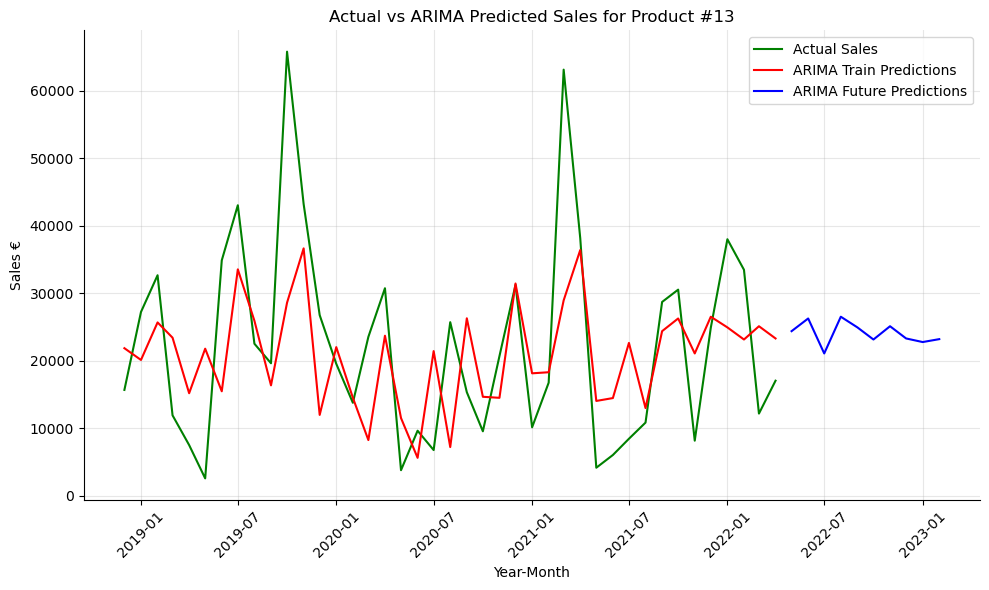

Train RMSE: 12968.051459401117
Validation RMSE: 9288.407920972479


In [250]:
# Fit ARIMA model
arima_model13 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model13.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #13')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [251]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Best SARIMA Model:
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                   41
Model:             SARIMAX(2, 1, 0)x(0, 1, [1], 12)   Log Likelihood                -312.675
Date:                              Wed, 10 Apr 2024   AIC                            633.350
Time:                                      20:51:19   BIC                            638.679
Sample:                                           0   HQIC                           634.979
                                               - 41                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0768      0.305     -0.252      0.801      -0.674       0.521


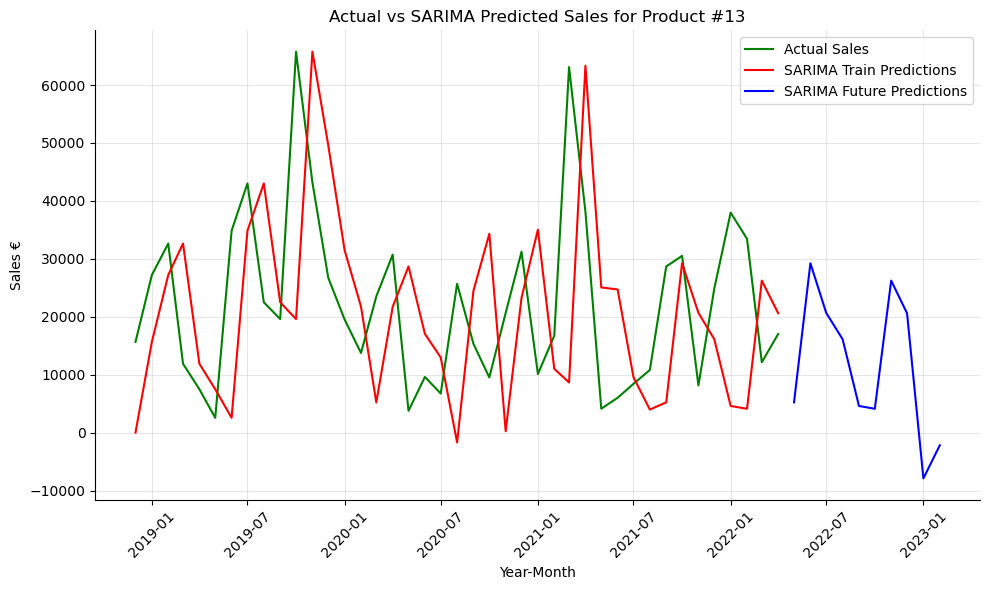

Train RMSE: 20552.077751217115
Validation RMSE: 19270.767800320584


In [252]:
# Fit SARIMA model
sarima_model13 = SARIMAX(df_train['y'], order=(0, 1, 0), seasonal_order=(2, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model13.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #13'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 13585.74 |  
| ARIMA    | 9288.41    | 
| SARIMA    | 19270.77   |

* Although ARIMA presents better score, the predictions are of not convincent, just the repetition of the last months, with problems in expressing high or low points

In [253]:
predicted_values_13 = forecast['yhat1'].values[-10:]  
predicted_table_13 = forecast[-10:] 

<hr>

<a class="anchor" id="2_11">
    
##    2.11 Product #14
    
</a>

In [254]:
p14 = pd.read_csv("sales_p14.csv")
p14.head()

,Full_Date,Global Production Index Electrical eq. LAG7,UK Production Index Electrical eq. LAG1,France Production Index M&E LAG7,Europe Production Index M&E LAG7,US Production Index M&E LAG8,Germany Production Index Electrical eq. LAG3,Sales €,Italy Shipments Index M&E LAG11,Italy Production Index Electrical eq. LAG7,France Producer Prices Electrical eq. LAG12,Italy Production Index M&E LAG11,Sales € LAG2,France Production Index Electrical eq. LAG7
0,2018-12-01,117.70,118.70,92.25,110.60,109.06,111.3,0.000000,131.60,76.75,101.40,88.94,5770.000000,83.94
1,2019-01-01,119.00,120.44,88.50,114.30,111.60,110.9,1686.400024,86.44,89.80,101.40,96.20,17130.000000,81.80
2,2019-02-01,126.30,105.40,109.75,124.10,110.00,118.3,19196.300781,100.50,89.44,102.25,103.25,0.000000,95.10
3,2019-03-01,121.94,107.20,100.80,114.06,112.70,117.2,7535.250000,120.25,90.80,102.25,116.10,1686.400024,86.40
4,2019-04-01,117.50,110.60,68.25,100.70,106.56,89.6,0.000000,102.90,46.90,102.40,101.25,19196.300781,64.30


In [255]:
X = p14.drop(columns=['Sales €', 'Full_Date'])
y = p14['Sales €']

# 'Full_Date' column to datetime
p14['Full_Date'] = pd.to_datetime(p14['Full_Date'])

**LINEAR REGRESSION**

In [256]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [14656.05460951 11797.94099615 13964.94862717 11397.89854056
 14367.38213399]
Validation scores: [14023.45582388 23064.29536465 18331.92638549 25624.26089614
 14706.20460155]

Average Train RMSE: 13236.84
Average Validation RMSE: 19150.03


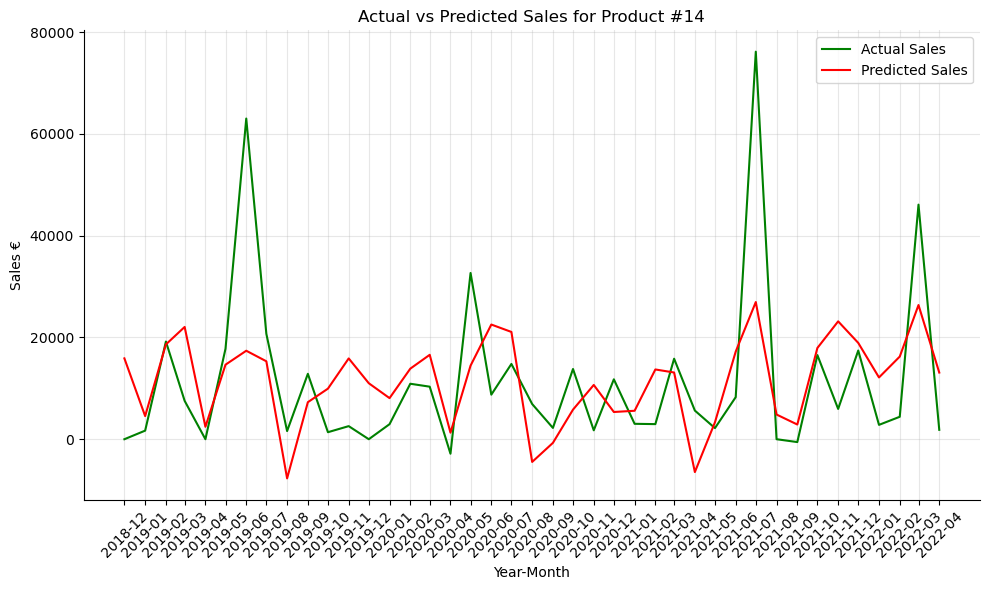

In [257]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p14['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p14['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p14['Full_Date'], p14['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [258]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [259]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [9874.52202342 8580.4413808  8923.13131986 7054.6464184  9086.75858574]
Validation scores: [10444.54922154 19864.54417808 10498.46684446 23599.99256053
 11109.52201613]

Average Train RMSE: 8703.9
Average Validation RMSE: 15103.41


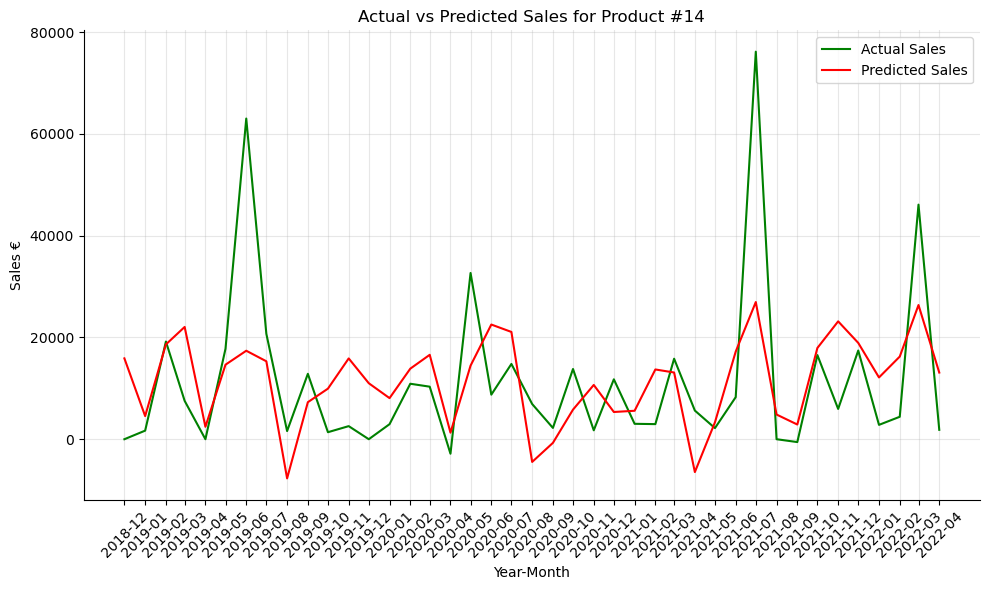

In [260]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p14['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p14['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p14['Full_Date'], p14['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [261]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}


In [262]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [13139.49876255 11166.53346185 12154.91566332  8992.4738384
 12861.03808668]
Validation scores: [ 9190.23102461 18930.85313784 14372.88718401 25227.34160451
 10344.47787063]

Average Train RMSE: 11662.89
Average Validation RMSE: 15613.16


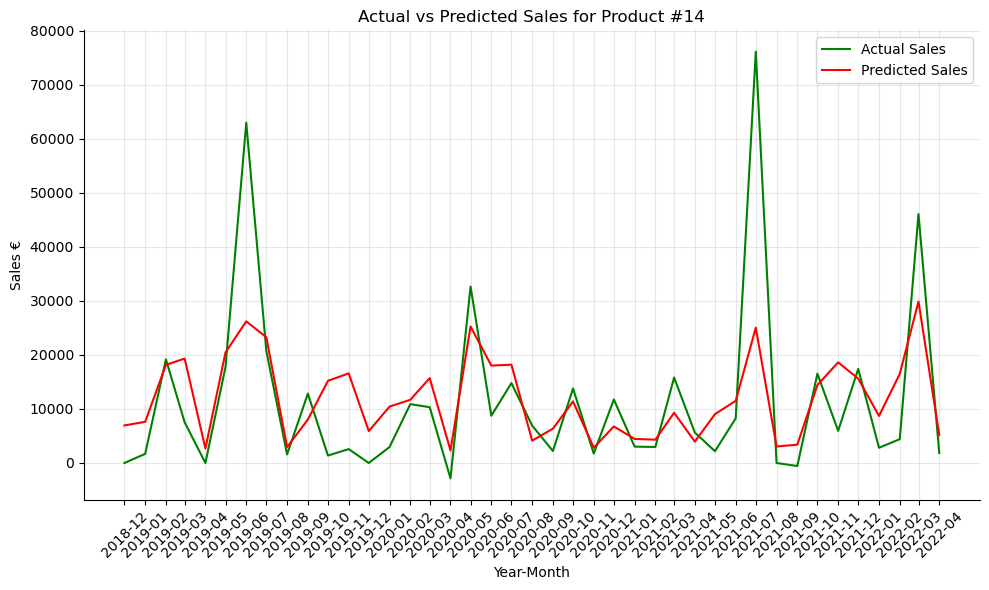

In [263]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p14['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p14['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p14['Full_Date'], p14['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [264]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[C

In [265]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [11620.2762558   9004.17145751 12448.37804509  8916.64815334
 10654.00767383]
Validation scores: [ 8234.94962647 19754.58449117 18723.92325699 24298.29686107
  8430.20704927]

Average Train RMSE: 10528.7
Average Validation RMSE: 15888.39


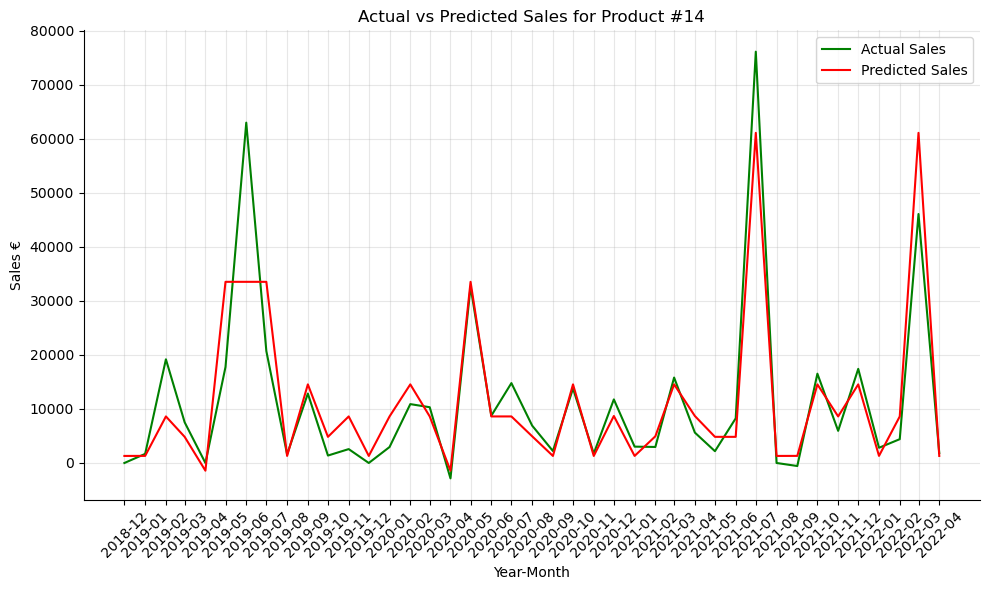

In [266]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p14['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p14['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p14['Full_Date'], p14['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [267]:
df = pd.DataFrame({
    'ds': p14['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph14 = NeuralProphet()
model_ph14.set_plotting_backend("plotly-static")

In [268]:
df_train, df_val = model_ph14.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 41
Train dataset size: 33
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,12803.711914,15597.632812,0.144882,0.0,0,16789.488281,21076.980469,0.170225,0.0
1,12726.134766,15639.931641,0.145153,0.0,1,22029.482422,25739.771484,0.262334,0.0
2,12729.562500,15772.838867,0.147089,0.0,2,22062.501953,26307.699219,0.265240,0.0
3,12641.929688,15754.470703,0.146945,0.0,3,15754.041016,17992.392578,0.156451,0.0
4,12568.021484,15768.686523,0.147286,0.0,4,18448.546875,22932.996094,0.185466,0.0
...,...,...,...,...,...,...,...,...,...
385,8578.445312,13223.138672,0.093721,0.0,385,7088.877930,11001.556641,0.053325,0.0
386,8574.162109,13219.443359,0.093702,0.0,386,6751.233398,10181.857422,0.051553,0.0
387,8571.193359,13217.208008,0.093697,0.0,387,7063.670410,9597.318359,0.052306,0.0
388,8571.794922,13217.364258,0.093730,0.0,388,6913.970215,9522.081055,0.051968,0.0


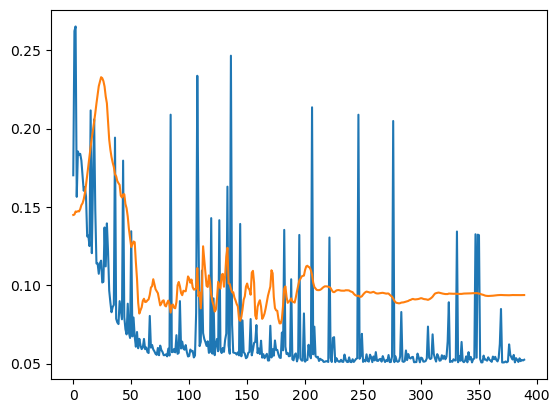

In [269]:
nprof_metrics = model_ph14.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

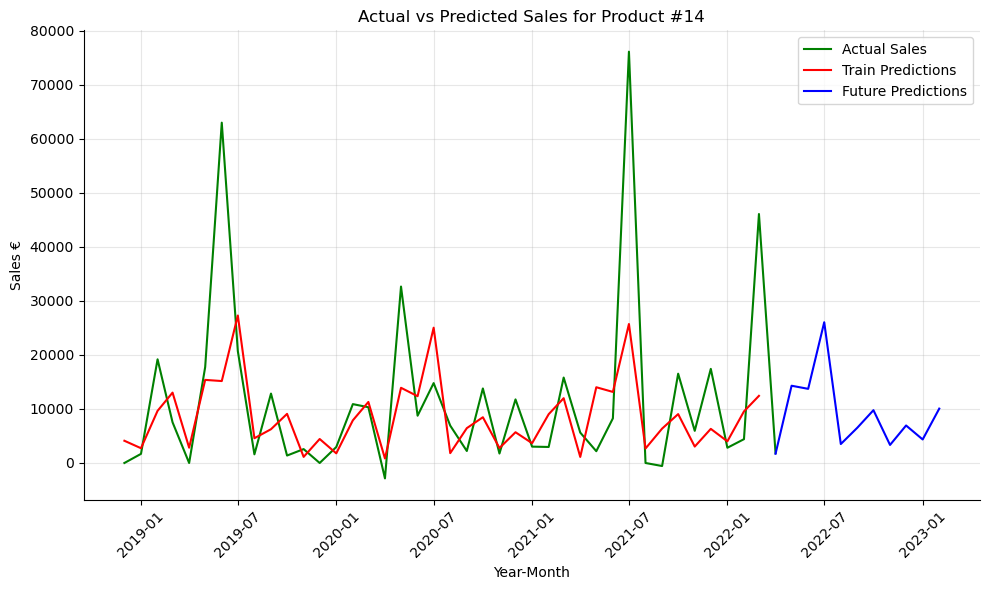

In [270]:
future = model_ph14.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph14.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [271]:
# Compute RMSE
forecast = model_ph14.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 13441.63


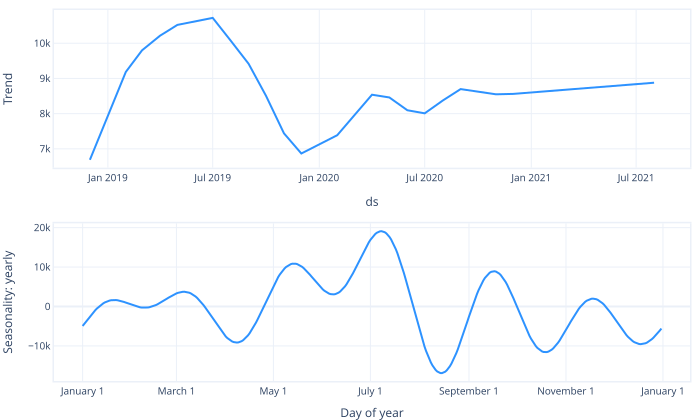

In [272]:
model_ph14.plot_parameters(components=["trend", "seasonality"])

In [273]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-12-01,0.000000,4116.467773,6688.692383,-2572.224365
1,2019-01-01,1686.400024,2735.257080,7937.434570,-5202.177246
2,2019-02-01,19196.300781,9656.322266,9186.175781,470.147034
3,2019-03-01,7535.250000,13030.458984,9798.875977,3231.583984
4,2019-04-01,0.000000,2831.319580,10214.209961,-7382.891113
5,2019-05-01,17771.400391,15386.538086,10521.654297,4864.884766
6,2019-06-01,63017.710938,15172.426758,10622.931641,4549.495117
7,2019-07-01,20719.300781,27313.380859,10720.941406,16592.439453
8,2019-08-01,1602.000000,4583.246094,10074.527344,-5491.281738
9,2019-09-01,12851.200195,6253.478516,9415.630859,-3162.151367


**ARIMA**

In [274]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   41
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -451.410
Date:                Wed, 10 Apr 2024   AIC                            922.820
Time:                        20:56:17   BIC                            939.955
Sample:                             0   HQIC                           929.059
                                 - 41                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.149e+04   2136.926      5.375      0.000    7297.601    1.57e+04
ar.L1          0.2650      1.870      0.142      0.887      -3.400       3.930
ar.L2         -0.5187      1.678  

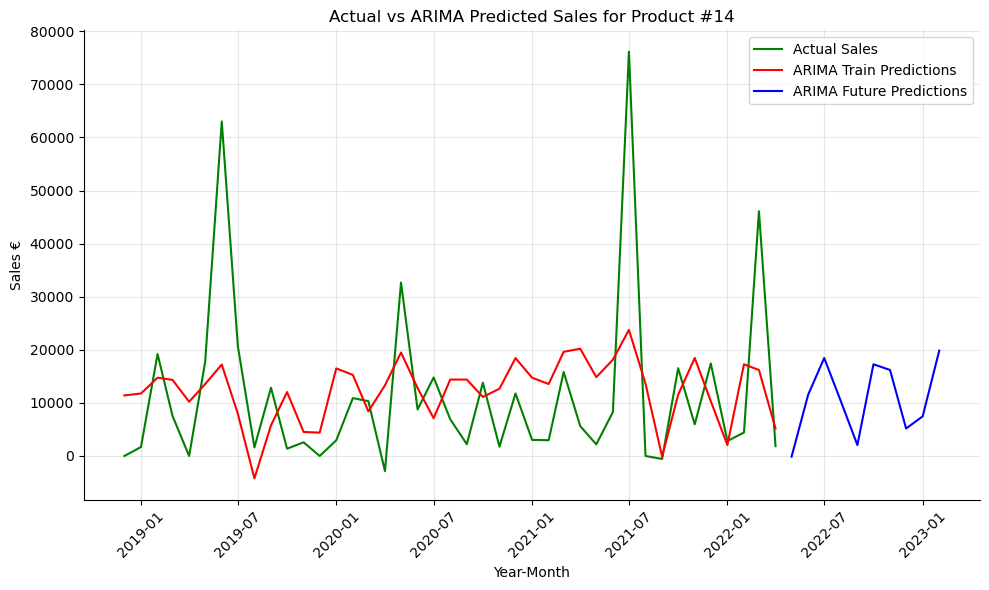

Train RMSE: 15232.694292280907
Validation RMSE: 12761.559982784602


In [275]:
# Fit ARIMA model
arima_model14 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model14.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #14')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [276]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Error fitting SARIMA model with parameters p=1, d=1, q=2, P=1, D=1, Q=2: LU decomposition error.
Best SARIMA Model:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   41
Model:             SARIMAX(2, 1, 2)x(1, 1, [], 12)   Log Likelihood                -310.267
Date:                             Wed, 10 Apr 2024   AIC                            632.534
Time:                                     20:58:14   BIC                            640.527
Sample:                                          0   HQIC                           634.977
                                              - 41                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------

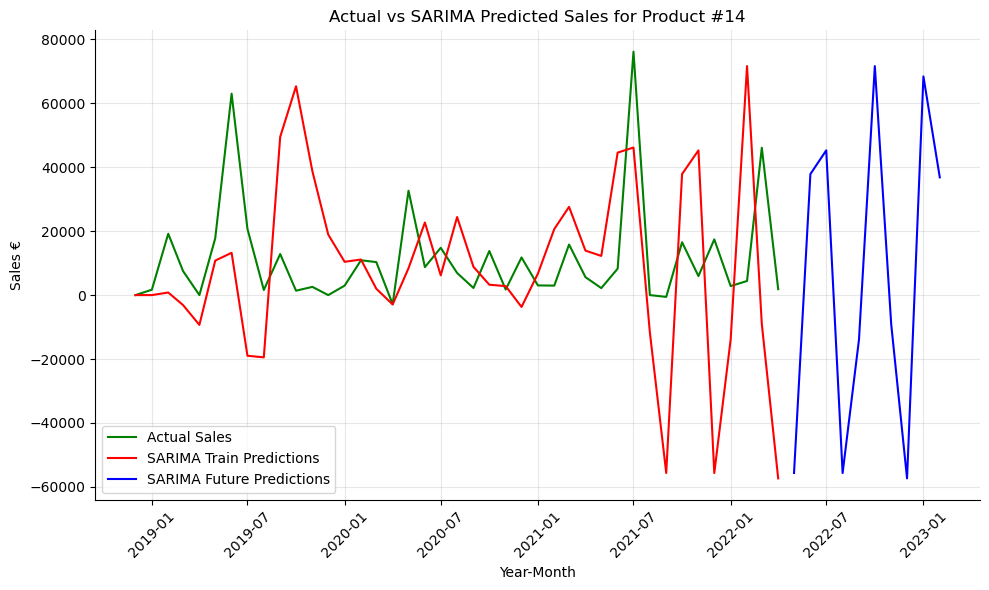

Train RMSE: 22604.758707928475
Validation RMSE: 52119.37629122639


In [277]:
# Fit SARIMA model
sarima_model14 = SARIMAX(df_train['y'], order=(2, 1, 2), seasonal_order=(1, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model14.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #14'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 13441.63 |  
| ARIMA    | 12761.56    | 
| SARIMA    | 52119.37   |

In [278]:
predicted_values_14 = arima_forecast.to_list()
predicted_table_14 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="2_12">
    
##    2.12 Product #16
    
</a>

In [279]:
p16 = pd.read_csv("sales_p16.csv")
p16.head()

,Full_Date,Switzerland Production Index M&E LAG9,Price of Energy LAG11,US Production Index M&E LAG4,Germany Production Index Electrical eq. LAG11,Sales €,Switzerland Production Index Machinery eq. LAG10,Japan Production Index Electrical eq. LAG5,Italy Production Index M&E LAG7,France Producer Prices Electrical eq. LAG10,France Production Index Electrical eq. LAG1,Europe Shipments Index M&E LAG3,China Producer Prices Electrical eq. LAG12,US Producer Prices Electrical eq. LAG11,Global Production Index Electrical eq. LAG6
0,2018-10-01,112.30,73.25,110.00,106.94,3.331969e+05,106.00,108.30,103.25,101.40,64.30,136.50,97.25,105.60,128.10
1,2018-11-01,107.80,78.94,112.70,121.50,1.377694e+06,109.30,107.06,116.10,101.40,85.06,120.44,97.40,106.00,117.70
2,2018-12-01,103.30,80.80,106.56,98.60,4.762524e+06,105.40,118.75,101.25,102.25,97.90,112.30,96.60,106.10,119.00
3,2019-01-01,98.80,87.44,110.80,110.40,9.429572e+05,101.44,116.50,118.25,102.25,91.10,127.70,96.44,106.44,126.30
4,2019-02-01,98.44,82.10,111.00,107.25,2.577650e+05,97.50,103.00,115.25,102.40,78.06,131.00,96.70,106.75,121.94


In [280]:
X = p16.drop(columns=['Sales €', 'Full_Date'])
y = p16['Sales €']

# 'Full_Date' column to datetime
p16['Full_Date'] = pd.to_datetime(p16['Full_Date'])

**LINEAR REGRESSION**

In [281]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [604939.47883371 620753.27467713 600191.54715307 279725.23138545
 598241.85805272]
Validation scores: [ 753190.03259319  637732.49175119  819392.83119582 1454622.14828343
  860650.97075083]

Average Train RMSE: 540770.28
Average Validation RMSE: 905117.69


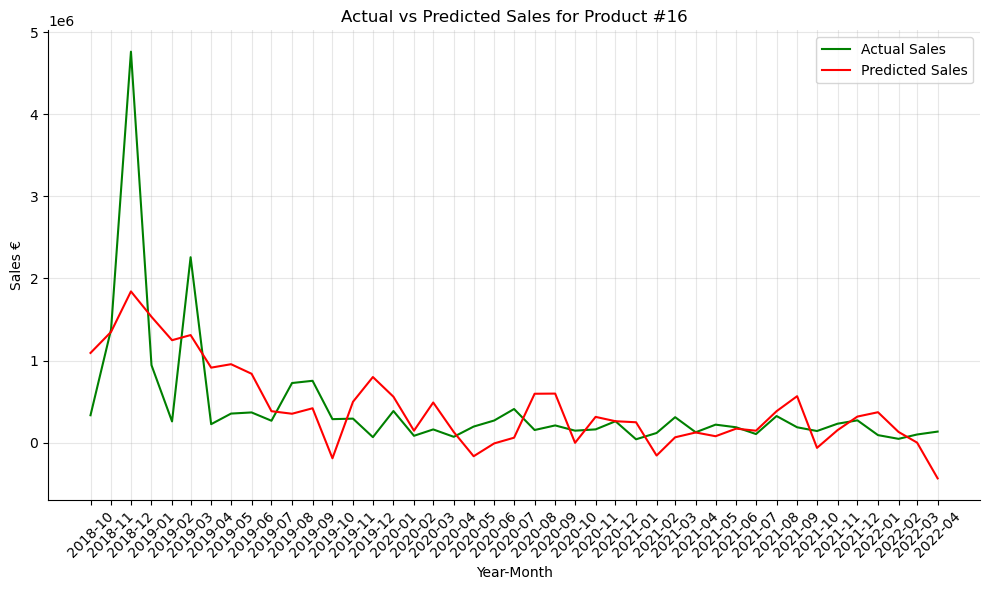

In [282]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p16['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p16['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p16['Full_Date'], p16['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [283]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.3s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [284]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [0.12941182 0.12021219 0.09845036 0.06337625 0.1008928 ]
Validation scores: [ 290868.02374096  187428.67071855  722375.97585915 1552553.23562387
  159943.30507382]

Average Train RMSE: 0.1
Average Validation RMSE: 582633.84


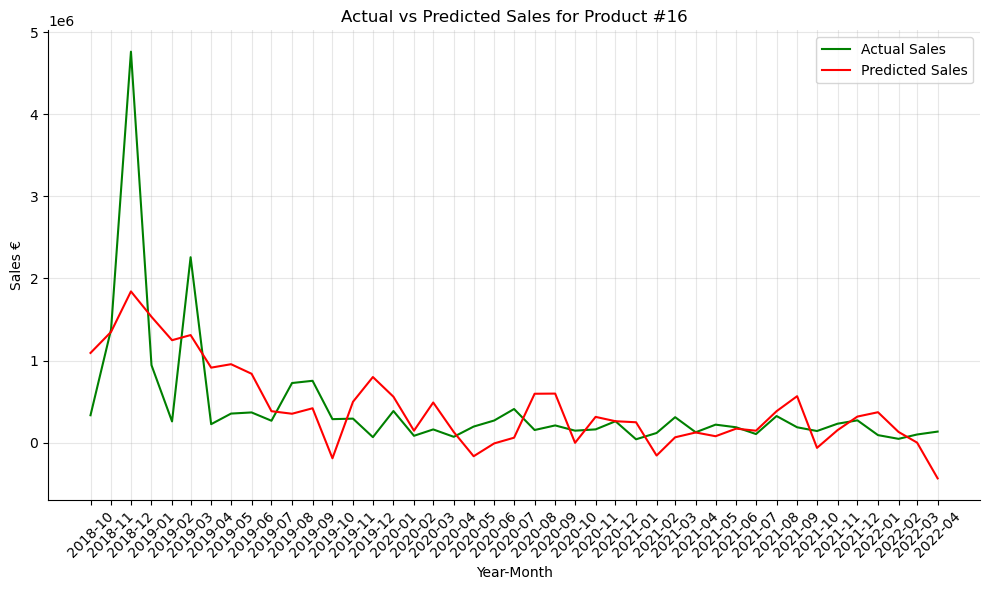

In [285]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p16['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p16['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p16['Full_Date'], p16['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [286]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   2.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   1.9s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 300}


In [287]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [632423.51229886 651400.54920325 622045.61535239 286195.82092403
 636923.19342351]
Validation scores: [ 461708.88250765  344353.94899913  541079.22982025 1483586.02367872
  175358.7885025 ]

Average Train RMSE: 565797.74
Average Validation RMSE: 601217.37


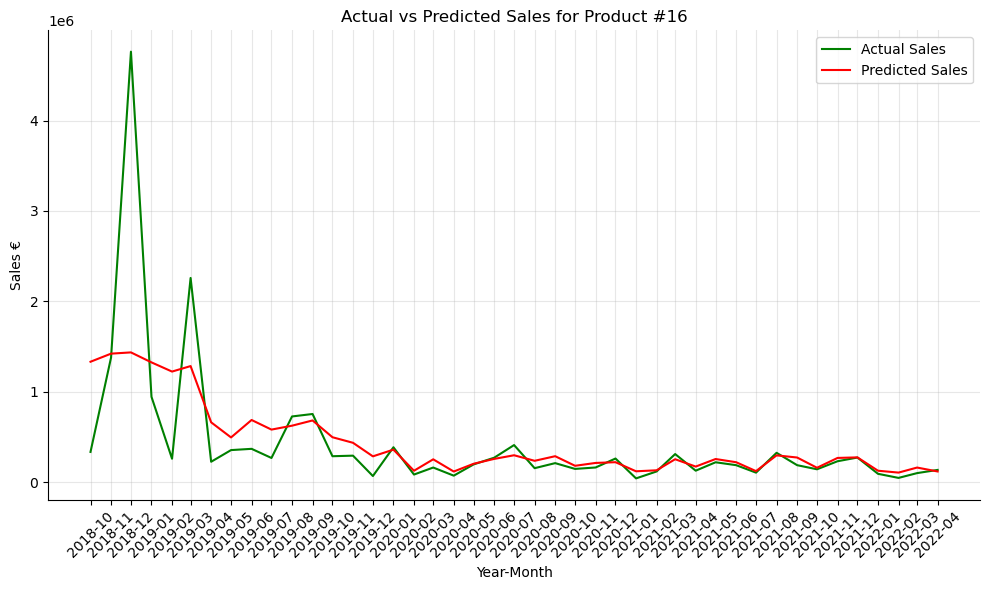

In [288]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p16['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p16['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p16['Full_Date'], p16['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [289]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[C

In [290]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [598002.80988376 639772.64871572 426302.44925374 282519.80872155
 644583.13059233]
Validation scores: [ 573229.55329014  611690.46908664 1089833.94762214 1358958.47005132
  182987.30270765]

Average Train RMSE: 518236.17
Average Validation RMSE: 763339.95


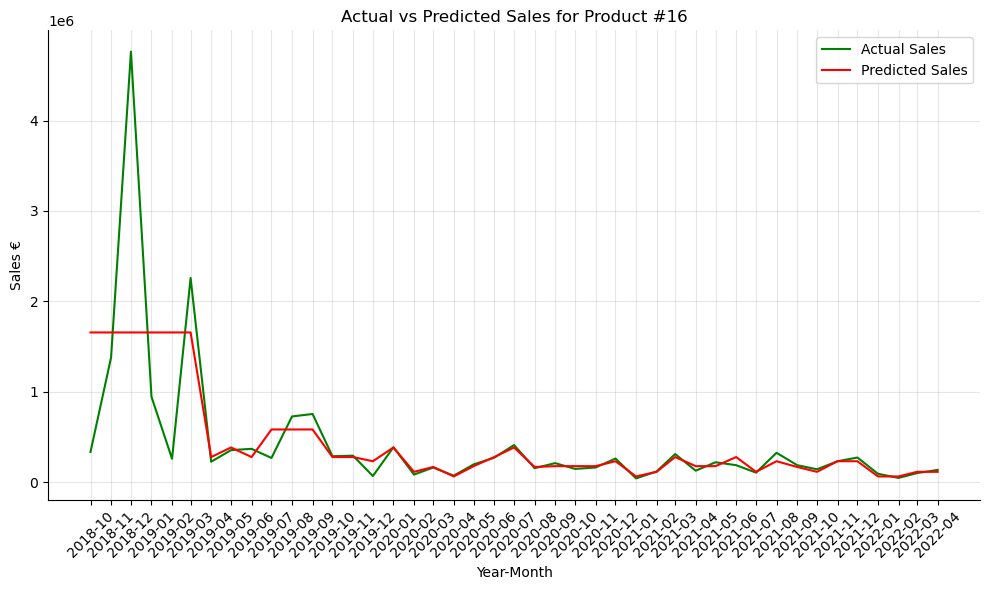

In [291]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p16['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p16['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p16['Full_Date'], p16['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [292]:
df = pd.DataFrame({
    'ds': p16['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph16 = NeuralProphet()
model_ph16.set_plotting_backend("plotly-static")

In [293]:
df_train, df_val = model_ph16.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 43
Train dataset size: 35
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,597422.187500,705142.62500,0.242899,0.0,0,850552.312500,1.147494e+06,0.255806,0.0
1,589063.625000,692695.81250,0.238539,0.0,1,834865.937500,1.138473e+06,0.255203,0.0
2,572748.437500,671464.62500,0.229149,0.0,2,825324.625000,1.082602e+06,0.252149,0.0
3,559469.875000,656239.18750,0.222672,0.0,3,793908.937500,1.117093e+06,0.223738,0.0
4,558393.062500,645547.56250,0.218916,0.0,4,706885.312500,9.161891e+05,0.195989,0.0
...,...,...,...,...,...,...,...,...,...
375,245022.125000,290509.68750,0.053732,0.0,375,289176.250000,5.043307e+05,0.056981,0.0
376,245174.968750,290923.37500,0.053851,0.0,376,390525.000000,5.993902e+05,0.088972,0.0
377,245618.687500,291457.78125,0.054026,0.0,377,250262.921875,4.433213e+05,0.045687,0.0
378,245698.515625,291509.00000,0.054042,0.0,378,257169.296875,4.165421e+05,0.046025,0.0


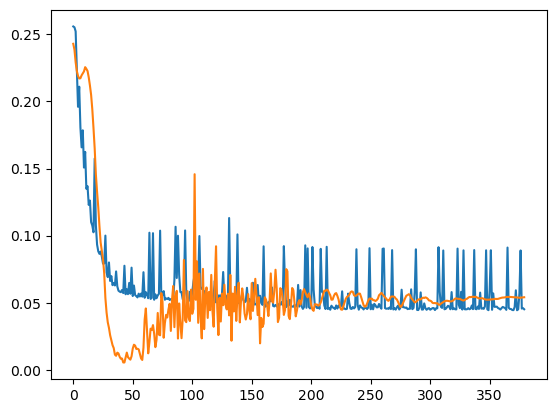

In [294]:
nprof_metrics = model_ph16.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

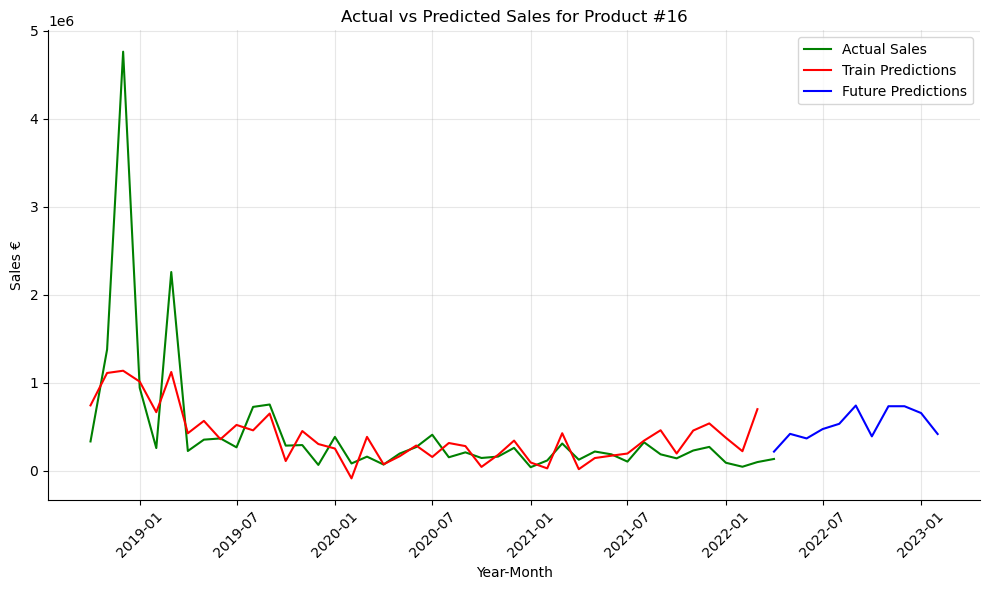

In [295]:
future = model_ph16.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph16.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [296]:
# Compute RMSE
forecast = model_ph16.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 612545.37


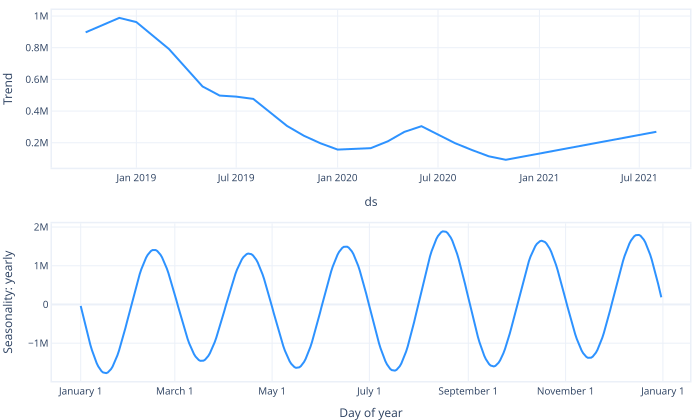

In [297]:
model_ph16.plot_parameters(components=["trend", "seasonality"])

In [298]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-10-01,3.331969e+05,7.428436e+05,897110.875000,-154267.250000
1,2018-11-01,1.377694e+06,1.111240e+06,943458.312500,167782.000000
2,2018-12-01,4.762524e+06,1.136768e+06,988310.625000,148457.796875
3,2019-01-01,9.429572e+05,1.013023e+06,961670.312500,51352.652344
4,2019-02-01,2.577650e+05,6.656246e+05,872752.375000,-207127.812500
5,2019-03-01,2.258352e+06,1.122223e+06,791979.375000,330243.812500
6,2019-04-01,2.245019e+05,4.262120e+05,671682.812500,-245470.859375
7,2019-05-01,3.534515e+05,5.668272e+05,555266.875000,11560.326172
8,2019-06-01,3.674254e+05,3.584902e+05,497835.375000,-139345.125000
9,2019-07-01,2.662259e+05,5.207946e+05,491183.750000,29610.812500


**ARIMA**

In [299]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   43
Model:                 ARIMA(2, 0, 3)   Log Likelihood                -898.298
Date:                Wed, 10 Apr 2024   AIC                           1810.596
Time:                        21:03:48   BIC                           1822.924
Sample:                             0   HQIC                          1815.142
                                 - 43                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.277e+05   2.05e+04     20.900      0.000    3.88e+05    4.68e+05
ar.L1          0.1390      0.040      3.458      0.001       0.060       0.218
ar.L2         -0.0603      0.015  

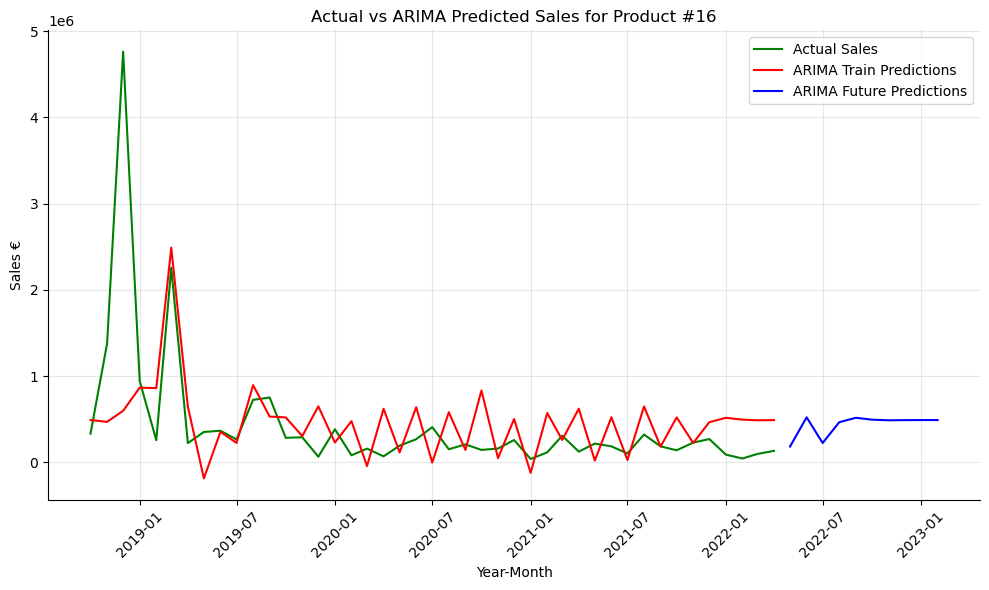

Train RMSE: 790579.1695478141
Validation RMSE: 325611.3207798222


In [300]:
# Fit ARIMA model
arima_model16 = ARIMA(df_train['y'], order=(2,0,3))
arima_fit = arima_model16.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #16')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [301]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Error fitting SARIMA model with parameters p=0, d=1, q=0, P=1, D=0, Q=1: LU decomposition error.
Error fitting SARIMA model with parameters p=0, d=1, q=0, P=2, D=0, Q=0: LU decomposition error.
Error fitting SARIMA model with parameters p=0, d=1, q=0, P=2, D=0, Q=1: LU decomposition error.
Error fitting SARIMA model with parameters p=1, d=1, q=1, P=2, D=0, Q=1: LU decomposition error.
Error fitting SARIMA model with parameters p=2, d=1, q=2, P=2, D=0, Q=2: LU decomposition error.
Best SARIMA Model:
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   43
Model:             SARIMAX(0, 1, 0)x(1, 0, 0, 12)   Log Likelihood                   0.000
Date:                            Wed, 10 Apr 2024   AIC                              4.000
Time:                                    21:06:28   BIC                              7.475
Sample:                                  

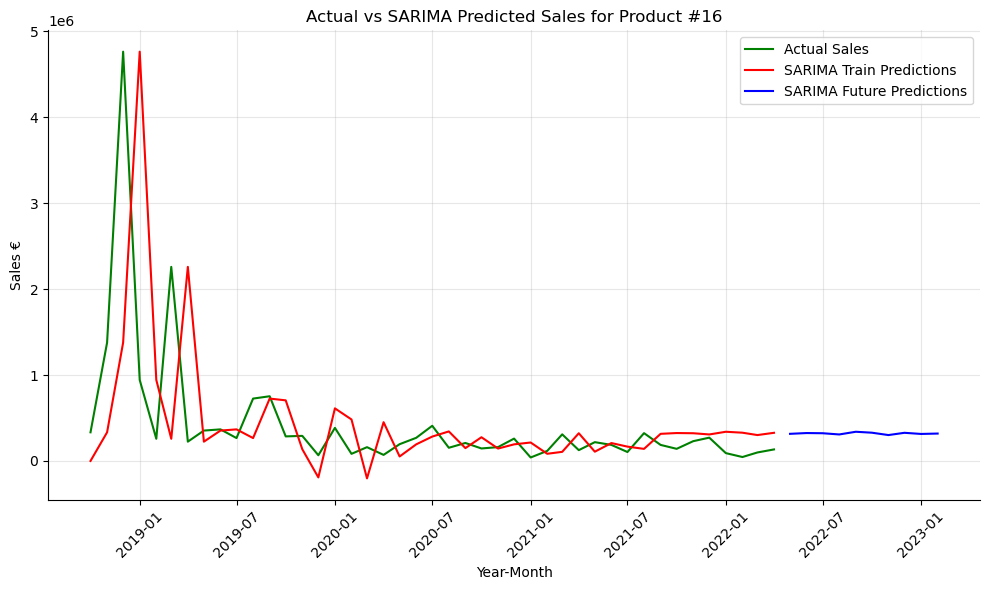

Train RMSE: 1029781.995840097
Validation RMSE: 187291.23419476722


In [302]:
# Fit SARIMA model
sarima_model16 = SARIMAX(df_train['y'], order=(0, 1, 0), seasonal_order=(1, 0, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model16.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #16'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 612545.37 |  
| ARIMA    | 325611.32    | 
| SARIMA    | 187291.23   |

In [303]:
predicted_values_16 = sarima_forecast.predicted_mean.to_list()
predicted_table_16 = pd.DataFrame({'date': sarima_future_dates, 'y_hat': sarima_forecast.predicted_mean.to_list()})

<hr>

<a class="anchor" id="2_13">
    
##    2.13 Product #20
    
</a>

In [304]:
p20 = pd.read_csv("sales_p20.csv")
p20.head()

,Full_Date,Switzerland Production Index Electrical eq. LAG1,US Production Index M&E LAG2,Germany Production Index M&E LAG1,Europe Shipments Index M&E LAG1,France Production Index Electrical eq. LAG2,Price of Natural gas index LAG12,Germany Shipments Index M&E LAG1,Japan Production Index M&E LAG1,France Shipments Index M&E LAG7,Sales € LAG4,UK Production Index Electrical eq. LAG3,Sales €,Europe Production Index M&E LAG1,United States: EUR in LCU LAG1,US Producer Prices Electrical eq. LAG11
0,2019-02-01,116.50,110.90,120.50,131.20,91.10,84.80,141.4,123.00,127.10,4563.140137,118.70,620.659973,113.90,1.139,106.75
1,2019-03-01,110.40,106.25,104.75,113.06,78.06,71.00,118.7,105.50,104.75,5798.140137,120.44,3369.550049,106.44,1.142,107.56
2,2019-04-01,104.20,107.50,109.60,117.70,81.94,71.44,122.7,114.44,92.80,918.650024,105.40,3619.629883,110.44,1.135,108.00
3,2019-05-01,98.06,109.80,122.56,135.90,80.30,73.50,140.1,141.60,110.50,2398.040039,107.20,938.900024,123.70,1.130,108.56
4,2019-06-01,95.56,111.70,110.60,121.94,92.50,76.50,127.5,107.10,122.44,620.659973,110.60,772.940002,111.94,1.124,108.75


In [305]:
X = p20.drop(columns=['Sales €', 'Full_Date'])
y = p20['Sales €']

# 'Full_Date' column to datetime
p20['Full_Date'] = pd.to_datetime(p20['Full_Date'])

**LINEAR REGRESSION**

In [306]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1358.07766028 1328.64998371 1095.53796428 1258.40159197  855.55849892]
Validation scores: [1512.05106542 2221.45825484 3650.37187262 1928.83408049 3183.81456814]

Average Train RMSE: 1179.25
Average Validation RMSE: 2499.31


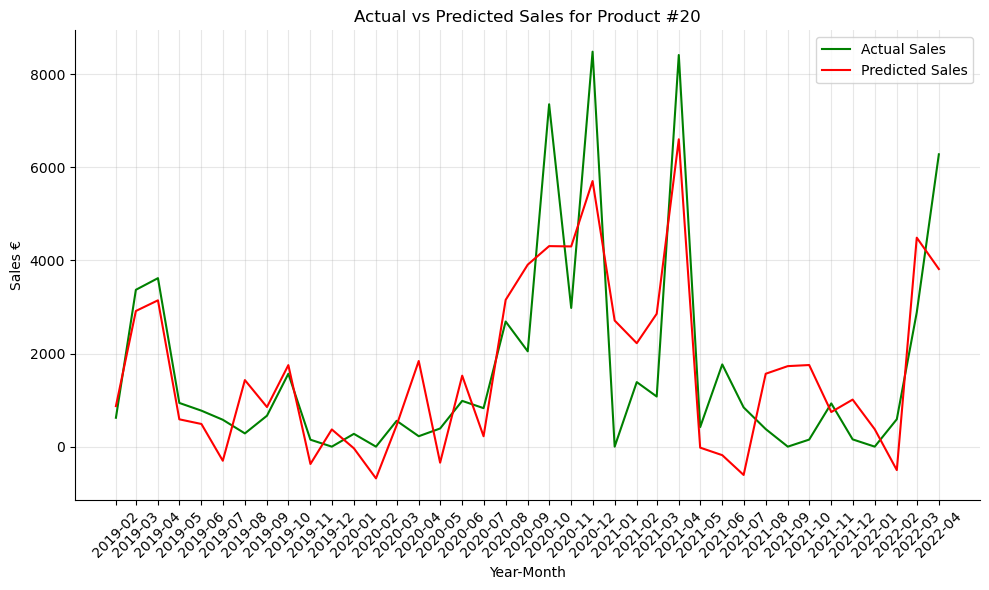

In [307]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p20['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p20['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p20['Full_Date'], p20['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [308]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.4s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.2s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.

In [309]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1116.18581633 1201.94640493 1193.76631339 1129.80392644  906.73580182]
Validation scores: [2569.37642252 1184.8694013  1282.99649356 1458.23085315 4126.45142853]

Average Train RMSE: 1109.69
Average Validation RMSE: 2124.38


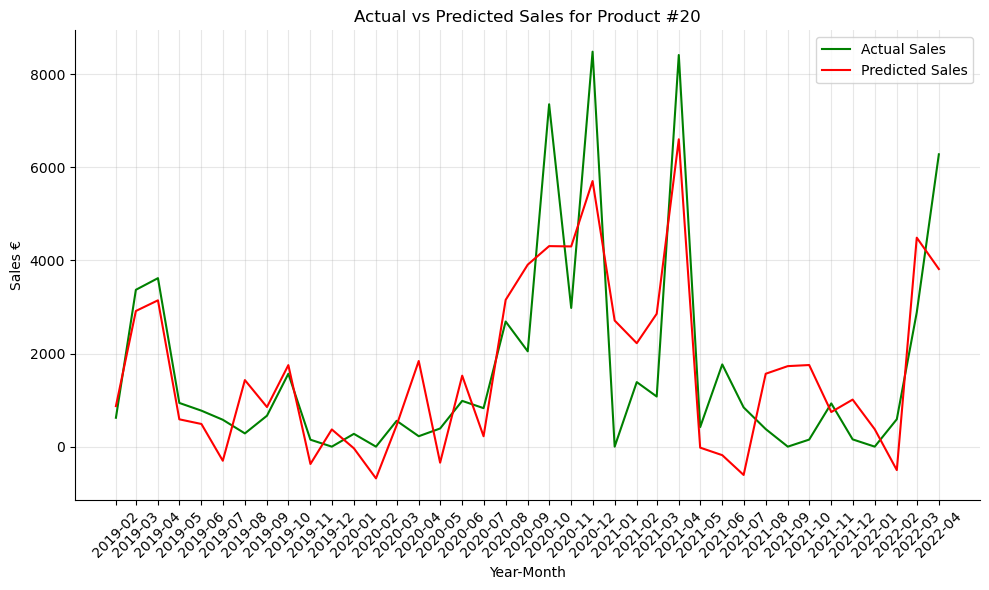

In [310]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p20['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p20['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p20['Full_Date'], p20['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [311]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 300}


In [312]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1446.04772361 1578.7062157  1638.15694765 1494.11275008 1133.86439641]
Validation scores: [1989.48526456 1045.17741106  987.83543049 2242.75218546 3602.7450162 ]

Average Train RMSE: 1458.18
Average Validation RMSE: 1973.6


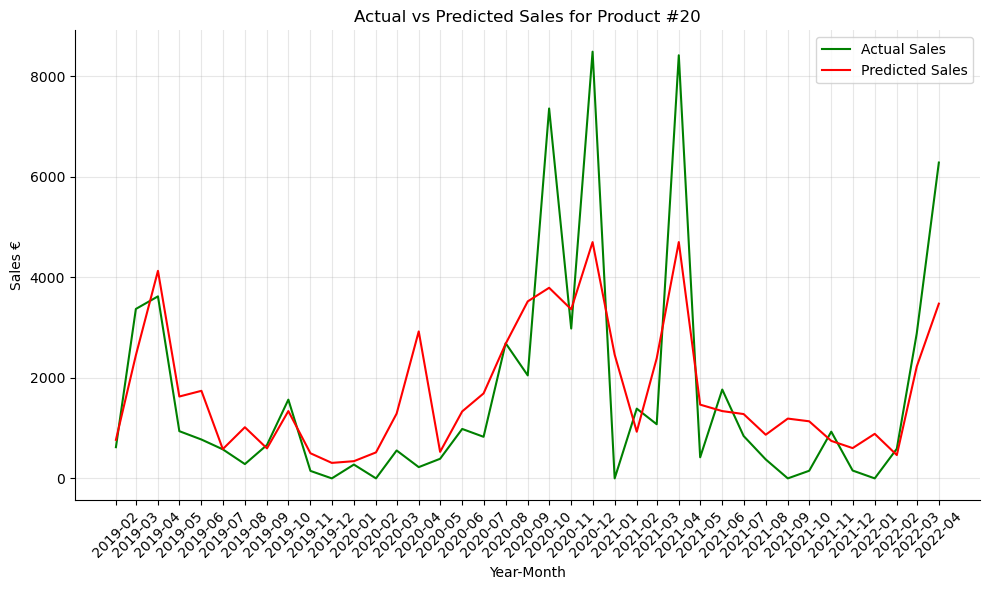

In [313]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p20['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p20['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p20['Full_Date'], p20['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [314]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2; total time=   0.0s

In [315]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [1407.57867265 1074.51037504 1942.57442457 1260.6410604  1210.62479925]
Validation scores: [2683.03161557 1715.80805579 1381.62445725 2463.60412118 3435.05899373]

Average Train RMSE: 1379.19
Average Validation RMSE: 2335.83


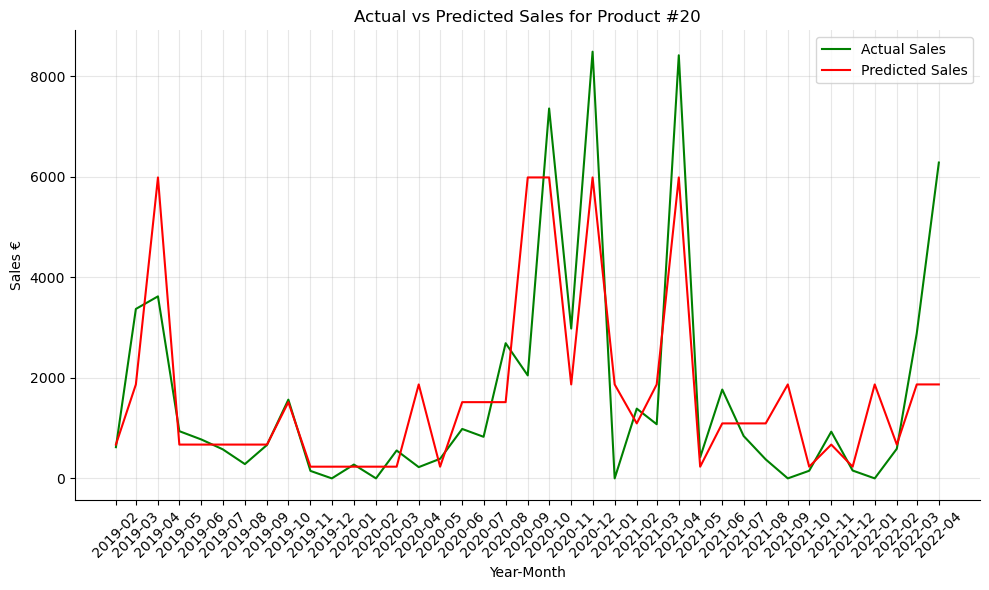

In [316]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p20['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p20['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p20['Full_Date'], p20['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [317]:
df = pd.DataFrame({
    'ds': p20['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph20 = NeuralProphet()
model_ph20.set_plotting_backend("plotly-static")

In [318]:
df_train, df_val = model_ph20.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 39
Train dataset size: 32
Validation dataset size: 7


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,1991.739380,2555.838867,0.141301,0.0,0,3563.697510,4019.361572,0.243318,0.0
1,2019.468018,2597.946777,0.146002,0.0,1,3438.956543,3857.900879,0.231489,0.0
2,2056.640381,2672.887939,0.153746,0.0,2,3341.576172,3778.116699,0.222822,0.0
3,2095.456787,2758.156006,0.163182,0.0,3,3244.073242,3699.952637,0.214209,0.0
4,2180.579346,2814.281982,0.169847,0.0,4,3154.676758,3565.132812,0.205703,0.0
...,...,...,...,...,...,...,...,...,...
395,2720.731201,2883.113281,0.204405,0.0,395,820.871460,1151.506836,0.026700,0.0
396,2719.658447,2881.920410,0.204277,0.0,396,820.959290,1169.969116,0.026700,0.0
397,2719.183350,2881.495850,0.204231,0.0,397,820.911377,1113.697632,0.026692,0.0
398,2719.696533,2882.020752,0.204288,0.0,398,820.984375,1135.667236,0.026697,0.0


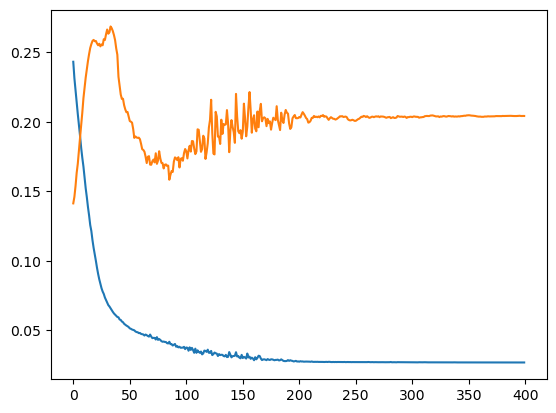

In [319]:
nprof_metrics = model_ph20.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 4it [00:00, ?it/s]

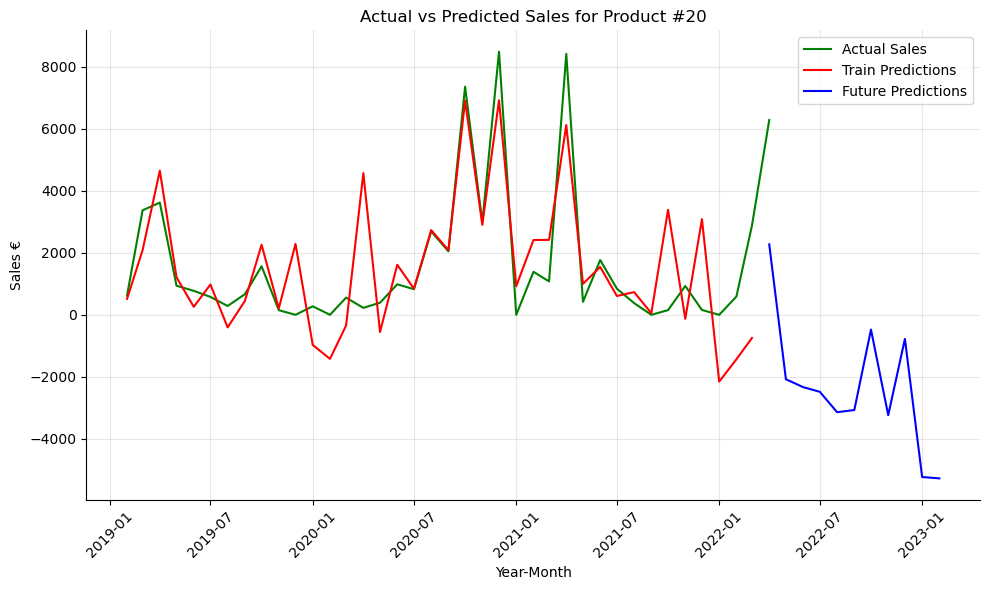

In [320]:
future = model_ph20.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph20.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [321]:
# Compute RMSE
forecast = model_ph20.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 4it [00:00, ?it/s]

RMSE: 1635.89


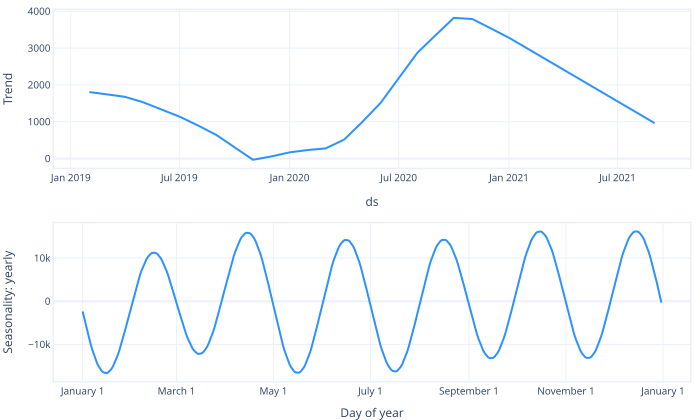

In [322]:
model_ph20.plot_parameters(components=["trend", "seasonality"])

In [323]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2019-02-01,620.659973,511.479553,1806.911621,-1295.432007
1,2019-03-01,3369.550049,2084.778320,1746.198242,338.580139
2,2019-04-01,3619.629883,4648.260254,1678.979858,2969.280518
3,2019-05-01,938.900024,1209.377075,1534.176758,-324.799713
4,2019-06-01,772.940002,258.708771,1345.873047,-1087.164307
5,2019-07-01,577.599976,976.858582,1141.944336,-165.085709
6,2019-08-01,284.399994,-406.342651,901.236389,-1307.579102
7,2019-09-01,664.570007,449.918671,640.133057,-190.214401
8,2019-10-01,1566.000000,2261.397949,309.362396,1952.035645
9,2019-11-01,149.000000,205.464935,-32.433464,237.898392


**ARIMA**

In [324]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   39
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -348.078
Date:                Wed, 10 Apr 2024   AIC                            716.156
Time:                        21:12:29   BIC                            732.791
Sample:                             0   HQIC                           722.124
                                 - 39                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1677.8127    677.338      2.477      0.013     350.255    3005.370
ar.L1          0.5181      0.657      0.789      0.430      -0.770       1.806
ar.L2          1.1472      0.614  

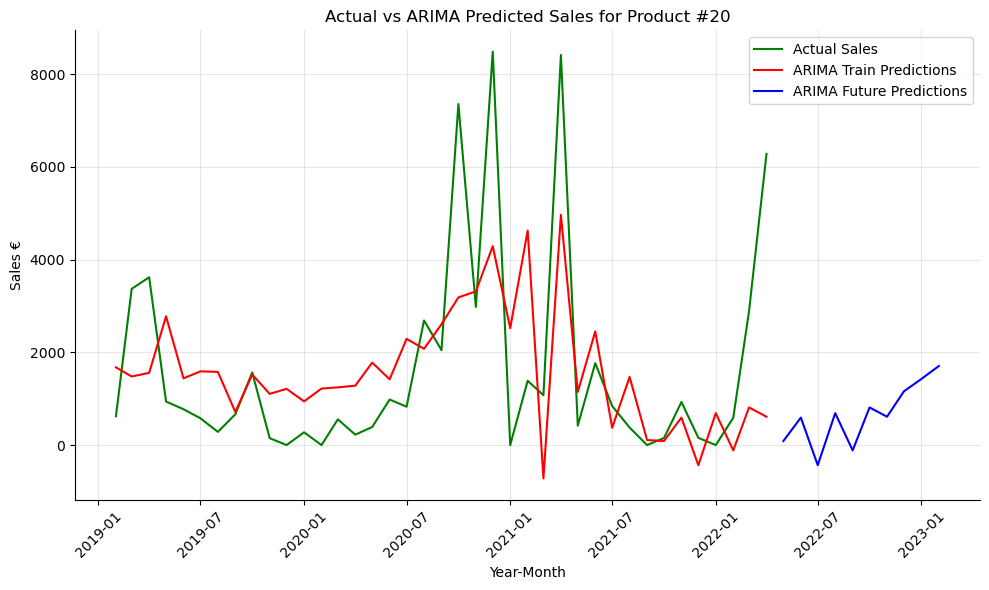

Train RMSE: 1730.4388939658413
Validation RMSE: 2326.1482863780343


In [325]:
# Fit ARIMA model
arima_model20 = ARIMA(df_train['y'], order=(4,0,4))
arima_fit = arima_model20.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #20')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [326]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Error fitting SARIMA model with parameters p=0, d=1, q=0, P=2, D=1, Q=1: LU decomposition error.
Best SARIMA Model:
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                   39
Model:             SARIMAX(0, 1, 2)x(2, 1, [1], 12)   Log Likelihood                 -19.782
Date:                              Wed, 10 Apr 2024   AIC                             51.563
Time:                                      21:17:37   BIC                             59.112
Sample:                                           0   HQIC                            53.737
                                               - 39                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------

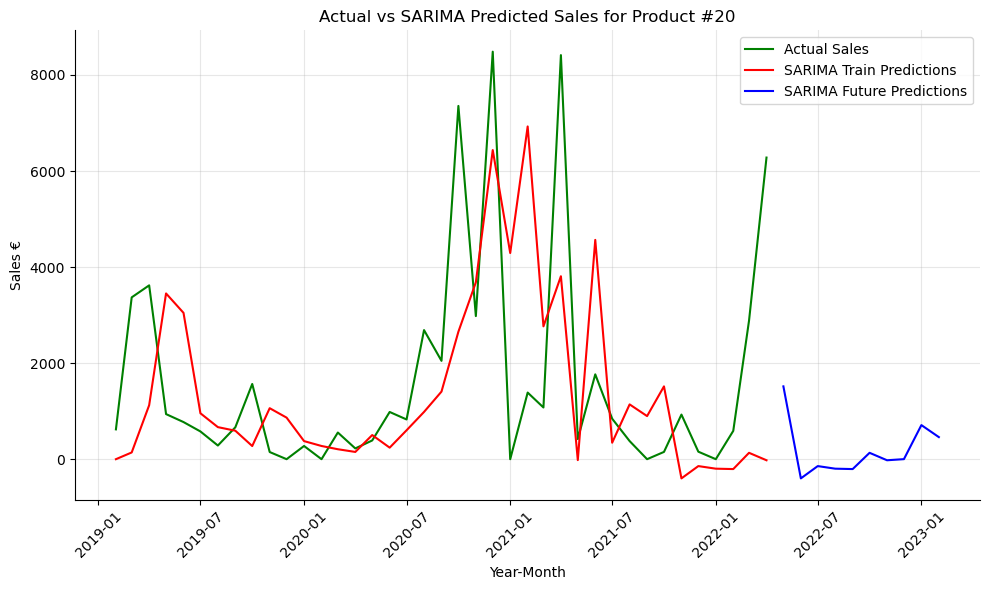

Train RMSE: 2135.0901697596646
Validation RMSE: 2717.5013338205144


In [327]:
# Fit SARIMA model
sarima_model20 = SARIMAX(df_train['y'], order=(1, 1, 0), seasonal_order=(1, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model20.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product #20'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 1635.89 |  
| ARIMA    | 2326.14    | 
| SARIMA    | 2717.5   |

* Neural Prophet all negative values, so its a hardly a good choice

In [328]:
predicted_values_20 = arima_forecast.to_list()
predicted_table_20 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="2_14">
    
##    2.14 Product #36
    
</a>

In [329]:
p36 = pd.read_csv("sales_p36.csv")
p36.head()

,Full_Date,UK Production Index M&E LAG3,France Production Index M&E LAG3,US Production Index Electrical eq. LAG11,Italy Production Index M&E LAG1,Germany Production Index Electrical eq. LAG11,US Shipments Index M&E LAG4,Sales €,Japan Production Index Electrical eq. LAG3,Europe Shipments Index M&E LAG5,Italy Shipments Index M&E LAG8,Price of Energy LAG5
0,2018-10-01,111.10,109.75,110.00,60.75,106.94,126.25,6474.600098,118.75,116.94,86.44,88.4
1,2018-11-01,106.06,100.80,109.60,105.44,121.50,133.80,21617.609375,116.50,122.10,100.50,94.6
2,2018-12-01,103.70,68.25,105.75,118.40,98.60,117.75,13924.519531,103.00,136.50,120.25,93.7
3,2019-01-01,108.30,97.60,106.80,107.75,110.40,128.20,15444.389648,114.50,120.44,102.90,93.0
4,2019-02-01,113.70,108.25,107.94,88.80,107.25,126.00,8051.149902,112.40,112.30,120.60,92.0


In [330]:
X = p36.drop(columns=['Sales €', 'Full_Date'])
y = p36['Sales €']

# 'Full_Date' column to datetime
p36['Full_Date'] = pd.to_datetime(p36['Full_Date'])

**LINEAR REGRESSION**

In [331]:
# Create a linear regression model
linear_model = LinearRegression()

# Define the number of folds (5)
num_folds = 5

# Define K-fold cross-validation
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
linear_scores = cross_validate(linear_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -linear_scores['train_score']
validation_scores = -linear_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [32953.41150297 31811.17233052 17371.01747352 29434.5234516
 31047.30552416]
Validation scores: [24428.01607712 30842.47038506 71493.20607598 44988.85363954
 35801.45756179]

Average Train RMSE: 28523.49
Average Validation RMSE: 41510.8


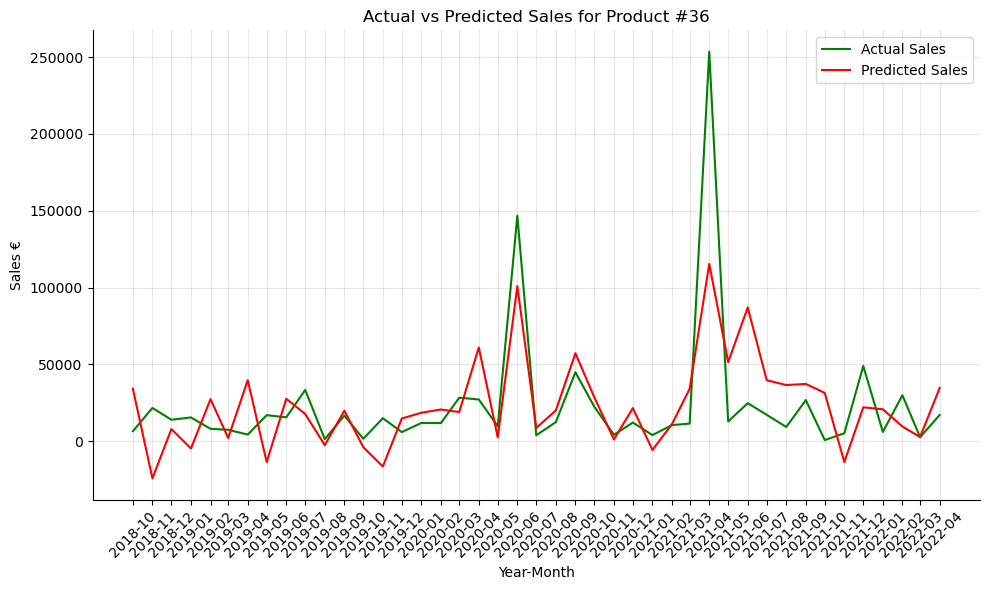

In [332]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p36['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p36['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p36['Full_Date'], p36['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**XGBOOST**

In [333]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'max_depth': [3, 4, 5],  # Maximum depth of each tree
    'learning_rate': [0.01, 0.1, 0.3]  # Learning rate
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=300; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_e

[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=3, n_estimators=300; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=100; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.0s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.1s
[CV] END ...learning_rate=0.3, max_depth=4, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.

In [334]:
# Define XGBoost regressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_, random_state=42)

# Perform K-fold cross-validation
xgb_scores = cross_validate(xgb_reg, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -xgb_scores['train_score']
validation_scores = -xgb_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [28030.42487433 28520.3532994  15130.9188522  28293.39445483
 24902.2304484 ]
Validation scores: [28800.34559444 35343.4311115  80535.63638352 11212.92884134
 46624.3800367 ]

Average Train RMSE: 24975.46
Average Validation RMSE: 40503.34


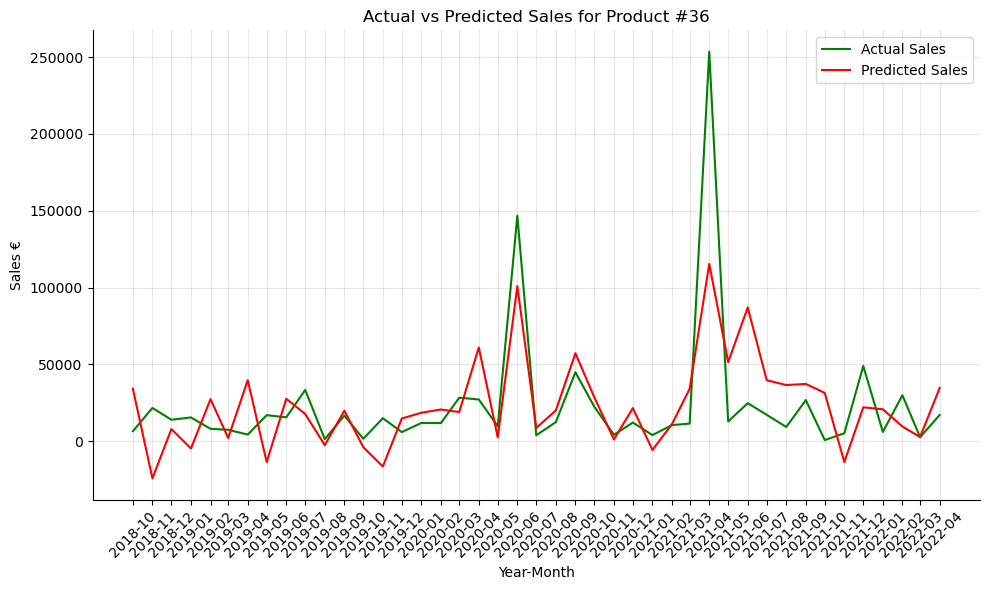

In [335]:
# Fit the model
linear_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = linear_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p36['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p36['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p36['Full_Date'], p36['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**RANDOM FOREST**

In [336]:
# Define Random Forest regressor
rf_reg = RandomForestRegressor(random_state=42)

# Define grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END ma

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; tota

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total tim

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total tim

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


In [337]:
rf_model = RandomForestRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
rf_scores = cross_validate(rf_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold,  return_train_score=True)

# Extract train and validation scores
train_scores = -rf_scores['train_score']
validation_scores = -rf_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [35790.43508635 37098.52196708 19224.75371106 35864.02032143
 34532.13480943]
Validation scores: [25776.35153518 15759.99537344 78602.2542211  27902.74268012
 37786.67755823]

Average Train RMSE: 32501.97
Average Validation RMSE: 37165.6


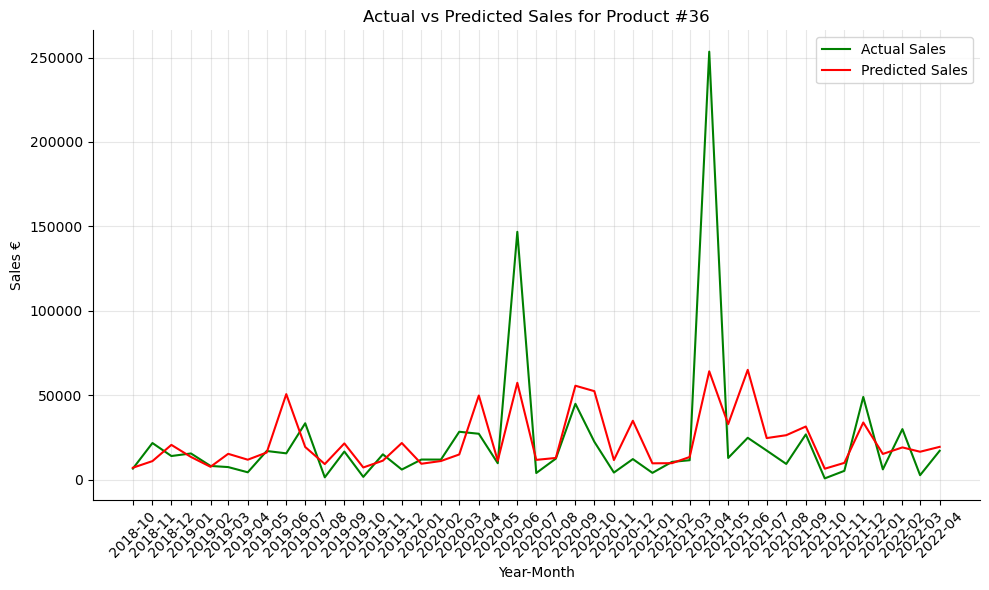

In [338]:
# Fit the model
rf_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = rf_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p36['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p36['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p36['Full_Date'], p36['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**DECISION TREE**

In [339]:
dt_reg = DecisionTreeRegressor(random_state = 42)

# Define grid of hyperparameters to search
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at each leaf node
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X, y)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[C

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[C

In [340]:
dt_model = DecisionTreeRegressor(**grid_search.best_params_, random_state = 42)

# Perform K-fold cross-validation
dt_scores = cross_validate(dt_model, X, y, scoring='neg_root_mean_squared_error', cv=kfold, return_train_score=True)

# Extract train and validation scores
train_scores = -dt_scores['train_score']
validation_scores = -dt_scores['test_score']

# Print the train and validation scores
print("Train scores:", train_scores)
print("Validation scores:", validation_scores)
print("\nAverage Train RMSE:", round(np.mean(train_scores),2))
print("Average Validation RMSE:", round(np.mean(validation_scores),2))

Train scores: [25969.37771224 31638.94968369 13317.43654941 14209.74211404
 28915.68522611]
Validation scores: [42816.9739556  42386.37159558 83453.27296674 63247.07088673
 47358.98325302]

Average Train RMSE: 22810.24
Average Validation RMSE: 55852.53


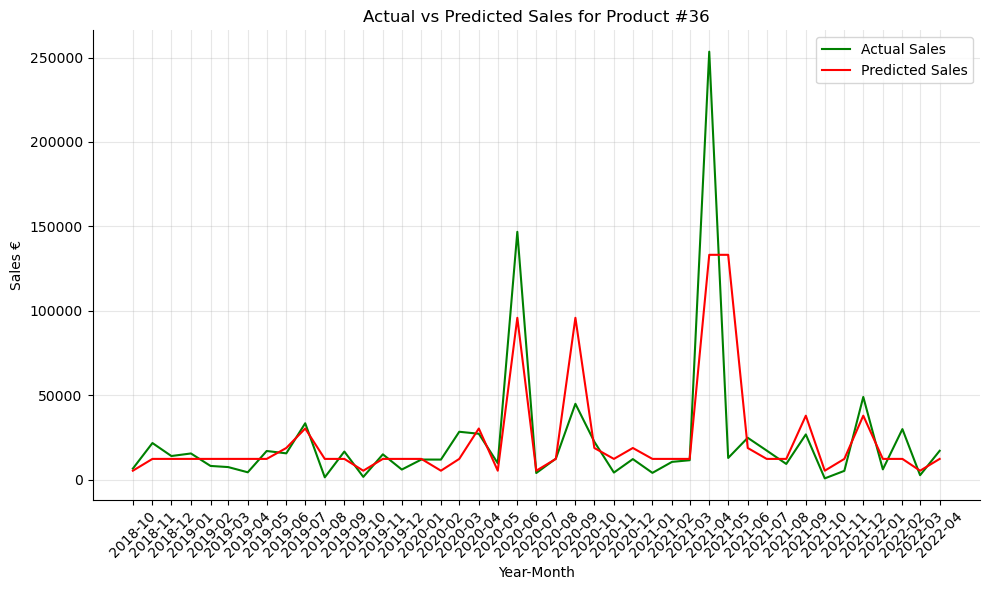

In [341]:
# Fit the model
dt_model.fit(X, y)

# Predict sales using the fitted model
predicted_sales = dt_model.predict(X)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(p36['Full_Date'], y, label='Actual Sales', color='green')

# Plot predicted sales
plt.plot(p36['Full_Date'], predicted_sales, label='Predicted Sales', color='red')

# Details
plt.title('Actual vs Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
    
# Label settings
plt.xticks(rotation=45)
plt.xticks(p36['Full_Date'], p36['Full_Date'].dt.strftime('%Y-%m'))

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

**NEURAL PROPHET**

In [342]:
df = pd.DataFrame({
    'ds': p36['Full_Date'],
    'y': y
})

set_random_seed(0)
model_ph36 = NeuralProphet()
model_ph36.set_plotting_backend("plotly-static")

In [343]:
df_train, df_val = model_ph36.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 43
Train dataset size: 35
Validation dataset size: 8


Finding best initial lr:   0%|          | 0/203 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,21633.386719,28198.488281,0.174415,0.0,0,36733.824219,50512.949219,0.287445,0.0
1,22409.601562,29355.390625,0.188167,0.0,1,34024.601562,43967.125000,0.262494,0.0
2,23002.513672,30322.632812,0.200692,0.0,2,34762.687500,45396.074219,0.270741,0.0
3,23518.414062,31254.787109,0.212908,0.0,3,33860.113281,43804.500000,0.251107,0.0
4,24452.976562,32117.652344,0.224685,0.0,4,29815.644531,40223.757812,0.220623,0.0
...,...,...,...,...,...,...,...,...,...
375,15570.306641,17752.681641,0.090261,0.0,375,14022.248047,27045.796875,0.105709,0.0
376,15568.323242,17750.632812,0.090234,0.0,376,18366.902344,31853.099609,0.147678,0.0
377,15564.315430,17746.935547,0.090202,0.0,377,23201.472656,37231.023438,0.221363,0.0
378,15580.818359,17754.677734,0.090323,0.0,378,14425.523438,27687.386719,0.107875,0.0


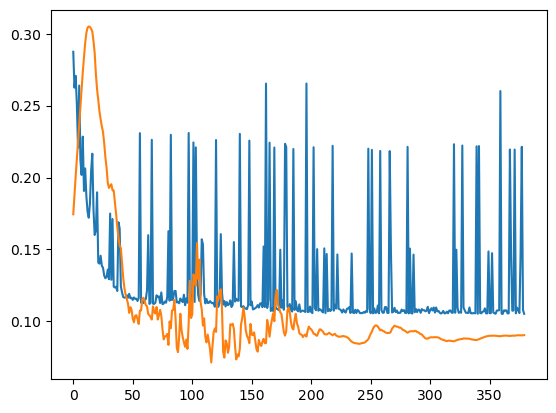

In [344]:
nprof_metrics = model_ph36.fit(df_train, validation_df=df_val, progress="plot")
nprof_metrics

Predicting: 5it [00:00, ?it/s]

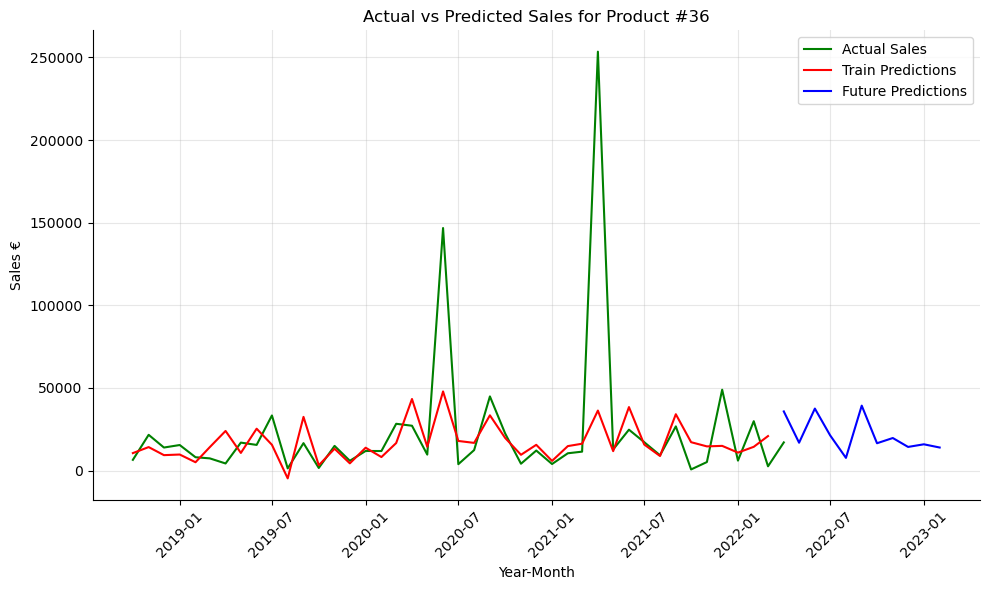

In [345]:
future = model_ph36.make_future_dataframe(df, n_historic_predictions=True, periods=10)
forecast = model_ph36.predict(future)

# Plot actual sales
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['y'], label='Actual Sales', color='green')

# Plot train predictions in red
train_end_idx = len(df) - 1
plt.plot(forecast['ds'][:train_end_idx], forecast['yhat1'][:train_end_idx], label='Train Predictions', color='red')

# Plot future predictions in blue
plt.plot(forecast['ds'][train_end_idx:], forecast['yhat1'][train_end_idx:], label='Future Predictions', color='blue')

# Details
plt.title('Actual vs Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3) 
plt.tight_layout()
sns.despine()
plt.show()

In [346]:
# Compute RMSE
forecast = model_ph36.predict(future)
predicted_sales = forecast['yhat1'].values[:-10]  # Extract the predicted sales for the next 10 months
actual_sales = forecast['y'].values[:-10]  # Replace ... with the actual sales data for the next 10 months
rmse = np.sqrt(mean_squared_error(actual_sales, predicted_sales))

# Print RMSE
print("RMSE:", round(rmse,2))

Predicting: 5it [00:00, ?it/s]

RMSE: 37932.11


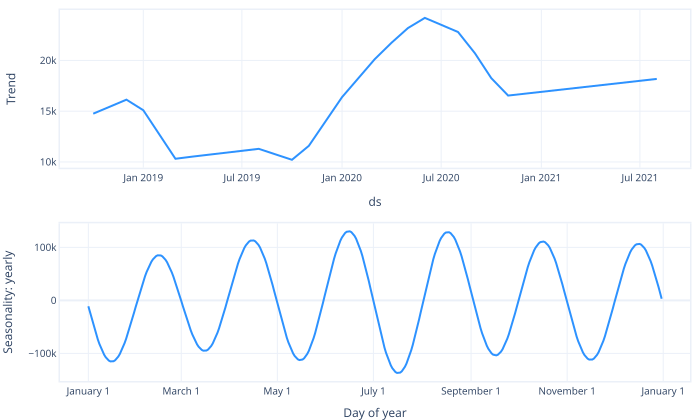

In [347]:
model_ph36.plot_parameters(components=["trend", "seasonality"])

In [348]:
forecast

,ds,y,yhat1,trend,season_yearly
0,2018-10-01,6474.600098,10551.865234,14755.791016,-4203.925293
1,2018-11-01,21617.609375,14197.760742,15457.436523,-1259.676025
2,2018-12-01,13924.519531,9322.043945,16136.448242,-6814.404297
3,2019-01-01,15444.389648,9695.666016,15093.451172,-5397.786133
4,2019-02-01,8051.149902,5029.793457,12561.820312,-7532.027344
5,2019-03-01,7373.419922,14160.206055,10315.379883,3844.825928
6,2019-04-01,4280.250000,23969.156250,10524.965820,13444.191406
7,2019-05-01,16905.320312,10666.217773,10727.790039,-61.571629
8,2019-06-01,15516.219727,25329.810547,10940.465820,14389.345703
9,2019-07-01,33334.410156,15588.030273,11148.685547,4439.344727


**ARIMA**

In [349]:
# Define the range of values for p, d, q
p_values = range(0, 5)  # Adjust the range as needed
d_values = range(0, 5)  # Adjust the range as needed
q_values = range(0, 5)  # Adjust the range as needed

# Initialize variables to store the best model and its RMSE
best_model = None
best_rmse = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q
for p, d, q in product(p_values, d_values, q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (ARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit ARIMA model for the current combination of p, d, q
        arima_model = sm.tsa.ARIMA(df['y'], order=(p, d, q))
        arima_fit = arima_model.fit()
        
        # Calculate RMSE for the current model
        predictions = arima_fit.predict(start=1, end=len(df)-1, typ='levels')  # Predictions starting from the second observation
        rmse = np.sqrt(mean_squared_error(df['y'][1:], predictions))
        
        # Update the best model and RMSE if the current model has lower RMSE
        if rmse < best_rmse:
            best_model = arima_fit
            best_rmse = rmse
            
    except Exception as e:
        print(f"Error fitting ARIMA model with p={p}, d={d}, q={q}: {e}")

# Print the best model summary and its RMSE
print("Best ARIMA Model:")
print(best_model.summary())
print("Best RMSE:", best_rmse)

Best ARIMA Model:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   43
Model:                 ARIMA(4, 0, 3)   Log Likelihood                -518.405
Date:                Wed, 10 Apr 2024   AIC                           1054.809
Time:                        21:23:15   BIC                           1070.660
Sample:                             0   HQIC                          1060.655
                                 - 43                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.322e+04   1.29e+04      1.795      0.073   -2136.832    4.86e+04
ar.L1         -0.3468      1.617     -0.214      0.830      -3.517       2.823
ar.L2          0.2627      1.762  

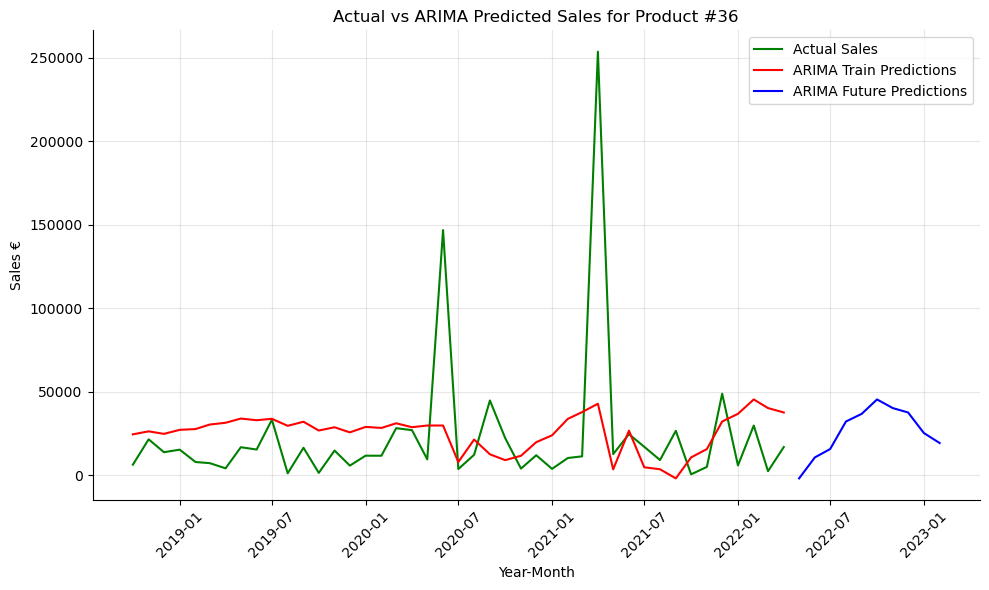

Train RMSE: 43922.161987395804
Validation RMSE: 23323.46098825638


In [350]:
# Fit ARIMA model
arima_model36 = ARIMA(df_train['y'], order=(4,0,3))
arima_fit = arima_model36.fit()

# Generate future dates
arima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
arima_forecast = arima_fit.forecast(steps=10)

# Calculate train and validation predictions
train_predictions = arima_fit.predict(start = 0, end = len(df_train)-1)
validation_predictions = arima_fit.predict(start = len(df_train), end = len(df)-1)

# Calculate train and validation scores
train_score = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
val_score = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='ARIMA Train Predictions', color='red') # Plot ARIMA train predictions
plt.plot(arima_future_dates, arima_forecast, label='ARIMA Future Predictions', color='blue') # Plot ARIMA future predictions

# Details
plt.title('Actual vs ARIMA Predicted Sales for Product #36')
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train and validation scores
print("Train RMSE:", train_score)
print("Validation RMSE:", val_score)

**SARIMA**

In [351]:
# Define the range of values for p, d, q, P, D, Q, and m
p_values = range(0, 3)  # Adjust the range as needed
d_values = range(0, 2)  # Adjust the range as needed
q_values = range(0, 3)  # Adjust the range as needed
P_values = range(0, 3)  # Adjust the range as needed
D_values = range(0, 2)  # Adjust the range as needed
Q_values = range(0, 3)  # Adjust the range as needed
m = 12  # Seasonal period

# Initialize variables to store the best model and its AIC
best_model = None
best_aic = float('inf')  # Initialize with a large value

# Iterate over all possible combinations of p, d, q, P, D, Q
for p, d, q, P, D, Q in product(p_values, d_values, q_values, P_values, D_values, Q_values):
    # Skip the combination if d is 0 and both p and q are also 0 (SARIMA model requires at least one differencing)
    if d == 0 and p == 0 and q == 0:
        continue
    
    try:
        # Fit SARIMA model for the current combination of parameters
        sarima_model = sm.tsa.SARIMAX(df['y'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        sarima_fit = sarima_model.fit()
        
        # Update the best model and AIC if the current model has lower AIC
        if sarima_fit.aic < best_aic:
            best_model = sarima_fit
            best_aic = sarima_fit.aic
            
    except Exception as e:
        print(f"Error fitting SARIMA model with parameters p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}: {e}")

# Print the best model summary and its AIC
print("Best SARIMA Model:")
print(best_model.summary())
print("Best AIC:", best_aic)

Error fitting SARIMA model with parameters p=2, d=1, q=2, P=2, D=1, Q=1: LU decomposition error.
Best SARIMA Model:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   43
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 12)   Log Likelihood                -374.658
Date:                             Wed, 10 Apr 2024   AIC                            755.316
Time:                                     21:25:37   BIC                            759.520
Sample:                                          0   HQIC                           756.661
                                              - 43                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------

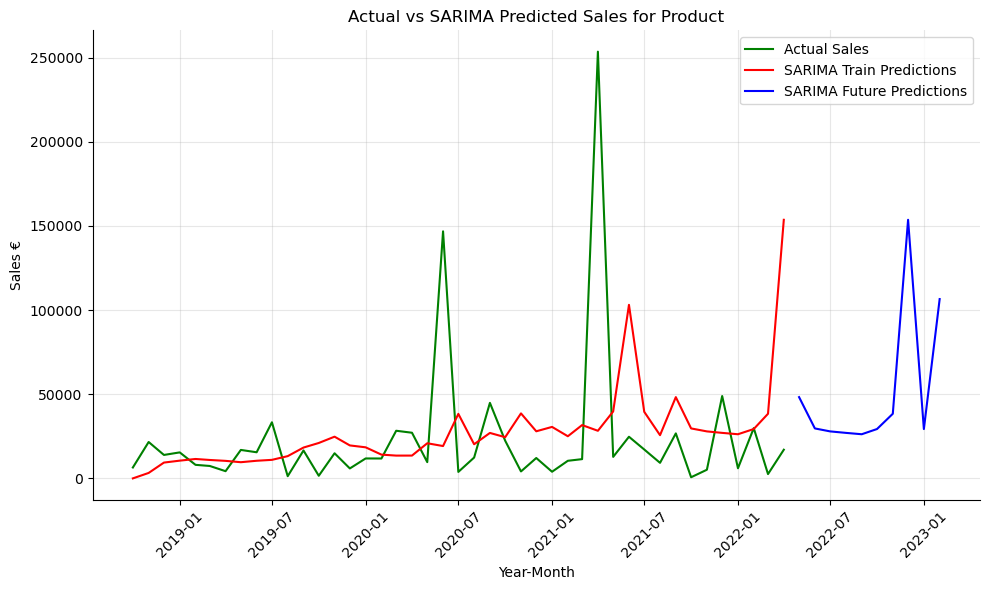

Train RMSE: 48238.8703424288
Validation RMSE: 53217.6334920957


In [352]:
# Fit SARIMA model
sarima_model36 = SARIMAX(df_train['y'], order=(0, 1, 1), seasonal_order=(1, 1, 0, 12)) # Example order, you can adjust as needed
sarima_fit = sarima_model36.fit()

# Generate future dates
sarima_future_dates = pd.to_datetime(['2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', 
                      '2022-12-01','2023-01-01', '2023-02-01'])

# Make predictions
sarima_forecast = sarima_fit.get_forecast(steps=10)

# Calculate RMSE
train_predictions = sarima_fit.predict(start=0, end=len(df_train)-1)
train_rmse = np.sqrt(mean_squared_error(df_train['y'], train_predictions))
validation_predictions = sarima_fit.predict(start = len(df_train), end = len(df)-1)
val_rmse = np.sqrt(mean_squared_error(df_val['y'], validation_predictions))

# Plot actual vs predicted sales
plt.figure(figsize=(10, 6))
plt.plot(df['ds'], df['y'], label='Actual Sales', color='green')  # Plot actual sales
plt.plot(df['ds'], pd.concat([train_predictions, validation_predictions]), label='SARIMA Train Predictions', color='red') # Plot SARIMA train predictions
plt.plot(sarima_future_dates, sarima_forecast.predicted_mean, label='SARIMA Future Predictions', color='blue') # Plot SARIMA future predictions

# Details
plt.title('Actual vs SARIMA Predicted Sales for Product'.format(train_rmse))
plt.xlabel('Year-Month')
plt.ylabel('Sales €')

# Label settings
plt.xticks(rotation=45)

# Decorations
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()

# Print train RMSE
print("Train RMSE:", train_rmse)
print("Validation RMSE:", val_rmse)

**Best Choice**

| Model | RMSE Score| 
|----------|----------|
| Neural Prophet    | 37932.11 |  
| ARIMA    | 23323.46    | 
| SARIMA    | 53217.63   |

In [353]:
predicted_values_36 = arima_forecast.to_list()
predicted_table_36 = pd.DataFrame({'date': arima_future_dates, 'y_hat': arima_forecast.to_list()})

<hr>

<a class="anchor" id="3">

# 3. Final Result & Export

</a>

| Product | Best Model | Score |
|----------|----------|----------|
| #1   | Neural Prophet    | 2260577.91    |
| #3   | Neural Prophet   | 1480871.38    |
| #4    | ARIMA    | 122955.48    |
| #5    | Neural Prophet   | 3206408.8    |
| #6    | ARIMA    |261838.5    |
| #8    | Neural Prophet    |271645.88    |
| #9    | ARIMA    |4740.82    |
| #11    | SARIMA    | 141456.3    |
| #12    | Neural Prophet    | 121590.02    |
| #13   | Neural Prophet   | 13585.74   |
| #14   | ARIMA   | 12761.56   |
| #16   | SARIMA   | 187291.23   |
| #20   | ARIMA   | 2326.14   |
| #36   | ARIMA   | 23323.46   |

In [354]:
# Import Test Set Template
test_set=pd.read_csv('Case2_Test Set Template.csv', sep=';')

In [355]:
# Set the locale to German
locale.setlocale(locale.LC_TIME, "de_DE.UTF-8")

# Convert "Month Year" column to datetime format (different name)
test_set['Month_Year'] = pd.to_datetime(test_set['Month Year'], format='%b %y')

# Sort by Product and Date
test_sorted = test_set.sort_values(by=['Mapped_GCK', 'Month_Year']) 

In [356]:
# List of predicted values
fill_values = {
    '#1': pd.Series(predicted_values_1),
    '#3': pd.Series(predicted_values_3),
    '#4': pd.Series(predicted_values_4),
    '#5': pd.Series(predicted_values_5),
    '#6': pd.Series(predicted_values_6),
    '#8': pd.Series(predicted_values_8),
    '#9': pd.Series(predicted_values_9),
    '#11': pd.Series(predicted_values_11),
    '#12': pd.Series(predicted_values_12),
    '#13': pd.Series(predicted_values_13),
    '#14': pd.Series(predicted_values_14),
    '#16': pd.Series(predicted_values_16),
    '#20': pd.Series(predicted_values_20),
    '#36': pd.Series(predicted_values_36)
}

# Keep track of the last filled index for each group
last_filled_index = {}

def fill_missing(group):
    global last_filled_index  # Use the last_filled_index dictionary defined outside the function
    fill_value_series = fill_values.get(group.name)  # Get the corresponding Series from fill_values dictionary
    
    # Get the index of the last filled value for the current group
    last_index = last_filled_index.get(group.name, -1)
    
    # Iterate over missing values in Sales_EUR column and fill them with values from fill_value_series
    for index, value in group['Sales_EUR'].items():
        if pd.isnull(value):
            last_index += 1
            # Ifthe end of fill_value_series is reached, start over from the beginning
            if last_index >= len(fill_value_series):
                last_index = 0
            group.at[index, 'Sales_EUR'] = fill_value_series.iloc[last_index]
    
    # Update the last filled index for the current group
    last_filled_index[group.name] = last_index
    
    return group

# Apply the fill_missing function to each group
filled_df = test_sorted.groupby('Mapped_GCK').apply(fill_missing)

# Display the filled DataFrame
filled_df


,Month Year,Mapped_GCK,Sales_EUR,Month_Year
130,Mai 22,#1,3.690161e+07,2022-05-01
131,Jun 22,#1,3.535116e+07,2022-06-01
132,Jul 22,#1,3.731634e+07,2022-07-01
133,Aug 22,#1,3.719663e+07,2022-08-01
134,Sep 22,#1,3.828417e+07,2022-09-01
...,...,...,...,...
55,Okt 22,#9,7.365982e+03,2022-10-01
56,Nov 22,#9,7.629013e+03,2022-11-01
57,Dez 22,#9,7.413259e+03,2022-12-01
58,Jan 23,#9,7.590233e+03,2023-01-01


In [360]:
# Select columns for new test dataset
new_test_set = filled_df[['Month Year', 'Mapped_GCK', 'Sales_EUR']].reset_index(drop=True)

# Round Sales for 2 decimal houses
new_test_set['Sales_EUR'] = round(new_test_set['Sales_EUR'],2) 

In [361]:
# Export
new_test_set.to_csv('Case2_Test Set.csv', sep=';', index=False)